### Imports

In [ ]:
!pip install -U sentence-transformers
!pip install evaluate
!pip install bert_score

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import torch
import time
import random
import json
from evaluate import load
from collections import Counter
from sentence_transformers import SentenceTransformer
from huggingface_hub import InferenceClient
from google.colab import userdata
from google.colab import drive
from IPython.display import clear_output
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import normalize, FunctionTransformer
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D
from itertools import permutations
from tqdm import tqdm


clear_output()
# drive.mount('/content/drive')

# Import/Create BERT embeddings
import_embeddings = True

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data Exploration & Preprocessing

In [ ]:
# Load the dataset

raw_df_ads = pd.read_csv('data/fb_ad_library_mapped_party_IT.csv')
raw_df_target = pd.read_csv('data/fb_targeting_IT.csv')

In [ ]:
print(f"#bylines: {len(raw_df_ads['bylines'].unique())}, #page names: {len(raw_df_ads['page_name'].unique())}, #parties: {len(raw_df_ads['party'].unique())}")

print(raw_df_ads['party'].unique())

#bylines: 930, #page names: 966, #parties: 13
["['PD']" "['LEGA', 'FDI', 'FI']" "['FDI']" "['LEGA']" "['3POLO']"
 "['PD', 'AVD']" "['AVD']" "['M5S']" "['FI']" "['M5S', 'PD', 'AVD']"
 "['AVD', '3POLO']" "['AVD', 'PD']" "['FI', '3POLO']"]


In [ ]:
# Remove ads without text
raw_df_ads = raw_df_ads.dropna(subset=['ad_creative_bodies'])

# Change main coalitions' names
raw_df_ads['party'] = raw_df_ads['party'].apply(lambda x: "['CDX']" if x == "['LEGA', 'FDI', 'FI']" else x)
raw_df_ads['party'] = raw_df_ads['party'].apply(lambda x: "['CSX']" if x == "['PD', 'AVD']" else x)
# Change ['AVD', 'PD'] in ['AVD']
raw_df_ads['party'] = raw_df_ads['party'].apply(lambda x: "['AVD']" if x == "['AVD', 'PD']" else x)

# Remove weird coalitions
coalitions_to_remove = ["['AVD', '3POLO']", "['M5S', 'PD', 'AVD']", "['FI', '3POLO']"]
raw_df_ads = raw_df_ads[~raw_df_ads['party'].isin(coalitions_to_remove)]

display(raw_df_ads['party'].value_counts())

csx_parties = ["['PD']", "['AVD']", "['CSX']"]
cdx_parties = ["['FDI']", "['LEGA']", "['FI']", "['CDX']"]

# Select relevant columns
relevant_columns_ads = [
    'id', 'page_name', 'party', 'ad_creative_bodies', 'spend', 'impressions'
]

# Extract the relevant data
data_ads = raw_df_ads[relevant_columns_ads]
data_ads.head()

<ipython-input-6-223dc78304dd>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_df_ads['party'] = raw_df_ads['party'].apply(lambda x: "['CDX']" if x == "['LEGA', 'FDI', 'FI']" else x)
<ipython-input-6-223dc78304dd>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_df_ads['party'] = raw_df_ads['party'].apply(lambda x: "['CSX']" if x == "['PD', 'AVD']" else x)
<ipython-input-6-223dc78304dd>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row

,count
party,
['CDX'],2514
['3POLO'],2276
['CSX'],2223
['PD'],1787
['FDI'],961
['LEGA'],952
['M5S'],804
['AVD'],773
['FI'],669


,id,page_name,party,ad_creative_bodies,spend,impressions
0,456125966582131,Partito Democratico,['PD'],Non è vero che siamo tutti uguali. La destra...,49.5,3499.5
1,1200076797280541,Partito Democratico,['PD'],"Abbiamo incontrato l'Italia, #stradaperstrada,...",49.5,3499.5
2,757515065319791,Partito Democratico,['PD'],“Il 25 settembre mandiamo a casa questa destra...,49.5,24999.5
3,1763853400674090,Partito Democratico,['PD'],Alle elezioni politiche del 25 settembre per e...,49.5,4999.5
4,412317477641961,Partito Democratico,['PD'],#elezionipolitiche2022: si vota solo domenica ...,49.5,499.5


In [ ]:
# # Display value counts for each column
# display(raw_df_target['gender'].value_counts())
# display(raw_df_target['include_location'].value_counts())
# display(raw_df_target['exclude_location'].value_counts())
# display(raw_df_target['language'].value_counts())
# display(raw_df_target['include'].value_counts())
# display(raw_df_target['exclude'].value_counts())

# display(raw_df_target['location_type'].value_counts())
# display(raw_df_target['include_connection'].value_counts())
# display(raw_df_target['include_friend_connection'].value_counts())
# display(raw_df_target['exclude_connection'].value_counts())
# display(raw_df_target['include_custom_audience'].value_counts())
# display(raw_df_target['exclude_custom_audience'].value_counts())
# display(raw_df_target['include_data_file_custom_audience'].value_counts())
# display(raw_df_target['exclude_data_file_custom_audience'].value_counts())
# display(raw_df_target['include_lookalike'].value_counts())
# display(raw_df_target['exclude_lookalike'].value_counts())
# display(raw_df_target['include_audience_data_missing'].value_counts())
# display(raw_df_target['exclude_audience_data_missing'].value_counts())
# display(raw_df_target['ds'].value_counts())

In [ ]:
# Select relevant columns
relevant_columns_target = [
    'archive_id', 'gender', 'include_location', 'exclude_location', 'language', 'exclude'
]

# Extract the relevant data
data_target = raw_df_target[relevant_columns_target]
data_target.head()

,archive_id,gender,include_location,exclude_location,language,exclude
0,634947318043693,All,"{""Italy"":{""Sicilia"":{}}}",NaN,NaN,{}
1,456125966582131,All,"{""Italy"":{}}",NaN,NaN,{}
2,653020412831982,All,"{""Italy"":{""Tuscany"":{""Altopascio"":[""Altopascio...",NaN,NaN,{}
3,3942068599351147,All,"{""Worldwide"":{}}",NaN,NaN,{}
4,5480510138691284,All,"{""Italy"":{}}",NaN,Italian,{}


In [ ]:
merged_df = pd.merge(data_ads, data_target, left_on='id', right_on='archive_id', how='left')
merged_data = merged_df.drop('archive_id', axis=1)

merged_data

,id,page_name,party,ad_creative_bodies,spend,impressions,gender,include_location,exclude_location,language,exclude
0,456125966582131,Partito Democratico,['PD'],Non è vero che siamo tutti uguali. La destra...,49.5,3499.5,All,"{""Italy"":{}}",NaN,NaN,{}
1,1200076797280541,Partito Democratico,['PD'],"Abbiamo incontrato l'Italia, #stradaperstrada,...",49.5,3499.5,All,"{""Italy"":{}}",NaN,NaN,{}
2,757515065319791,Partito Democratico,['PD'],“Il 25 settembre mandiamo a casa questa destra...,49.5,24999.5,All,"{""Italy"":{}}",NaN,NaN,{}
3,1763853400674090,Partito Democratico,['PD'],Alle elezioni politiche del 25 settembre per e...,49.5,4999.5,All,"{""Italy"":{}}",NaN,NaN,{}
4,412317477641961,Partito Democratico,['PD'],#elezionipolitiche2022: si vota solo domenica ...,49.5,499.5,All,"{""Italy"":{}}",NaN,NaN,{}
...,...,...,...,...,...,...,...,...,...,...,...
13092,495658385264388,Partito Democratico Biellese,['PD'],📢𝗜𝗟 𝗠𝗜𝗡𝗜𝗦𝗧𝗥𝗢 𝗔𝗡𝗗𝗥𝗘𝗔 𝗢𝗥𝗟𝗔𝗡𝗗𝗢 𝗔𝗟𝗟𝗔 𝗙𝗘𝗦𝗧𝗔 𝗗𝗘𝗟𝗟'𝗨𝗡...,49.5,1999.5,All,"{""Italy"":{""Piedmont"":{""Biella"":[""Biella (+52 k...",NaN,NaN,{}
13093,495658385264388,Partito Democratico Biellese,['PD'],📢𝗜𝗟 𝗠𝗜𝗡𝗜𝗦𝗧𝗥𝗢 𝗔𝗡𝗗𝗥𝗘𝗔 𝗢𝗥𝗟𝗔𝗡𝗗𝗢 𝗔𝗟𝗟𝗔 𝗙𝗘𝗦𝗧𝗔 𝗗𝗘𝗟𝗟'𝗨𝗡...,49.5,1999.5,All,"{""Italy"":{""Piedmont"":{""Biella"":[""Biella (+52 k...",NaN,NaN,{}
13094,587797859658481,Marcello Cherchi - Elezioni 2022,['M5S'],Ieri c'è stata la presentazione dei candidati ...,49.5,499.5,All,"{""Italy"":{""Sardinia"":{}}}",NaN,NaN,{}
13095,880581220013830,Gaetana Russo,['FDI'],"Si vota Domenica 25 Settembre, dalle 7.00 alle...",49.5,6499.5,All,"{""Italy"":{""Emilia-Romagna"":{""Salsomaggiore"":[""...",NaN,NaN,{}


# RealAds Embedding

## {S} Import

In [ ]:
if import_embeddings:
    data = pd.read_csv('data/IT22_withEmbeddings.csv')

    # Convert the 'bert_embeddings' column back to lists of floats
    data['bert_embeddings'] = data['bert_embeddings'].apply(
        lambda x: np.array(list(map(float, x.split(','))))
    )

    parties = sorted(data['party'].unique())
    n_parties = len(parties)
    print(f"{n_parties} Parties: {parties}")

    print("Embeddings loaded successfully.")

    display(data)

9 Parties: ["['3POLO']", "['AVD']", "['CDX']", "['CSX']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]
Embeddings loaded successfully.


,id,page_name,party,ad_creative_bodies,spend,impressions,gender,include_location,exclude_location,language,exclude,bert_embeddings
0,456125966582131,Partito Democratico,['PD'],Non è vero che siamo tutti uguali. La destra...,49.5,3499.5,All,"{""Italy"":{}}",NaN,NaN,{},"[-0.06150718, -0.26721066, 0.38996065, -0.4675..."
1,1200076797280541,Partito Democratico,['PD'],"Abbiamo incontrato l'Italia, #stradaperstrada,...",49.5,3499.5,All,"{""Italy"":{}}",NaN,NaN,{},"[-0.3777989, 0.58973104, -0.15772691, -0.64098..."
2,757515065319791,Partito Democratico,['PD'],“Il 25 settembre mandiamo a casa questa destra...,49.5,24999.5,All,"{""Italy"":{}}",NaN,NaN,{},"[-0.16382436, 0.099419884, 0.20287763, 0.23835..."
3,1763853400674090,Partito Democratico,['PD'],Alle elezioni politiche del 25 settembre per e...,49.5,4999.5,All,"{""Italy"":{}}",NaN,NaN,{},"[-0.6412354, 0.0783592, 0.034934215, 0.1447092..."
4,412317477641961,Partito Democratico,['PD'],#elezionipolitiche2022: si vota solo domenica ...,49.5,499.5,All,"{""Italy"":{}}",NaN,NaN,{},"[-0.5493597, 0.6423182, 0.52449113, -0.0162951..."
...,...,...,...,...,...,...,...,...,...,...,...,...
13092,495658385264388,Partito Democratico Biellese,['PD'],📢𝗜𝗟 𝗠𝗜𝗡𝗜𝗦𝗧𝗥𝗢 𝗔𝗡𝗗𝗥𝗘𝗔 𝗢𝗥𝗟𝗔𝗡𝗗𝗢 𝗔𝗟𝗟𝗔 𝗙𝗘𝗦𝗧𝗔 𝗗𝗘𝗟𝗟'𝗨𝗡...,49.5,1999.5,All,"{""Italy"":{""Piedmont"":{""Biella"":[""Biella (+52 k...",NaN,NaN,{},"[0.018437274, -0.6815774, 0.10637959, -0.24920..."
13093,495658385264388,Partito Democratico Biellese,['PD'],📢𝗜𝗟 𝗠𝗜𝗡𝗜𝗦𝗧𝗥𝗢 𝗔𝗡𝗗𝗥𝗘𝗔 𝗢𝗥𝗟𝗔𝗡𝗗𝗢 𝗔𝗟𝗟𝗔 𝗙𝗘𝗦𝗧𝗔 𝗗𝗘𝗟𝗟'𝗨𝗡...,49.5,1999.5,All,"{""Italy"":{""Piedmont"":{""Biella"":[""Biella (+52 k...",NaN,NaN,{},"[0.018437274, -0.6815774, 0.10637959, -0.24920..."
13094,587797859658481,Marcello Cherchi - Elezioni 2022,['M5S'],Ieri c'è stata la presentazione dei candidati ...,49.5,499.5,All,"{""Italy"":{""Sardinia"":{}}}",NaN,NaN,{},"[-0.24694069, -0.082510225, -0.7523396, -0.461..."
13095,880581220013830,Gaetana Russo,['FDI'],"Si vota Domenica 25 Settembre, dalle 7.00 alle...",49.5,6499.5,All,"{""Italy"":{""Emilia-Romagna"":{""Salsomaggiore"":[""...",NaN,NaN,{},"[-0.52583414, 0.39477322, 0.35956845, -0.16441..."


In [17]:
def aggregate_matrix(matrix, block_size):
    """
    Aggregate the matrix into blocks of size `block_size`.
    """
    n = matrix.shape[0]
    # Determine the shape of the new aggregated matrix
    new_shape = (n // block_size, block_size, n // block_size, block_size)
    # Aggregate blocks
    aggregated_matrix = matrix[:new_shape[0]*block_size, :new_shape[2]*block_size].reshape(new_shape).mean(axis=(1, 3))
    return aggregated_matrix

## Creation

In [ ]:
if not import_embeddings:
    model = SentenceTransformer('nickprock/sentence-bert-base-italian-xxl-uncased')

In [ ]:
if not import_embeddings:

    embeddings = []

    # Encode the sentences using the BERT model
    print("Processing embeddings for all texts...")

    for sentence in tqdm(merged_data['ad_creative_bodies'], desc="Embedding texts"):
        embedding = model.encode(sentence)
        embeddings.append(embedding)

    # Convert embeddings (lists of floats) to strings
    merged_data['bert_embeddings'] = embeddings
    merged_data['bert_embeddings'] = merged_data['bert_embeddings'].apply(lambda x: ','.join(map(str, x)))

    # Verify the column has been added
    print(merged_data.head()[:3])

    merged_data.to_csv('data/IT22_withEmbeddings.csv', index=False)

    print("Original data and embeddings have been saved to CSV files.")

# RealAds Similarity

In [ ]:
# Similarity analysis between all texts
global_similarity_matrix = cosine_similarity(data['bert_embeddings'].tolist())
print("Global Similarity matrix computed successfully.")


print(f"Similarity Mean {np.shape(global_similarity_matrix)}: {np.mean(global_similarity_matrix):.5f}")

Global Similarity matrix computed successfully.
Similarity Mean (13097, 13097): 0.39826


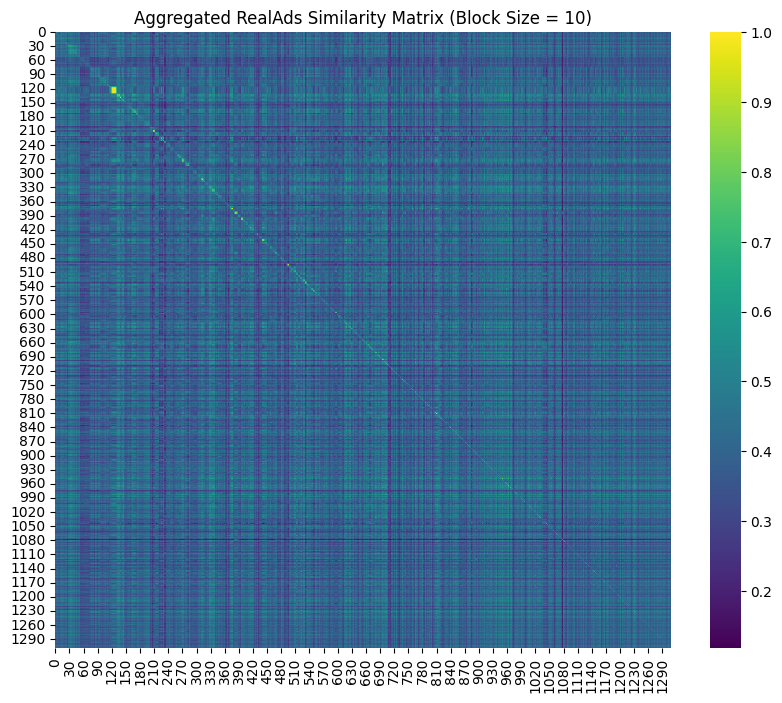

In [ ]:
block_size = 10
aggregated_matrix = aggregate_matrix(global_similarity_matrix, block_size)

# Plotting the aggregated similarity matrix
plt.figure(figsize=(10, 8))
sns.heatmap(aggregated_matrix, cmap='viridis', square=True)
plt.title('Aggregated RealAds Similarity Matrix (Block Size = {})'.format(block_size))
plt.show()

In [ ]:
csx_parties = ["['PD']", "['AVD']", "['CSX']"]
cdx_parties = ["['FDI']", "['LEGA']", "['FI']", "['CDX']"]

threshold = 0.99
n_values = 10000

clean_sm = global_similarity_matrix.copy()
np.fill_diagonal(clean_sm, 0)

removed_values = len(clean_sm[clean_sm > threshold])
print(f"Removed values > {threshold}: {removed_values}")

clean_sm[clean_sm > threshold] = 0

# Get the indices of the top x values
indices = np.argpartition(clean_sm.flatten(), -n_values)[-n_values:]

# Convert the flat indices to 2D indices
x, y = np.unravel_index(indices, clean_sm.shape)

columns_to_print = ['page_name', 'party']
# Print the top x values with their x and y coordinates
for i in range(len(indices)):
    # if data.iloc[x[i]]['party'] == data.iloc[y[i]]['party']:
    # if data.iloc[x[i]]['page_name'] == data.iloc[y[i]]['page_name']:
    #     continue

    if (data.iloc[x[i]]['party'] in csx_parties)  & (data.iloc[y[i]]['party'] in cdx_parties):
        print(f"Value: {clean_sm[x[i], y[i]]}, x: {x[i]}, y: {y[i]}, | Top {removed_values+(n_values-i)}")
        print(f"{data.iloc[x[i]]['party']} - {data.iloc[x[i]]['page_name']}\n{data.iloc[x[i]]['ad_creative_bodies']}")
        print(f"{data.iloc[y[i]]['party']} - {data.iloc[y[i]]['page_name']}\n{data.iloc[y[i]]['ad_creative_bodies']}")
        print()

Removed values > 0.99: 20542
Value: 0.9621814500119295, x: 11848, y: 11290, | Top 29479
['PD'] - Ernesto  Graziani Sindaco
3°𝗩𝗜𝗗𝗘𝗢 𝐀𝐆𝐑𝐈𝐂𝐎𝐋𝐓𝐔𝐑𝐀 𝑷𝒆𝒓 𝒖𝒏𝒐 𝒔𝒗𝒊𝒍𝒖𝒑𝒑𝒐 𝒆𝒄𝒐𝒔𝒐𝒔𝒕𝒆𝒏𝒊𝒃𝒊𝒍𝒆,  𝒑𝒆𝒓 𝒊𝒍 𝒇𝒖𝒕𝒖𝒓𝒐.
['FI'] - Forza Italia Veneto
𝑺𝒆 𝒏𝒐𝒏 𝒗𝒐𝒕𝒊 𝒏𝒐𝒏 𝒅𝒆𝒄𝒊𝒅𝒊. 𝑺𝒆 𝒏𝒐𝒏 𝒅𝒆𝒄𝒊𝒅𝒊, 𝒂𝒍𝒕𝒓𝒊 𝒅𝒆𝒄𝒊𝒅𝒐𝒏𝒐 𝒑𝒆𝒓 𝒕𝒆. 𝑻𝒊 𝒄𝒐𝒏𝒗𝒊𝒆𝒏𝒆?

Value: 0.9627933735835608, x: 10954, y: 11290, | Top 29202
['PD'] - Vito De Filippo
𝗖𝗼𝗻 𝗿𝗲𝘀𝗽𝗼𝗻𝘀𝗮𝗯𝗶𝗹𝗶𝘁𝗮̀. 𝗣𝗲𝗿 𝗶𝗹 𝗣𝗮𝗲𝘀𝗲, 𝗽𝗲𝗿 𝗹𝗮 𝗕𝗮𝘀𝗶𝗹𝗶𝗰𝗮𝘁𝗮.
['FI'] - Forza Italia Veneto
𝑺𝒆 𝒏𝒐𝒏 𝒗𝒐𝒕𝒊 𝒏𝒐𝒏 𝒅𝒆𝒄𝒊𝒅𝒊. 𝑺𝒆 𝒏𝒐𝒏 𝒅𝒆𝒄𝒊𝒅𝒊, 𝒂𝒍𝒕𝒓𝒊 𝒅𝒆𝒄𝒊𝒅𝒐𝒏𝒐 𝒑𝒆𝒓 𝒕𝒆. 𝑻𝒊 𝒄𝒐𝒏𝒗𝒊𝒆𝒏𝒆?

Value: 0.9627933735835608, x: 10953, y: 11290, | Top 29144
['PD'] - Vito De Filippo
𝗖𝗼𝗻 𝗿𝗲𝘀𝗽𝗼𝗻𝘀𝗮𝗯𝗶𝗹𝗶𝘁𝗮̀. 𝗣𝗲𝗿 𝗶𝗹 𝗣𝗮𝗲𝘀𝗲, 𝗽𝗲𝗿 𝗹𝗮 𝗕𝗮𝘀𝗶𝗹𝗶𝗰𝗮𝘁𝗮.
['FI'] - Forza Italia Veneto
𝑺𝒆 𝒏𝒐𝒏 𝒗𝒐𝒕𝒊 𝒏𝒐𝒏 𝒅𝒆𝒄𝒊𝒅𝒊. 𝑺𝒆 𝒏𝒐𝒏 𝒅𝒆𝒄𝒊𝒅𝒊, 𝒂𝒍𝒕𝒓𝒊 𝒅𝒆𝒄𝒊𝒅𝒐𝒏𝒐 𝒑𝒆𝒓 𝒕𝒆. 𝑻𝒊 𝒄𝒐𝒏𝒗𝒊𝒆𝒏𝒆?

Value: 0.9627933735835608, x: 10952, y: 11290, | Top 29089
['PD'] - Vito De Filippo
𝗖𝗼𝗻 𝗿𝗲𝘀𝗽𝗼𝗻𝘀𝗮𝗯𝗶𝗹𝗶𝘁𝗮̀. 𝗣𝗲𝗿 𝗶𝗹 𝗣𝗮𝗲𝘀𝗲, 𝗽𝗲𝗿 𝗹𝗮 𝗕𝗮𝘀𝗶𝗹𝗶𝗰𝗮𝘁𝗮.
['FI'] - Forza Italia Veneto
𝑺𝒆 𝒏𝒐𝒏 𝒗𝒐𝒕𝒊 𝒏𝒐𝒏 𝒅𝒆𝒄𝒊𝒅𝒊. 𝑺𝒆 𝒏𝒐𝒏 𝒅𝒆𝒄𝒊𝒅𝒊, 𝒂𝒍𝒕𝒓𝒊 𝒅𝒆𝒄𝒊𝒅

Global Similarity matrix computed successfully.



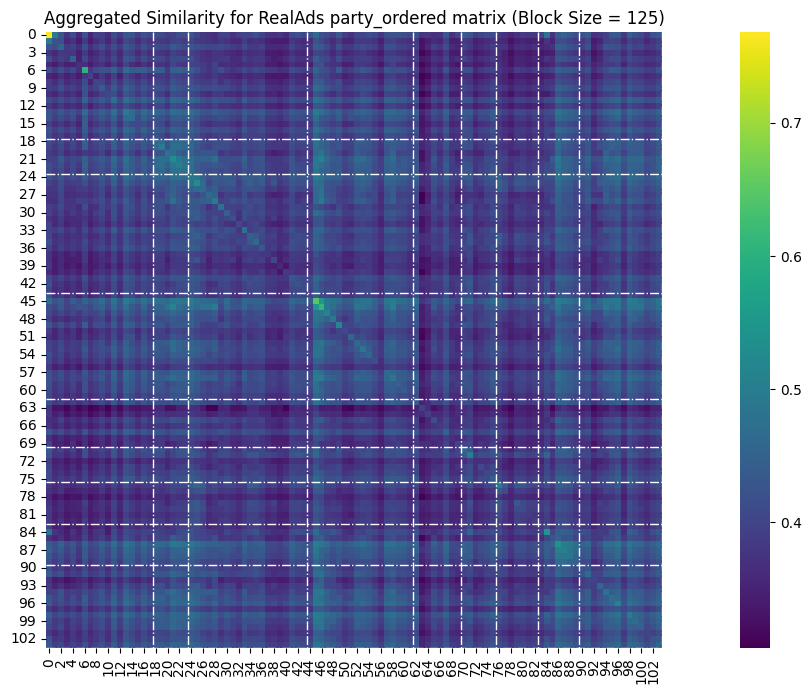

In [ ]:
ordered_embeddings = []

for party in sorted(data['party'].unique()):
    ordered_part = data[data['party'] == party]['bert_embeddings'].to_numpy()
    ordered_part = np.array([np.array(x) for x in ordered_part])
    ordered_embeddings.append(ordered_part)

# Combine the ordered parts into a single array
ordered_embeddings_flattened = np.vstack(ordered_embeddings)

# Similarity analysis between all ordered texts
global_similarity_matrix = cosine_similarity(ordered_embeddings_flattened)
print("Global Similarity matrix computed successfully.")
print()

plt.figure(figsize=(20, 8))

block_size = 125
aggregated_matrix = aggregate_matrix(global_similarity_matrix, block_size)

# Plotting the aggregated similarity matrix
sns.heatmap(aggregated_matrix, cmap='viridis', square=True)

# Add vertical lines at the specified xticks
cumulative_values = [2301, 3078, 5622, 7865, 8831, 9510, 10474, 11289, 13097]

for value in cumulative_values:
    value = value // block_size
    plt.vlines(x=value, ymin=0, ymax=aggregated_matrix.shape[0], color='white', linestyle='-.', linewidth=1)
    plt.hlines(y=value, xmin=0, xmax=aggregated_matrix.shape[1], color='white', linestyle='-.', linewidth=1)

plt.title('Aggregated Similarity for RealAds party_ordered matrix (Block Size = {})'.format(block_size))
plt.show()

Intra and inter similarities distribution

In [ ]:
block_borders = [x for x in cumulative_values]
block_borders.insert(0, 0)  # Insert 0 at the beginning

ads_per_party = data['party'].value_counts(sort=False).sort_index().tolist()

# Initialize dictionary to store similarities
party_similarities = {}

for i in range(n_parties):
  party_similarities[parties[i]] = {
      'intra': [],
      'inter': []
  }
  for j in range(n_parties):
    # Extract the block (i, j)
    start_row = block_borders[i]
    end_row = block_borders[i + 1]
    start_col = block_borders[j]
    end_col = block_borders[j + 1]

    block = global_similarity_matrix[start_row:end_row, start_col:end_col]
    # print(f"Block {i}, {j}: {block.shape}, {start_row}:{end_row}, {start_col}:{end_col}")

    if i == j:
      # Intra-similarity (within the same block)
      party_similarities[parties[i]]['intra'].extend(block[np.triu_indices(ads_per_party[i], k=1)])  # Exclude diagonal
    else:
      # Inter-similarity (between different blocks)
      party_similarities[parties[i]]['inter'].extend(block.flatten())

# Convert to NumPy arrays for further analysis within each block
for party in parties:
  party_similarities[party]['intra'] = np.array(party_similarities[party]['intra'])
  party_similarities[party]['inter'] = np.array(party_similarities[party]['inter'])
#   print(f"Party {party} - Intra: {len(party_similarities[party]['intra'])}, Inter: {len(party_similarities[party]['inter'])}")

print(f"party_similarities: {party_similarities.keys()}, {party_similarities[parties[0]].keys()}")

party_similarities: dict_keys(["['3POLO']", "['AVD']", "['CDX']", "['CSX']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]), dict_keys(['intra', 'inter'])


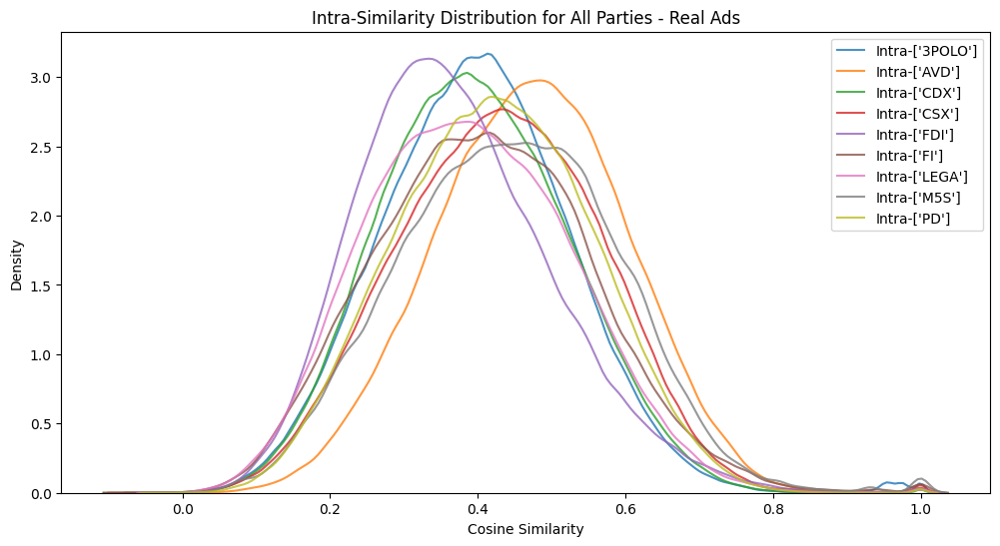

In [ ]:
plt.figure(figsize=(12, 6))
for topic in party_similarities:
  sns.kdeplot(party_similarities[topic]['intra'], label=f'Intra-{topic}', alpha=0.8)

plt.title('Intra-Similarity Distribution for All Parties - Real Ads')
plt.xlabel('Cosine Similarity')
plt.ylabel('Density')
plt.legend()
plt.show()

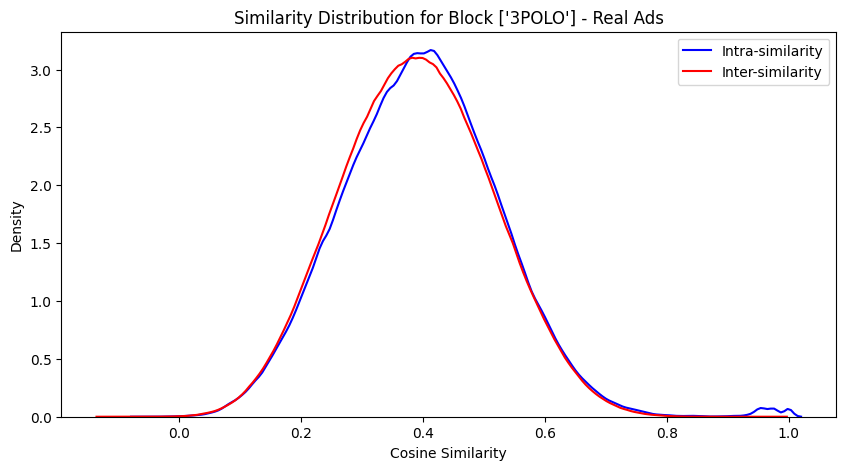

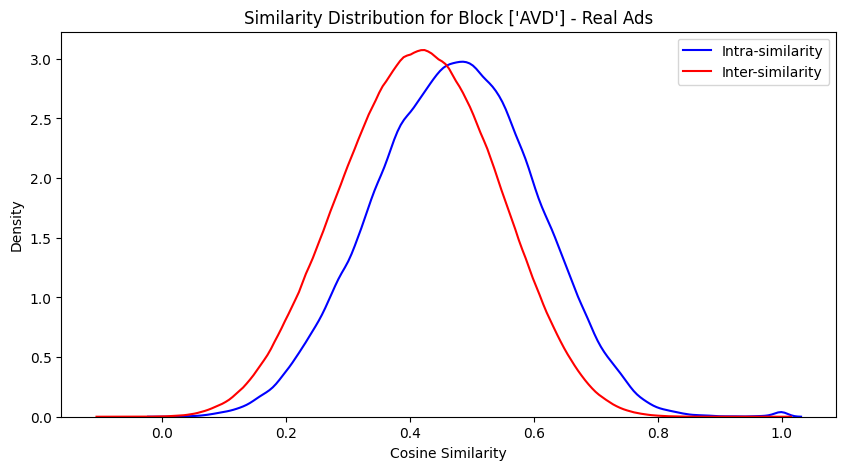

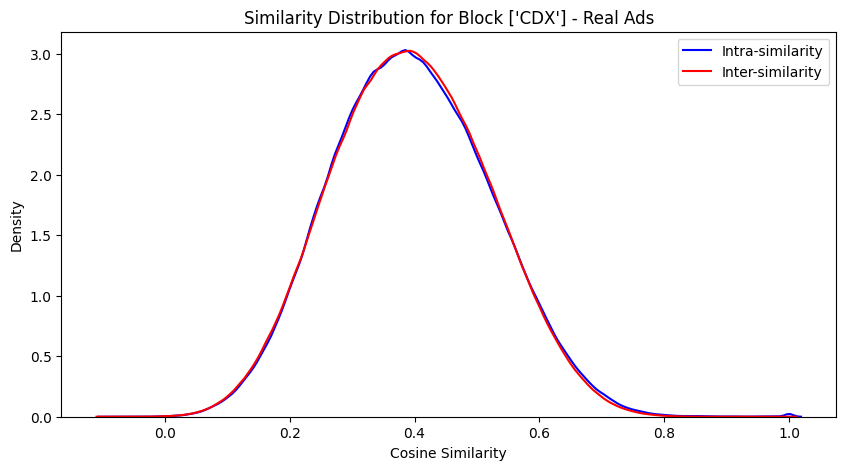

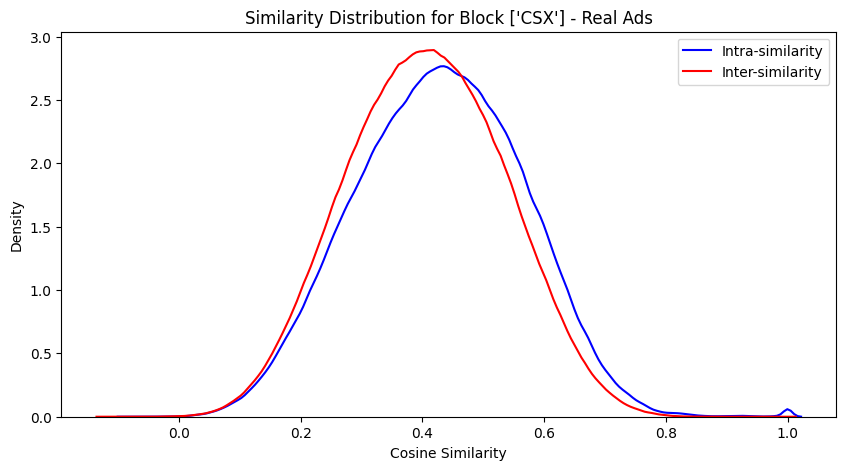

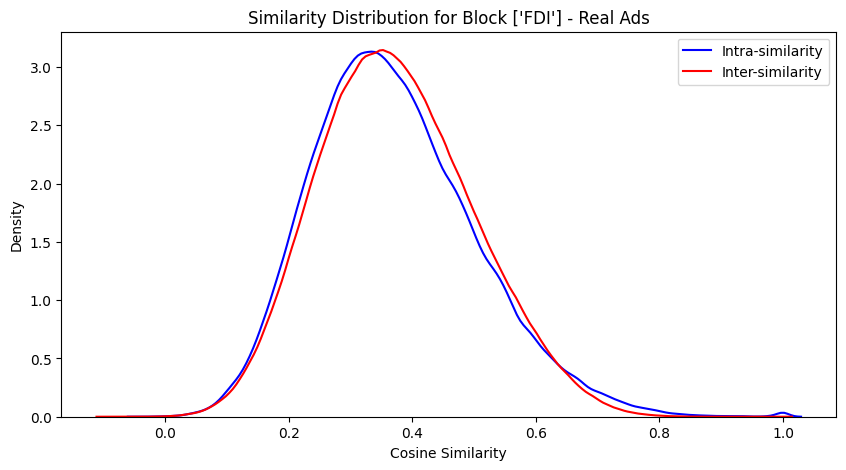

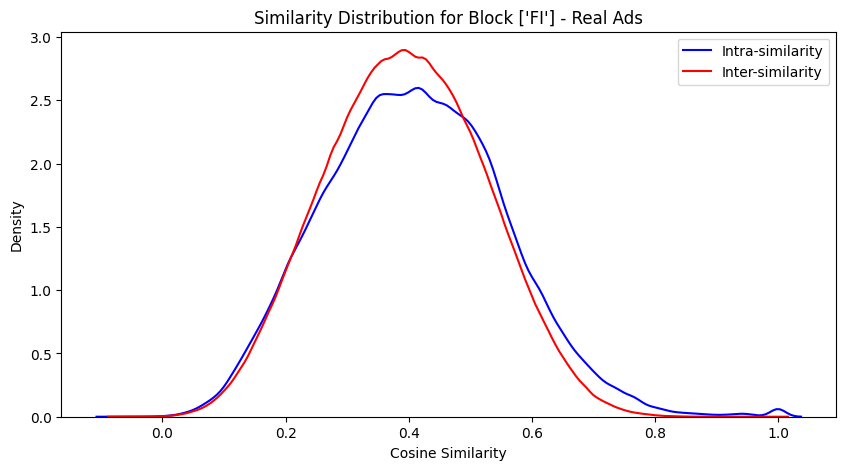

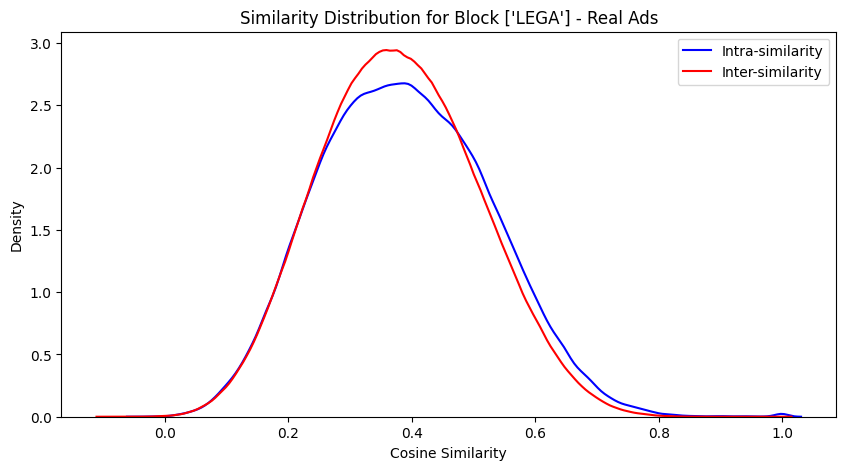

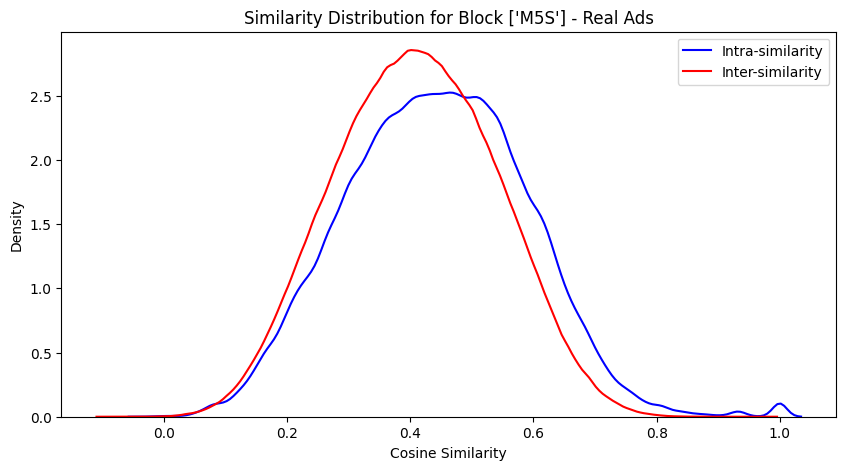

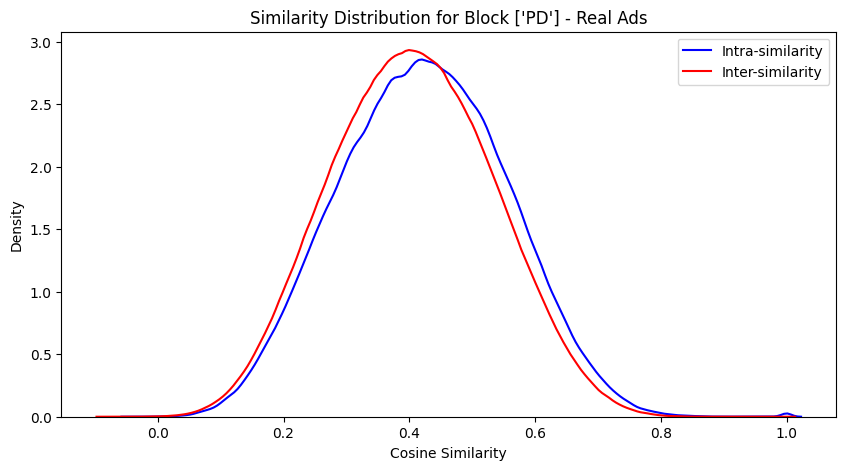

In [ ]:
for party in party_similarities:
  plt.figure(figsize=(10, 5))
  sns.kdeplot(party_similarities[party]['intra'], label='Intra-similarity', color='blue')
  sns.kdeplot(party_similarities[party]['inter'], label='Inter-similarity', color='red')

  plt.title(f'Similarity Distribution for Block {party} - Real Ads')
  plt.xlabel('Cosine Similarity')
  plt.ylabel('Density')
  plt.legend()
  plt.show()

Global Similarity matrix computed successfully.



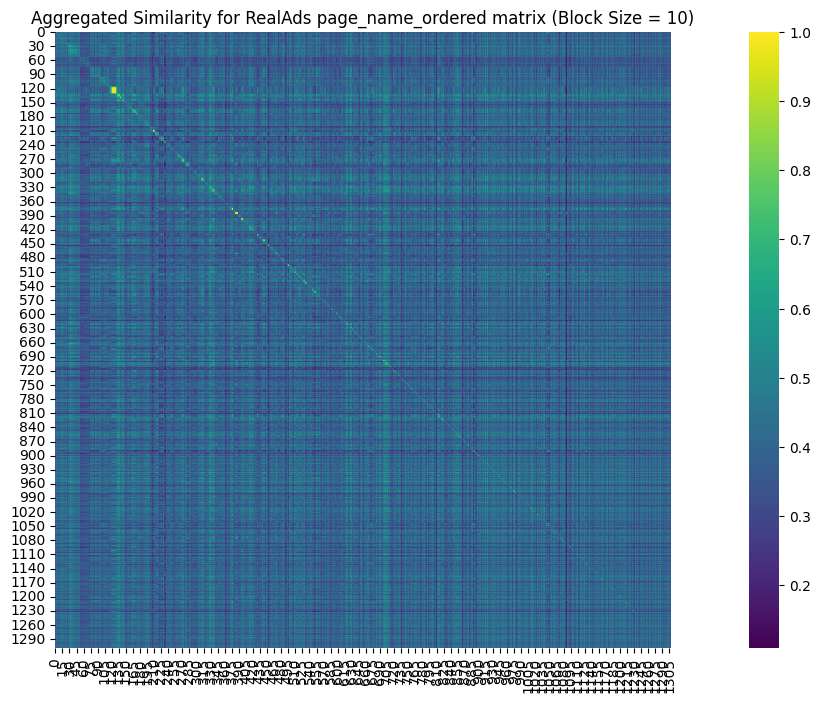

In [ ]:
ordered_embeddings = []

for page_name in data['page_name'].unique():
    ordered_part = data[data['page_name'] == page_name]['bert_embeddings'].to_numpy()
    ordered_part = np.array([np.array(x) for x in ordered_part])
    ordered_embeddings.append(ordered_part)

# Combine the ordered parts into a single array
ordered_embeddings_flattened = np.vstack(ordered_embeddings)

# Similarity analysis between all ordered texts
global_similarity_matrix = cosine_similarity(ordered_embeddings_flattened)
print("Global Similarity matrix computed successfully.")
print()

plt.figure(figsize=(20, 8))

# Example: Aggregate similarity matrix into blocks of size 10x10
block_size = 10
aggregated_matrix = aggregate_matrix(global_similarity_matrix, block_size)

# Plotting the aggregated similarity matrix
sns.heatmap(aggregated_matrix, cmap='viridis', square=True)

plt.title('Aggregated Similarity for RealAds page_name_ordered matrix (Block Size = {})'.format(block_size))
plt.show()

# MainPages RealAds

## {S} Extraction

In [49]:
for party in data['party'].unique():
    print(f"Party: {party}")

    grouped_data = data[data['party'] == party].groupby('page_name')['spend'].sum().reset_index()
    top_10_pages = grouped_data.sort_values('spend', ascending=False).head(10)

    display(top_10_pages)

Party: ['PD']


,page_name,spend
99,Partito Democratico,114593.717593
27,Caterina Cerroni,7740.500000
78,Nico Stumpo,7446.000000
18,Arturo Scotto,6042.000000
156,Valentina Ghio,5493.500000
76,Michele Fina,5088.000000
30,Claudio Stefanazzi,4794.500000
149,Silvia Roggiani,4395.000000
15,Antonio Fiorentini,4306.500000
68,Marco Sarracino,4146.000000


Party: ['CDX']


,page_name,spend
101,Silvio Berlusconi,21093.000000
49,Giorgio Maria Bergesio,20919.000000
81,Maurizio Lupi,19336.500000
66,Mara Bizzotto Pagina Ufficiale,9825.000000
108,Vittorio Sgarbi,9353.545455
38,Fan Giorgia Meloni,8181.000000
61,Luca Cannata,6970.000000
12,Antonio De Poli,6552.000000
83,Michaela Biancofiore,6205.500000
88,Raffaele Nevi,5622.000000


Party: ['FDI']


,page_name,spend
17,Fratelli d'Italia,144362.747982
52,Giorgia Meloni,27188.638889
80,Paola Chiesa,10890.000000
28,Fratelli d'Italia Camera,7393.620615
56,Giovanni Russo,4370.625000
73,Massimo Milani,3384.500000
8,Domenico Matera,3130.500000
74,Matteo Bagnoli,3010.590385
0,Adolfo Urso,2376.000000
62,Lorenzo Malagola,2318.035714


Party: ['LEGA']


,page_name,spend
71,Matteo Salvini,125719.108733
83,Severino Nappi,68801.018868
10,Antonio Mazzeo,5056.125000
24,Eraldo Botta,4946.000000
11,Antonio Zennaro,3996.979592
54,Lega Liguria - Salvini Premier,3895.500000
26,Fabrizio Santori,3545.000000
94,Vittorio Zizza,3094.500000
48,Lega - Salvini Premier,2968.437500
18,Cristina Patelli,1846.500000


Party: ['3POLO']


,page_name,spend
24,Carlo Calenda,33621.256034
72,Italia Viva,17178.449324
12,Azione,12476.685714
122,Matteo Renzi,10852.933888
21,Camillo D'Alessandro,9576.000000
97,Luca Ferrini,8022.000000
98,Luciano Nobili,7920.000000
139,Raffaella Paita,6360.750000
62,Gianni Casella,6295.500000
110,Mario Polese,5136.000000


Party: ['CSX']


,page_name,spend
12,Antonio Misiani,29820.511765
79,Ouidad Bakkali,23329.500000
15,Carlo Cottarelli,13016.500000
14,Bruno Tabacci,10420.000000
87,Paolo Romano,9067.500000
65,Luigi Di Maio,8591.204648
98,Rossella Muroni,6426.000000
115,Vincenzo Ceccarelli,6319.500000
30,Emma Bonino,4146.000000
20,Dalila Nesci,3981.000000


Party: ['AVD']


,page_name,spend
19,Europa Verde - Verdi,45734.613636
45,Nicola Fratoianni,36328.000000
55,Sinistra Italiana,24139.500000
38,Ilaria Cucchi,23677.500000
42,Marco Grimaldi - Alleanza Verdi Sinistra,8722.000000
58,Sinistra Italiana Emilia-Romagna,6038.596154
68,Verdi - Europa Verde Emilia-Romagna,4555.500000
25,Europa Verde - Verdi Toscana,2796.000000
24,Europa Verde - Verdi Milano,2592.000000
26,Europa Verde - Verdi del Veneto,2493.000000


Party: ['M5S']


,page_name,spend
37,Giuseppe Conte,51380.348286
80,Roberto Cataldi,7707.500000
10,Carmela Auriemma,4077.434211
15,Dolores Bevilacqua,4059.000000
63,MoVimento 5 Stelle Sicilia,3943.500000
32,Giorgio Fede,1789.500000
21,Fabrizio Marrazzo,1684.500000
9,Antonio Caso,1338.000000
2,Alessandra Todde,1198.607143
42,Leonardo Donno,1098.000000


Party: ['FI']


,page_name,spend
15,Forza Italia,12139.000000
45,Pietro Vignali,10467.000000
9,Deborah Bergamini,5794.000000
33,Massimo Mallegni,5173.500000
25,Gianluca Argellati,4094.000000
36,Maurizio Gasparri,3477.000000
40,Nazario Pagano,3426.000000
35,Matteo Perego di Cremnago,1966.163736
20,Forza Italia Marche,1758.700000
43,Paola Musitano,1588.500000


In [50]:
main_pages = ["Lega - Salvini Premier", "Matteo Salvini", "Fratelli d'Italia", "Giorgia Meloni", "Partito Democratico", "Azione", "Carlo Calenda", "Italia Viva", "Matteo Renzi", "Europa Verde - Verdi", "Sinistra Italiana", "Nicola Fratoianni", "Giuseppe Conte", "Forza Italia", "Silvio Berlusconi"]

main_pages_data = data[data['page_name'].isin(main_pages)]

# Change Belusconi from ['CDX'] to ['FI']
main_pages_data.loc[main_pages_data['party'] == "['CDX']", 'party'] = "['FI']"

n_main_parties = len(main_pages_data['party'].unique())
main_parties = sorted(main_pages_data['party'].unique())
print(f"{n_main_parties} Main Parties: {main_parties}")
main_parties_labels = ["3POLO", "AVD", "FDI", "FI", "LEGA", "M5S", "PD"]
print(f"{n_main_parties} Main Parties Labels: {main_parties_labels}")

# # Group data by 'party' and sort by 'spend' in descending order
main_pages_data.groupby('party')['spend'].sum().reset_index().sort_values('spend', ascending=False)

7 Main Parties: ["['3POLO']", "['AVD']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]
7 Main Parties Labels: ['3POLO', 'AVD', 'FDI', 'FI', 'LEGA', 'M5S', 'PD']


,party,spend
2,['FDI'],171551.386871
4,['LEGA'],128687.546233
6,['PD'],114593.717593
1,['AVD'],106202.113636
0,['3POLO'],74129.324961
5,['M5S'],51380.348286
3,['FI'],33232.000000


In [ ]:
# # Read the CSV file
# data = pd.read_csv('data/real_ads_embeddings.csv')

# # Define the main pages to filter
# main_pages = ["Lega - Salvini Premier", "Matteo Salvini", "Fratelli d'Italia", "Giorgia Meloni", "Partito Democratico", "Azione", "Carlo Calenda", "Italia Viva", "Matteo Renzi", "Europa Verde - Verdi", "Sinistra Italiana", "Nicola Fratoianni", "Giuseppe Conte", "Forza Italia", "Silvio Berlusconi"]

# # Filter the DataFrame to include only the main pages
# main_pages_data = data[data['page_name'].isin(main_pages)].copy()

# # Replace "['CDX']" with "['FI']" in the 'party' column
# main_pages_data.loc[main_pages_data['party'] == "['CDX']", 'party'] = "['FI']"

# # Count initial rows
# initial_count = len(main_pages_data)

# # Remove duplicate rows based on 'bert_embeddings'
# main_pages_data = main_pages_data.drop_duplicates(subset='bert_embeddings')

# # Count final rows
# final_count = len(main_pages_data)
# duplicates_count = initial_count - final_count

# # Display counts
# print(f"Total Rows Before Removing Duplicates: {initial_count}")
# print(f"Number of Duplicate Rows Removed: {duplicates_count}")
# print(f"Total Rows After Removing Duplicates: {final_count}\n")

# output_path = 'data/real_ads_embeddings.csv'
# main_pages_data.to_csv(output_path, index=False)
# print(f"Cleaned DataFrame saved to {output_path}")


## MainPages RealAds Similarity

In [52]:
# Similarity analysis between all texts
mp_ra_similarity_matrix = cosine_similarity(main_pages_data['bert_embeddings'].tolist())
print("MainPages RealAds Similarity matrix computed successfully.")

print(f"Similarity Mean {np.shape(mp_ra_similarity_matrix)}: {np.mean(mp_ra_similarity_matrix):.5f}")

MainPages RealAds Similarity matrix computed successfully.
Similarity Mean (963, 963): 0.40470


party
['3POLO']     99
['AVD']       96
['FDI']       85
['FI']       236
['LEGA']      87
['M5S']       96
['PD']       264
Name: count, dtype: int64


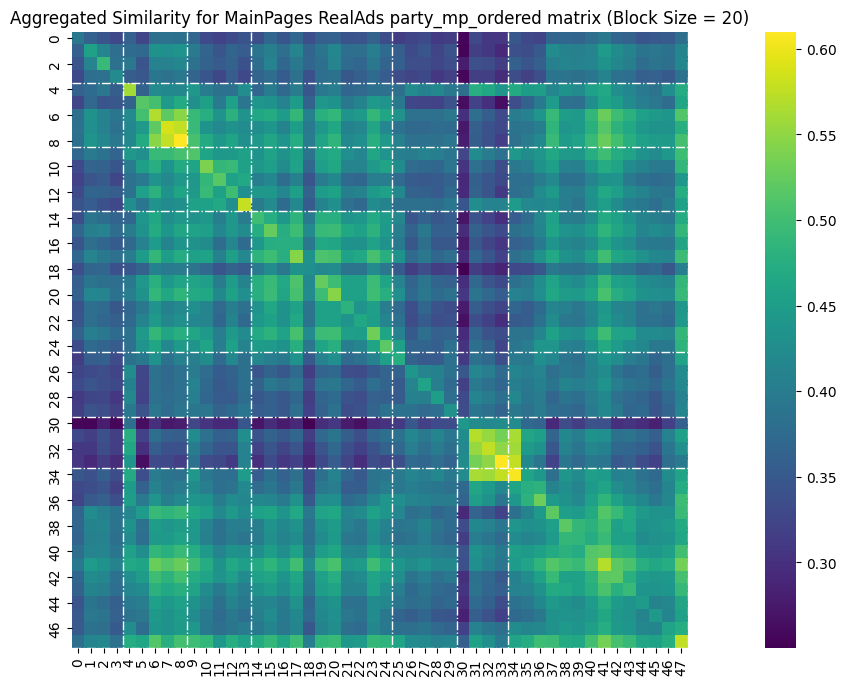

In [53]:
mp_ordered_embeddings = []

for party in main_parties:
    ordered_part = main_pages_data[main_pages_data['party'] == party]['bert_embeddings'].to_numpy()
    ordered_part = np.array([np.array(x) for x in ordered_part])
    mp_ordered_embeddings.append(ordered_part)

# Combine the mp_ordered parts into a single array
mp_ordered_embeddings_flattened = np.vstack(mp_ordered_embeddings)

# Similarity analysis between all mp_ordered texts
party_mp_ra_similarity_matrix = cosine_similarity(mp_ordered_embeddings_flattened)

print(main_pages_data['party'].value_counts(sort=False).sort_index())

plt.figure(figsize=(20, 8))

block_size = 20
aggregated_matrix = aggregate_matrix(party_mp_ra_similarity_matrix, block_size)

# Plotting the aggregated similarity matrix
sns.heatmap(aggregated_matrix, cmap='viridis', square=True)

# Add vertical lines at the specified xticks
cumulative_values = [99, 195, 280, 516, 603, 699, 963]

for value in cumulative_values:
    value = value // block_size
    plt.vlines(x=value, ymin=0, ymax=aggregated_matrix.shape[0], color='white', linestyle='-.', linewidth=1)
    plt.hlines(y=value, xmin=0, xmax=aggregated_matrix.shape[1], color='white', linestyle='-.', linewidth=1)

plt.title('Aggregated Similarity for MainPages RealAds party_mp_ordered matrix (Block Size = {})'.format(block_size))
plt.show()

In [54]:
# print(main_parties)

# # Generate the clustermap
# g = sns.clustermap(
#     aggregated_matrix,
#     cmap='viridis',
#     metric='euclidean',        # Distance metric for clustering
#     method='average',          # Clustering method
#     figsize=(10, 8),          # Adjust figure size as needed
#     cbar_pos=None,                # No colorbar
#     dendrogram_ratio=(.2, 0), # Adjust dendrogram size
#     # xticklabels=pages,        # Labels for columns
#     # yticklabels=pages,        # Labels for rows
#     fmt=".2f",                 # Format for annotations
#     col_cluster=False          # Disable clustering on columns
# )

# # Customize the plot labels
# plt.setp(g.ax_heatmap.get_xticklabels(), rotation=45, ha='right')
# plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0)

# for value in cumulative_values:
#     value = value // block_size
#     plt.vlines(x=value, ymin=0, ymax=aggregated_matrix.shape[0], color='white', linestyle='-.', linewidth=1)

# plt.title('Clustermap of Aggregated Similarity Matrix (Block Size = {})'.format(block_size))

# plt.show()


### Intra and inter similarities distribution

In [55]:
block_borders = [x for x in cumulative_values]
block_borders.insert(0, 0)  # Insert 0 at the beginning

ads_per_party = main_pages_data['party'].value_counts(sort=False).sort_index().tolist()

# Initialize dictionary to store similarities
real_ads_party_similarities = {}

for i in range(n_main_parties):
  real_ads_party_similarities[main_parties[i]] = {
      'intra': [],
      'inter': []
  }
  for j in range(n_main_parties):
    # Extract the block (i, j)
    start_row = block_borders[i]
    end_row = block_borders[i + 1]
    start_col = block_borders[j]
    end_col = block_borders[j + 1]

    block = party_mp_ra_similarity_matrix[start_row:end_row, start_col:end_col]
    # print(f"Block {i}, {j}: {block.shape}, {start_row}:{end_row}, {start_col}:{end_col}")

    if i == j:
      # Intra-similarity (within the same block)
      real_ads_party_similarities[main_parties[i]]['intra'].extend(block[np.triu_indices(ads_per_party[i], k=1)])  # Exclude diagonal
    else:
      # Inter-similarity (between different blocks)
      real_ads_party_similarities[main_parties[i]]['inter'].extend(block.flatten())

# Convert to NumPy arrays for further analysis within each block
for party in main_parties:
  real_ads_party_similarities[party]['intra'] = np.array(real_ads_party_similarities[party]['intra'])
  real_ads_party_similarities[party]['inter'] = np.array(real_ads_party_similarities[party]['inter'])
#   print(f"Party {party} - Intra: {len(real_ads_party_similarities[party]['intra'])}, Inter: {len(real_ads_party_similarities[party]['inter'])}")

print(f"real_ads_party_similarities: {real_ads_party_similarities.keys()}, {real_ads_party_similarities[main_parties[0]].keys()}")

real_ads_party_similarities: dict_keys(["['3POLO']", "['AVD']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]), dict_keys(['intra', 'inter'])


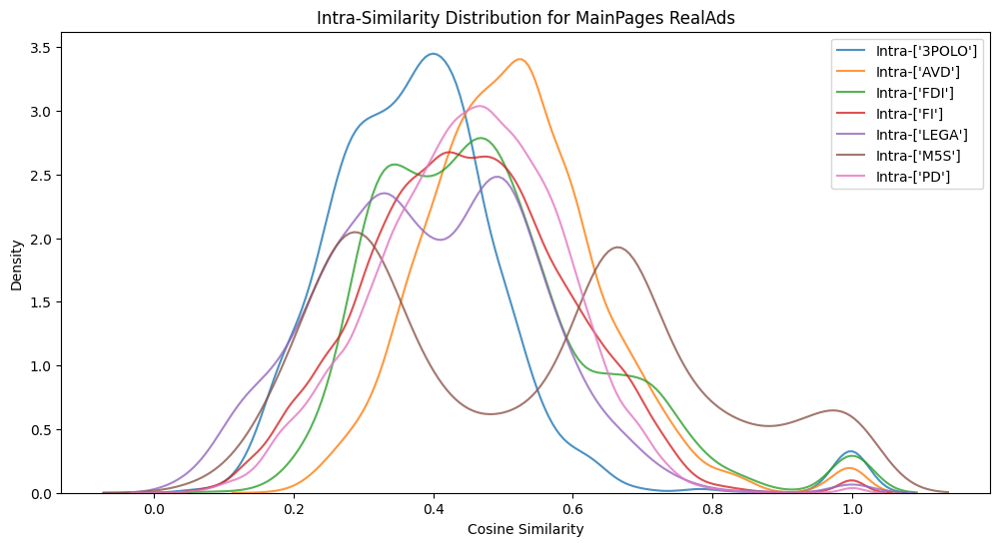

In [56]:
plt.figure(figsize=(12, 6))
for topic in real_ads_party_similarities:
  sns.kdeplot(real_ads_party_similarities[topic]['intra'], label=f'Intra-{topic}', alpha=0.8)

plt.title('Intra-Similarity Distribution for MainPages RealAds')
plt.xlabel('Cosine Similarity')
plt.ylabel('Density')
plt.legend()
plt.show()

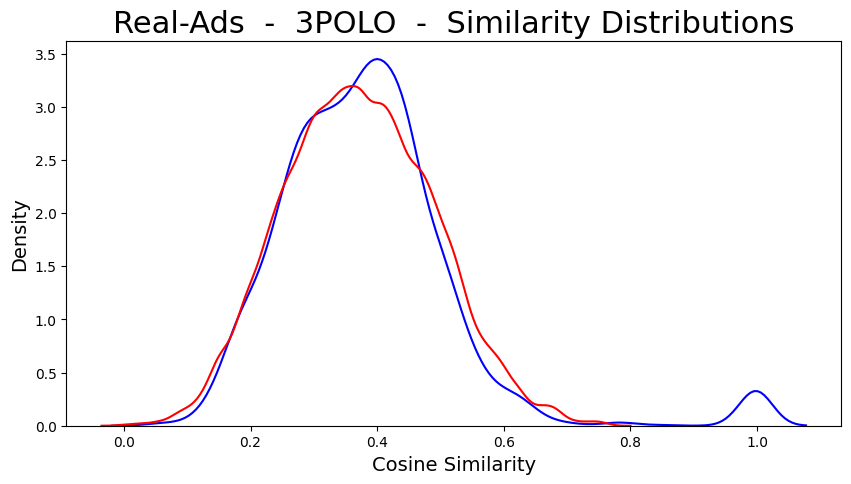

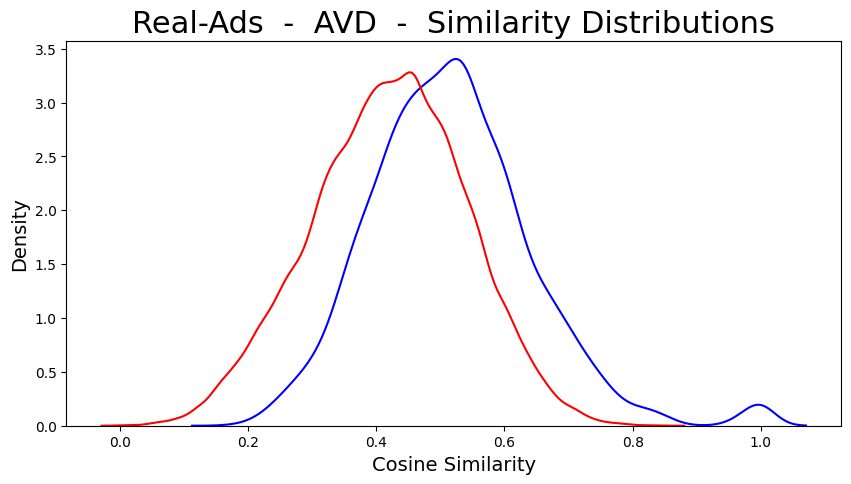

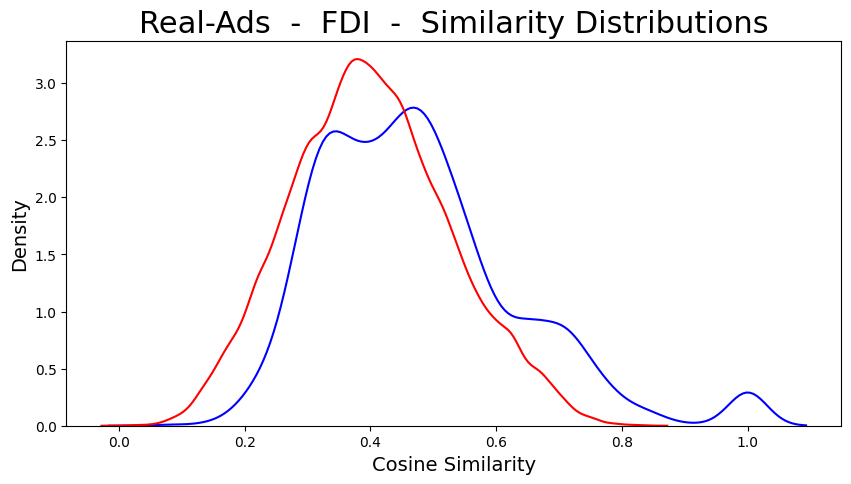

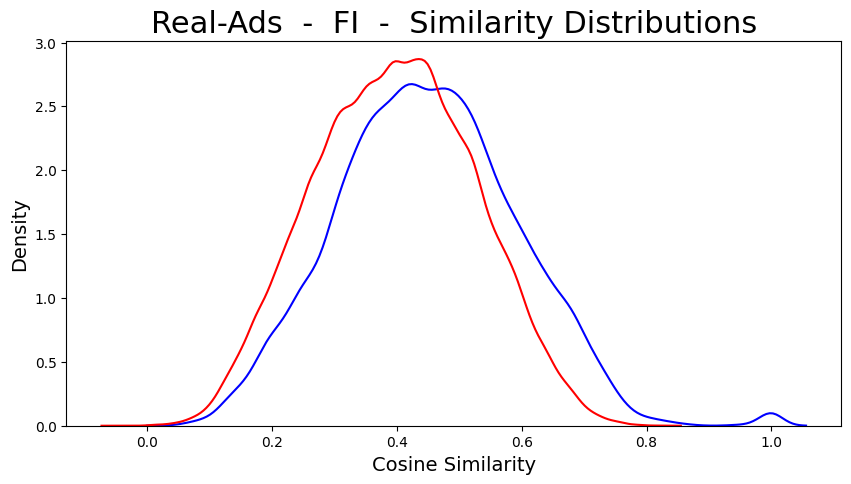

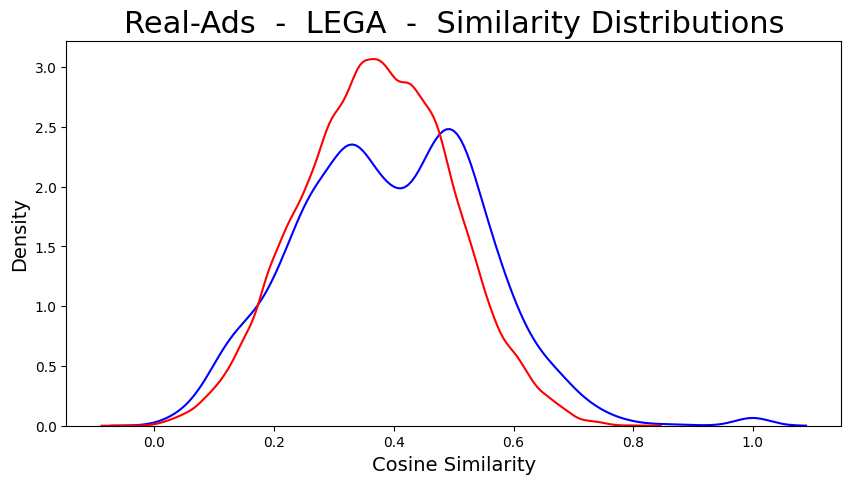

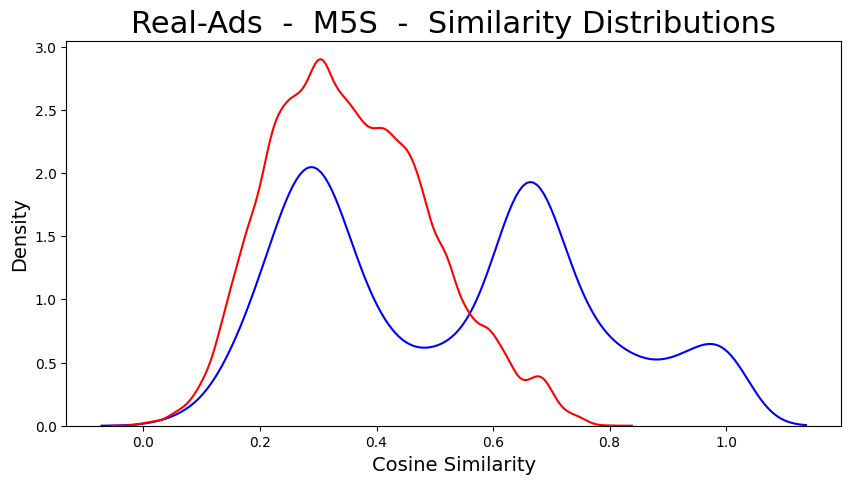

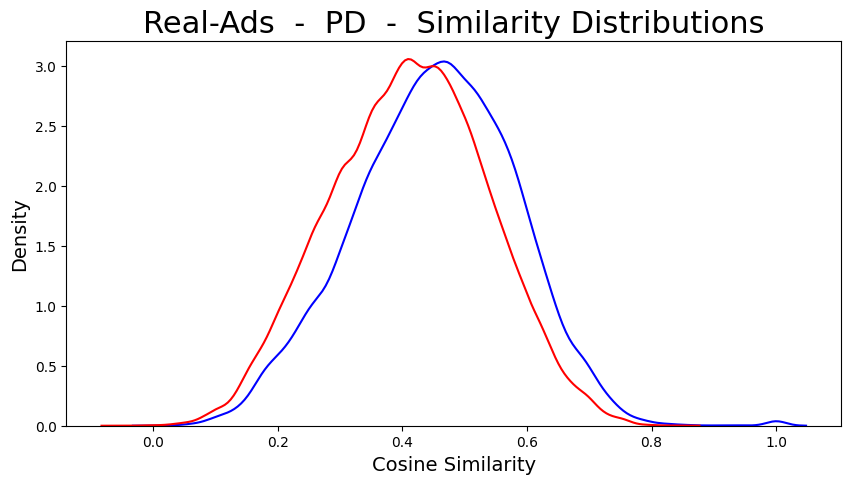

In [64]:
for i, party in enumerate(main_parties):
  plt.figure(figsize=(10, 5))
  sns.kdeplot(real_ads_party_similarities[party]['intra'], label='Intra-similarity', color='blue')
  sns.kdeplot(real_ads_party_similarities[party]['inter'], label='Inter-similarity', color='red')

  plt.title(f'Real-Ads  -  {main_parties_labels[i]}  -  Similarity Distributions', fontsize=22)
  plt.xlabel('Cosine Similarity', fontsize=14)
  plt.ylabel('Density', fontsize=14)
#   plt.legend(fontsize=14)
  plt.show()

## [Real-Ads] Clustering

In [86]:
ra_ordered_embeddings = np.vstack([np.vstack(main_pages_data[main_pages_data['party'] == party]['bert_embeddings'].to_numpy())
                                   for party in main_parties])

print(main_parties)
# Generate labels for each party
party_labels = np.concatenate([np.full(len(main_pages_data[main_pages_data['party'] == party]), i)
                               for i, party in enumerate(main_parties)])

# Step 1: Dimensionality Reduction
pca = PCA(n_components=2)  # Reduce to 2 components for visualization
reduced_embeddings = pca.fit_transform(ra_ordered_embeddings)

# Step 2: K-means Clustering
kmeans = KMeans(n_clusters=len(main_parties), random_state=42)
cluster_labels = kmeans.fit_predict(reduced_embeddings)


["['3POLO']", "['AVD']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]


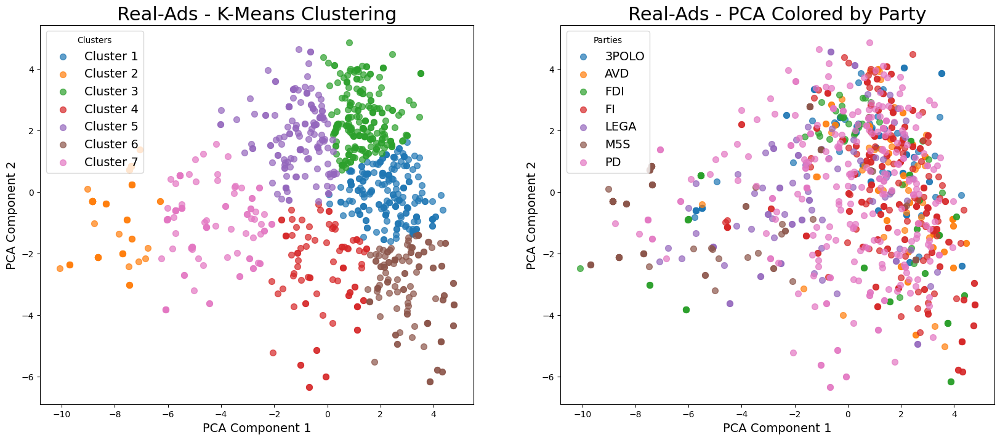

In [95]:
# Plotting both graphs side by side
fig, axs = plt.subplots(1, 2, figsize=(20, 8))

# Colors for plotting
colors = plt.get_cmap('tab10').colors

# Plot 1: K-Means Clusters

axs[0].set_title('Real-Ads - K-Means Clustering', fontsize=22)
axs[0].set_xlabel('PCA Component 1', fontsize=14)
axs[0].set_ylabel('PCA Component 2', fontsize=14)

for cluster_num in range(len(main_parties)):
    indices = cluster_labels == cluster_num
    axs[0].scatter(
        reduced_embeddings[indices, 0],
        reduced_embeddings[indices, 1],
        label=f'Cluster {cluster_num + 1}',
        color=colors[cluster_num % len(colors)],
        s=50,
        alpha=0.7
    )

axs[0].legend(title="Clusters", fontsize=14)

# Plot 2: Actual Party Labels

axs[1].set_title('Real-Ads - PCA Colored by Party', fontsize=22)
axs[1].set_xlabel('PCA Component 1', fontsize=14)
axs[1].set_ylabel('PCA Component 2', fontsize=14)

for i, party in enumerate(main_parties):
    indices = party_labels == i
    axs[1].scatter(
        reduced_embeddings[indices, 0],
        reduced_embeddings[indices, 1],
        label=main_parties_labels[i],
        color=colors[i % len(colors)],
        s=50,
        alpha=0.7
    )

axs[1].legend(title="Parties", fontsize=14)

plt.show()

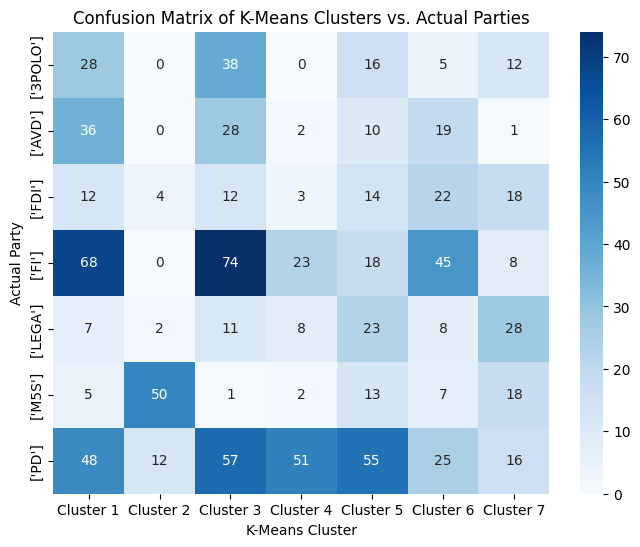

In [88]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Compute confusion matrix
cm = confusion_matrix(party_labels, cluster_labels)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=[f'Cluster {i+1}' for i in range(len(main_parties))],
            yticklabels=main_parties)
plt.xlabel('K-Means Cluster')
plt.ylabel('Actual Party')
plt.title('Confusion Matrix of K-Means Clusters vs. Actual Parties')
plt.show()


In [89]:
# Step 1: Run K-means with more clusters on the new embeddings
num_clusters = len(main_parties) * 2
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
predicted_labels_more_clusters = kmeans.fit_predict(ra_ordered_embeddings)

In [90]:
# Count occurrences of each party in each cluster
cluster_composition = {cluster_id: Counter(party_labels[predicted_labels_more_clusters == cluster_id])
                       for cluster_id in range(num_clusters)}

# Create absolute counts DataFrame and calculate percentages
cluster_df_absolute = pd.DataFrame.from_dict(cluster_composition, orient='index').fillna(0).astype(int)
cluster_df_absolute.columns = main_parties
cluster_df_percentage = (cluster_df_absolute.div(cluster_df_absolute.sum(axis=1), axis=0) * 100).round(1)

# Cast combined DataFrame to object type to store strings
combined_df = cluster_df_percentage.astype(object)

# Format each cell with percentage first, followed by absolute count, or "0%" if percentage is zero
for row in combined_df.index:
    for col in combined_df.columns:
        percentage = cluster_df_percentage.at[row, col]
        count = cluster_df_absolute.at[row, col]
        combined_df.at[row, col] = f"{percentage}% ({count})" if percentage != 0 else "0%"

# Calculate and add purity column to combined DataFrame
cluster_purity_percentage = cluster_df_percentage.max(axis=1)
cluster_purity_absolute = cluster_df_absolute.sum(axis=1)
combined_df['Purity (Total)'] = [f"{p}% ({a})" if p != 0 else "0%" for p, a in zip(cluster_purity_percentage.round(1), cluster_purity_absolute)]

combined_df = combined_df.sort_index()

# Display the combined DataFrame for clusters
display(combined_df)
print(f"\nAverage Cluster Purity: {cluster_purity_percentage.mean():.2f}%\n")

# Reversed Axis: Analyze distribution of ads per party across clusters
party_cluster_composition = {party_id: Counter(predicted_labels_more_clusters[party_labels == party_id])
                             for party_id in range(len(main_parties))}

# Create absolute counts DataFrame and calculate percentages for reversed axis
party_df_absolute = pd.DataFrame.from_dict(party_cluster_composition, orient='index').fillna(0).astype(int)
party_df_absolute.columns = [f'Cluster_{i}' for i in range(num_clusters)]
party_df_absolute.index = main_parties
party_df_percentage = (party_df_absolute.div(party_df_absolute.sum(axis=1), axis=0) * 100).round(1)

# Cast combined party DataFrame to object type to store strings
combined_party_df = party_df_percentage.astype(object)

# Format each cell with percentage first, followed by absolute count, or "0%" if percentage is zero
for row in combined_party_df.index:
    for col in combined_party_df.columns:
        percentage = party_df_percentage.at[row, col]
        count = party_df_absolute.at[row, col]
        combined_party_df.at[row, col] = f"{percentage}% ({count})" if percentage != 0 else "0%"

# Calculate and add purity column to combined party DataFrame
party_purity_percentage = party_df_percentage.max(axis=1)
party_purity_absolute = party_df_absolute.sum(axis=1)
combined_party_df['Purity (Total)'] = [f"{p}% ({a})" if p != 0 else "0%" for p, a in zip(party_purity_percentage.round(1), party_purity_absolute)]

# Display the combined DataFrame for parties
display(combined_party_df)
print(f"\nAverage Party Purity: {party_purity_percentage.mean():.2f}%")

,['3POLO'],['AVD'],['FDI'],['FI'],['LEGA'],['M5S'],['PD'],Purity (Total)
0,11.8% (2),70.6% (12),17.6% (3),0%,0%,0%,0%,70.6% (17)
1,10.0% (3),6.7% (2),3.3% (1),3.3% (1),73.3% (22),3.3% (1),0%,73.3% (30)
2,12.6% (23),7.7% (14),53.0% (97),23.0% (42),0.5% (1),2.2% (4),1.1% (2),53.0% (183)
3,0%,0%,9.3% (5),0%,7.4% (4),0%,83.3% (45),83.3% (54)
4,5.0% (6),33.1% (40),24.8% (30),23.1% (28),12.4% (15),1.7% (2),0%,33.1% (121)
5,0%,12.5% (2),0%,0%,87.5% (14),0%,0%,87.5% (16)
6,19.4% (6),61.3% (19),12.9% (4),0%,0%,6.5% (2),0%,61.3% (31)
7,3.6% (5),63.0% (87),14.5% (20),4.3% (6),8.0% (11),5.8% (8),0.7% (1),63.0% (138)
8,43.5% (37),1.2% (1),23.5% (20),0%,0%,18.8% (16),12.9% (11),43.5% (85)
9,12.0% (13),9.3% (10),33.3% (36),0.9% (1),3.7% (4),40.7% (44),0%,40.7% (108)



Average Cluster Purity: 65.39%



,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,Cluster_10,Cluster_11,Cluster_12,Cluster_13,Purity (Total)
['3POLO'],37.4% (37),3.0% (3),23.2% (23),13.1% (13),2.0% (2),1.0% (1),6.1% (6),5.1% (5),3.0% (3),6.1% (6),0%,0%,0%,0%,37.4% (99)
['AVD'],0.4% (1),0.8% (2),5.9% (14),4.2% (10),5.1% (12),2.1% (5),16.9% (40),36.9% (87),18.6% (44),8.1% (19),0%,0%,0.8% (2),0%,36.9% (236)
['FDI'],18.4% (16),1.1% (1),4.6% (4),50.6% (44),0%,0%,2.3% (2),9.2% (8),9.2% (8),2.3% (2),2.3% (2),0%,0%,0%,50.6% (87)
['FI'],11.5% (11),0%,2.1% (2),0%,0%,0%,0%,1.0% (1),7.3% (7),0%,25.0% (24),46.9% (45),0%,6.2% (6),46.9% (96)
['LEGA'],7.6% (20),0.4% (1),36.7% (97),13.6% (36),1.1% (3),0%,11.4% (30),7.6% (20),18.2% (48),1.5% (4),0%,1.9% (5),0%,0%,36.7% (264)
['M5S'],0%,1.0% (1),43.8% (42),1.0% (1),0%,0%,29.2% (28),6.2% (6),17.7% (17),0%,1.0% (1),0%,0%,0%,43.8% (96)
['PD'],0%,25.9% (22),1.2% (1),4.7% (4),0%,0%,17.6% (15),12.9% (11),16.5% (14),0%,0%,4.7% (4),16.5% (14),0%,25.9% (85)



Average Party Purity: 39.74%


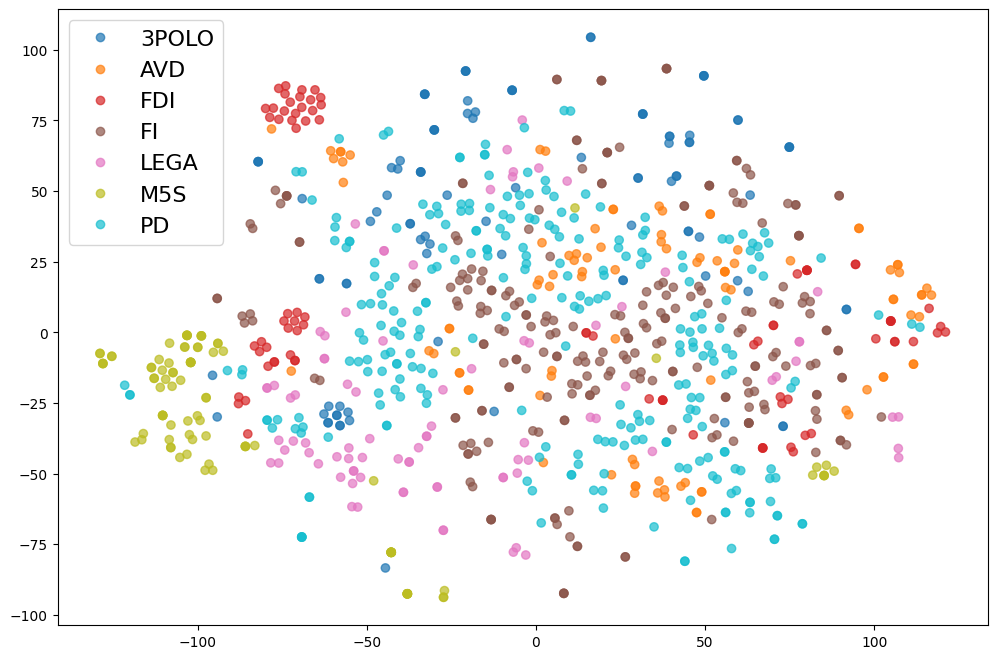

In [98]:
ra_ordered_embeddings = normalize(ra_ordered_embeddings, norm='l2')

# Apply t-SNE
tsne_embeddings = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(ra_ordered_embeddings)

# Plot t-SNE results
plt.figure(figsize=(12, 8))
scatter = plt.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], c=party_labels, cmap='tab10', alpha=0.7)
plt.legend(handles=scatter.legend_elements()[0], labels=main_parties_labels, fontsize=16)
# plt.title('t-SNE Visualization of Real-Ads Embeddings')
plt.show()


# Llama Integration

## {S} Llama Functions

In [21]:
client = InferenceClient(model="meta-llama/Meta-Llama-3.1-70B-Instruct", token=userdata.get('HF_TOKEN_FP'))
# client = InferenceClient(model="meta-llama/Meta-Llama-3-70B-Instruct", token=userdata.get('HF_TOKEN_FP'))
# client = InferenceClient(model="meta-llama/Meta-Llama-3-8B-Instruct", token=userdata.get('HF_TOKEN'))

In [22]:
from datetime import datetime, timedelta
from collections import deque

# Set up rate limiting variables
hourly_limit = 999

call_times = deque()

# Function to check and wait for rate limit
def check_rate_limit():
    now = datetime.now()
    one_hour_ago = now - timedelta(hours=1)

    # Remove calls older than 1 hour
    while call_times and call_times[0] <= one_hour_ago:
        call_times.popleft()

    if len(call_times) % 100 == 0:
        print(f"\nNumber of calls in previus hour: {len(call_times)}")

    # If at or over the limit, wait
    if len(call_times) >= hourly_limit:
        wait_time = (call_times[0] - one_hour_ago).total_seconds()
        print(f"\nRate limit reached. Waiting for {wait_time:.2f} seconds.")
        time.sleep(wait_time + 0.1)  # Add a small buffer
        # Recheck after waiting
        check_rate_limit()

In [23]:
def generate_political_prompt(examples, party, topic=None):
    if topic is None:
        return f"""
<|begin_of_text|><|start_header_id|>system<|end_header_id|>
Sei un esperto di comunicazione politica per campagne elettorali italiane. Genera un messaggio persuasivo per Facebook.

Istruzioni:
- Massimo 250 caratteri.
- Linguaggio coinvolgente e persuasivo.
- Se appropriato, usa un tono polarizzante.
- Non ripetere gli esempi, usali per capire il linguaggio e genera messaggi diversi.
Non aggiungere altri commenti o consigli.

ESEMPI:
{examples}<|eot_id|>

<|start_header_id|>user<|end_header_id|>
Genera un messaggio<|eot_id|>

<|start_header_id|>assistant<|end_header_id|>
"""
    else:
        return f"""
<|begin_of_text|><|start_header_id|>system<|end_header_id|>
Sei un esperto di comunicazione politica per campagne elettorali italiane. Genera un messaggio persuasivo per Facebook.

Istruzioni:
- Massimo 250 caratteri.
- Linguaggio coinvolgente e persuasivo.
- Se appropriato, usa un tono polarizzante.
- Non ripetere gli esempi, usali per capire il linguaggio e genera messaggi diversi.
Non aggiungere altri commenti o consigli.

ESEMPI:
{examples}<|eot_id|>

<|start_header_id|>user<|end_header_id|>
Genera un messaggio sul tema '{topic}'<|eot_id|>

<|start_header_id|>assistant<|end_header_id|>
"""

In [ ]:
# Replace 'data.json' with the path to your JSON file
with open('data/IT22_ElectoralPrograms.json', 'r', encoding='utf-8') as file:
    json_dict = json.load(file)

# Initialize the result dictionary
electoral_programs = {}

# Process each party's data
for party, info in json_dict.items():
    summary = info['summary']
    bullet_points_list = info['bullet_points']
    bullet_points_str = '\n'.join(bullet_points_list)
    electoral_programs[party] = {
        'summary': summary,
        'bullet_points': bullet_points_str
    }

# The 'result' dictionary now contains the desired structure
print(electoral_programs)

{"['3POLO']": {'summary': "Il programma elettorale 2022 del Terzo Polo, composto da Azione e Italia Viva, si basa su tre obiettivi principali: crescita economica inclusiva e sostenibile, semplificazione della vita dei cittadini e ampliamento delle opportunità. Il piano include riforme nel lavoro, fisco, giustizia, sanità, scuola, università e ricerca, diritti civili, ambiente, trasporti e innovazione. Viene enfatizzata l'implementazione del Piano Nazionale di Ripresa e Resilienza (PNRR) e la promozione dell'integrazione europea. Viene proposta una gestione dell'immigrazione regolare, politiche per i giovani, e l'istituzione del Sindaco d'Italia, per l'elezione diretta del Presidente del Consiglio. Innovazione tecnologica, welfare e sostenibilità sono centrali.", 'bullet_points': "Attuazione del PNRR come strumento per modernizzare il paese e avanzare l'integrazione europea.\nRiforma fiscale con zero tasse per i giovani imprenditori e incentivi per la crescita dimensionale delle imprese

In [25]:
def generate_political_prompt_zero_shot(party, bullet_points, topic=None):
    if topic is None:
        return f"""
<|begin_of_text|><|start_header_id|>system<|end_header_id|>
Sei un esperto di comunicazione politica per campagne elettorali italiane. Devi generare un messaggio persuasivo per Facebook.

Istruzioni:
- Massimo 250 caratteri
- Linguaggio coinvolgente e persuasivo
- Se appropriato, usa un tono polarizzante
- Riassumi le informazioni chiave per evidenziare i punti di forza del programma
Non aggiungere altri commenti o consigli.

Genera un messaggio per il partito {party}.
Questo è il riassunto del programma elettorale: "{electoral_programs[party]['summary']}"
Questi sono i punti principali del programma:
{bullet_points}<|eot_id|>

<|start_header_id|>user<|end_header_id|>
Genera un messaggio<|eot_id|>

<|start_header_id|>assistant<|end_header_id|>
"""
    else:
        return f"""
<|begin_of_text|><|start_header_id|>system<|end_header_id|>
Sei un esperto di comunicazione politica per campagne elettorali italiane. Devi generare un messaggio persuasivo per Facebook.

Istruzioni:
- Massimo 250 caratteri
- Linguaggio coinvolgente e persuasivo
- Se appropriato, usa un tono polarizzante
- Riassumi le informazioni chiave per evidenziare i punti di forza del programma
Non aggiungere altri commenti o consigli.

Genera un messaggio per il partito {party}.
Questo è il riassunto del programma elettorale: "{electoral_programs[party]['summary']}"
Questi sono i punti principali del programma:
{bullet_points}<|eot_id|>

<|start_header_id|>user<|end_header_id|>
Genera un messaggio sul tema '{topic}'<|eot_id|>

<|start_header_id|>assistant<|end_header_id|>
"""

In [26]:
print(len(call_times))

0


## GenText Ads

### {S} Import

In [ ]:
if import_embeddings:
    # Import the CSV file
    gen_text_df = pd.read_csv('data/generated_ads.csv')
    # Convert the 'top_ads' column to lists of strings
    gen_text_df['top_ads'] = gen_text_df['top_ads'].apply(eval)

    n_pages = len(gen_text_df)

In [28]:
# Display x random couple of ads

if import_embeddings:
    for i in range(2):
        i = random.randint(0, len(gen_text_df))
        print(f"\n{gen_text_df['page_name'][i]} | Party: {gen_text_df['party'][i]}\n")
        display(f"{gen_text_df['top_ads'][i][0]}")
        if len(gen_text_df['top_ads'][i]) > 1:
            display(f"{gen_text_df['top_ads'][i][1]}")
        print()
        # display(f"{gen_text_df['gen_plain'][i]}")
        display(f"{gen_text_df['gen_economy'][i]}")
        display(f"{gen_text_df['gen_health'][i]}")
        print("\n---")


Festa dell'Unità Ravenna | Party: ['PD']



'𝗗𝗮𝗹 𝟮𝟲 𝗮𝗴𝗼𝘀𝘁𝗼 𝗮𝗹 𝟭𝟮 𝘀𝗲𝘁𝘁𝗲𝗺𝗯𝗿𝗲 𝟮𝟬𝟮𝟮 𝘁𝗼𝗿𝗻𝗮 𝗮𝗹 𝗣𝗮𝗹𝗮 𝗗𝗲 𝗔𝗻𝗱𝗿𝗲̀ 𝗱𝗶 𝗥𝗮𝘃𝗲𝗻𝗻𝗮 𝗹𝗮 𝗽𝗶𝘂̀ 𝗴𝗿𝗮𝗻𝗱𝗲 𝗳𝗲𝘀𝘁𝗮 𝗱𝗲𝗹𝗹𝗮 𝗥𝗼𝗺𝗮𝗴𝗻𝗮 Staremo insieme per diciotto serate e vi accoglieremo con grandi concerti, incontri e ottima cucina! Tutto il programma qui ⬇⬇⬇ www.festaravenna.it'

"‼️𝗗𝗼𝗺𝗲𝗻𝗶𝗰𝗮 𝟭𝟭 𝘀𝗲𝘁𝘁𝗲𝗺𝗯𝗿𝗲 𝗮𝗹𝗹𝗲 𝗼𝗿𝗲 𝟮𝟭 sarà ospite della Festa dell'Unità di ravenna il presidente della Regione Emilia-Romagna 𝗦𝗧𝗘𝗙𝗔𝗡𝗢 𝗕𝗢𝗡𝗔𝗖𝗖𝗜𝗡𝗜. Gli stan gastronomici aprono alle ore 19, vi aspettiamo!"

'"𝗦𝗢𝗦𝗧𝗘𝗡𝗜𝗔𝗡𝗢 𝗟\'𝗘𝗖𝗢𝗡𝗢𝗠𝗜𝗔! 🚀️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️'

'"𝗦𝗔𝗡𝗜𝗧𝗔̀ 𝗣𝗘𝗥 𝗧𝗨𝗧𝗧𝗜! 🏥️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️️'


---

Rossella Gianfagna | Party: ['CSX']



'AI MIEI CONCITTADINI DEL MOLISE  Mi rivolgo a Te, mio concittadino, mia concittadina per aprire il mio cuore e esprimerti lealmente il mio pensiero.  Ho riflettuto prima di tuffarmi in questa impresa. Mi conoscete, sapete della mia caparbietà e del mio modo di lavorare severo ma aperto, sociale ma non assistenziale.   In me è scattata una molla: trasformare la rabbia e la delusione per la crisi della politica in voglia di fare, in partecipazione rigorosa e progettuale.  Sono una molisana verace e non mi va proprio di lasciare il nostro territorio così bello e ricco di potenzialità alla deriva. Usato solo per giochi di potere esterni e per calare dall’alto decisioni e le stesse candidature.   Adesso è ora di dire basta. Ma quel basta deve essere condiviso: dobbiamo essere coesi e agire insieme!  Quel basta deve diventare una spinta potente di impegno, ognuno per quello che può deve dare una mano, prima con il voto lucido e consapevole e successivamente con la partecipazione democratica

'A Ururi, a Larino, a San Martino in Pensilis: oggi anche qui. Sempre a confronto diretto con le nostre comunità: in villa comunale, nelle piazze. Sempre accolti da cittadine e cittadini che, numerosi, hanno scelto di venire ad ascoltarci. E noi abbiamo ascoltato loro tra difficoltà quotidiane e ferite mai sanate, come le due ore che ancora si impiegano da Ururi per raggiungere Campobasso in treno, come l’ospedale Vietri mai trasformato in centro covid per incapacità e interessi, come una sanità indebolita, svuotata in tutto Basso Molise. Li abbiamo ascoltati, i nostri cittadini, anche e soprattutto per le infinite opportunità che un territorio così bello, così importante ha in tanti settori, dell’agricoltura al turismo. Insieme vogliamo riprenderci la speranza e la possibilità di cambiare le cose, riportare diritti e servizi in Molise e dare futuro ai nostri figli, alla nostra regione, alla nostra Italia. Tutto questo ci carica e ci unisce in questa piazza: grazie Ururi, grazie Larino

'"Basta con le promesse vuote! Il Molise merita un\'economia forte e sostenibile. Noi crediamo in un futuro dove le nostre imprese possono crescere, creare posti di lavoro e valorizzare il nostro territorio. Dobbiamo investire in innovazione, formazione e infrastrutture per attrarre investimenti e turisti. Il nostro obiettivo è creare un\'economia che funzioni per tutti, non solo per pochi privilegiati. Scegliamo un futuro di crescita e sviluppo per il Molise! #Economia #Molise #Sviluppo"'

'"La sanità non è un optional, è un diritto! Nel Molise, troppo spesso, ci siamo trovati a dover lottare per avere accesso a cure dignitose e servizi efficienti. È ora di cambiare! Con me, la sanità sarà una priorità assoluta: più risorse, più personale, più strutture adeguate. Non lasciamo più i nostri malati e le nostre famiglie sole! #SanitàPerTutti #MoliseMeritaDiPiù"'


---




---



### [1] Creation

In [ ]:
if not import_embeddings:

    unique_page_names = sorted(data['page_name'].unique())  # 953

    # Define topics and columns
    topics = ['Economia', 'Sanità', 'Ambiente', 'Sicurezza']
    topic_columns = ['gen_economy', 'gen_health', 'gen_environment', 'gen_safety']

    # Initialize an empty list to store row data
    rows_data = []

    i_batch = 3
    batch = 100
    # total_iterations = batch * (1 + len(topics))  # 1 for plain text + number of topics

    # Calculate total iterations for progress bar
    total_iterations = len(unique_page_names[:200]) * (1 + len(topics))  # 1 for plain text + number of topics

    # Initialize progress bar
    with tqdm(total=total_iterations, desc="Processing pages") as pbar:
        for page_name in unique_page_names[:200]:

            # Check and wait for rate limit
            check_rate_limit()

            page_data = data[data['page_name'] == page_name]

            # Get top 5 unique ad creative bodies
            top_ads = (page_data.sort_values('spend', ascending=False)
                    .drop_duplicates('ad_creative_bodies')
                    .head(5)['ad_creative_bodies'].tolist())

            # Get party
            party = page_data['party'].iloc[0]

            # Create a row dictionary with initial data
            row_dict = {
                'page_name': page_name,
                'party': party,
                'top_ads': top_ads
            }

            examples = '\n'.join([f'{i+1}. "{ad}"' for i, ad in enumerate(top_ads)])

            # Generate plain text and topic-specific text
            for column in ['gen_plain'] + topic_columns:

                # Generate text based on column
                if column == 'gen_plain':
                    prompt = generate_political_prompt(examples, party)
                else:
                    topic = topics[topic_columns.index(column)]
                    prompt = generate_political_prompt(examples, party, topic)

                # print("PROMPT:\n" +prompt)
                response = client.text_generation(prompt, max_new_tokens=256)
                print("Generated ads:\n" + response + "\n ---")
                row_dict[column] = response

                # Record the call time
                call_times.append(datetime.now())

                pbar.update(1)

            # Add the completed row data to the list
            rows_data.append(row_dict)

    # Create DataFrame from the list of dictionaries
    gen_text_df = pd.DataFrame(rows_data)

    print("\nSaving results to CSV...")
    # Save the results
    gen_text_df.to_csv(f'data/generated_ads_party.csv', index=False)
    print("Process completed successfully!")

## MainPagesGenText Ads

### {S} Import

In [ ]:
if import_embeddings:
    # Import the CSV file
    mp_gen_text_df = pd.read_csv('data/mp_generated_ads.csv')
    # Convert the 'top_ads' column to lists of strings
    mp_gen_text_df['top_ads'] = mp_gen_text_df['top_ads'].apply(eval)

    # mp_n_pages = len(mp_gen_text_df)

In [30]:
# Display x random couple of ads

if import_embeddings:
    for i in range(2):
        i = random.randint(0, len(mp_gen_text_df)-1)
        print(f"\n{mp_gen_text_df['page_name'][i]} | Party: {mp_gen_text_df['party'][i]}\n")
        display(f"{mp_gen_text_df['top_ads'][i][0]}")
        if len(mp_gen_text_df['top_ads'][i]) > 1:
            display(f"{mp_gen_text_df['top_ads'][i][1]}")
        print()
        # display(f"{mp_gen_text_df['gen_plain'][i]}")
        display(f"{mp_gen_text_df['gen_economy'][i]}")
        display(f"{mp_gen_text_df['gen_health'][i]}")
        print("\n---")


Sinistra Italiana | Party: ['AVD']



'Nicola Fratoianni è stato tra i più fermi oppositori dell’aumento delle spese militari che il Parlamento italiano ha votato nel corso dell’ultimo anno.   Ogni euro speso in armi è un euro sottratto alla scuola e alla sanità, due settori su cui questo Paese ha urgente bisogno di investire per formare i cittadini di domani e tutelare la salute di tutti.  D’altronde, la pandemia da Covid-19 ha messo in evidenza come i nostri ospedali siano in sofferenza a causa della mancanza di personale e di posti letto.   La scuola non è da meno: i giovani studenti, insieme ai loro insegnanti, hanno pagato un prezzo altissimo negli ultimi anni. E così anche gli studenti universitari.  Queste battaglie devono continuare a trovare una voce all’interno del Parlamento italiano.   La voce è quella di Nicola, candidato alla Camera dei Deputati per l’Alleanza Verdi Sinistra nei Collegi plurinominali di Molise-01, Toscana-01, Toscana-02 e Toscana-03. Noi siamo con lui!   Per votarlo, bisogna barrare solo il s

"«Ero una giovane medio borghese con figli piccoli e tante certezze. Sono state stravolte...»  Il cammino di Ilaria Cucchi per ottenere verità e giustizia per suo fratello è stato anche il cammino di tante e tanti.   Un cammino che non si è fermato, prosegue tutt'oggi e proseguirà in Parlamento.   Oggi, grazie alla forza e alla determinazione di Ilaria e della sua famiglia, Stefano Cucchi è diventato non solo un simbolo di giustizia negata, ma anche di speranza e riscatto di fronte all'ingiustizia per tante e tanti.   E noi, come Ilaria, crediamo dovrà diventare la voce di chiunque vede negati i propri diritti."

'"🟢🔴 L\'economia deve servire le persone, non solo i profitti delle grandi aziende! 💸\n\nPer #AlleanzaVerdiSinistra, è tempo di cambiare rotta e costruire un\'economia più giusta e sostenibile. \n\n✅ Salario minimo garantito a 10€ l\'ora per tutti i lavoratori\n✅ Investimenti in green economy e transizione ecologica\n✅ Tassazione degli extraprofitti delle grandi aziende per finanziare i servizi pubblici\n\nUn\'economia che metta al centro le persone e il pianeta, non solo i profitti. #Facciamolo! 🌟\n\nScopri il nostro programma economico: [link] 👉"'

'"La salute è un diritto, non un privilegio! 🟢🔴 Per #AlleanzaVerdiSinistra, la sanità pubblica deve essere gratuita e di qualità per tutti, senza liste d\'attesa infinite e senza costi proibitivi. Vogliamo più personale sanitario, più posti letto e più risorse per le nostre strutture ospedaliere. La pandemia ci ha insegnato che la salute è il nostro bene più prezioso. Non possiamo permettere che sia messa in vendita. #Facciamolo! 📌 Scopri il nostro programma per una sanità pubblica di qualità 👇🏽 https://verdisinistra.it/programma-alleanza-verdi-e-sinistra/"'


---

Lega - Salvini Premier | Party: ['LEGA']



'Immigrazione incontrollata oppure regole chiare? E tu, da che parte stai?   Assistere allo sbarco di migliaia di immigrati clandestini senza far nulla oppure far rispettare le leggi?  Tu da che parte stai?'

'"Tasse sempre più alte o crescita economica per tutti? Vuoi continuare a pagare il conto della crisi o vuoi essere parte della ripresa? Scegli il futuro della tua famiglia e del tuo lavoro! #CrescitaNonTasse"'

'"Sanità pubblica in crisi o investimenti per la nostra salute? Vuoi continuare a vedere liste d\'attesa infinite e carenze di personale oppure vuoi un sistema sanitario all\'altezza dei nostri bisogni? Scegli di investire nella tua salute, scegli il cambiamento!"'


---




---



### [2] Creation using page_name

In [ ]:
if not import_embeddings:

    unique_page_names = sorted(main_pages_data['page_name'].unique())
    print(f"{len(call_times)} Calls")

    # Define topics and columns
    topics = ['Economia', 'Sanità', 'Ambiente', 'Sicurezza']
    topic_columns = ['gen_economy', 'gen_health', 'gen_environment', 'gen_safety']

    # Initialize an empty list to store row data
    rows_data = []

    batch = len(unique_page_names)
    total_iterations = batch * (1 + len(topics))  # 1 for plain text + number of topics

    # Initialize progress bar
    with tqdm(total=total_iterations, desc="Processing pages") as pbar:
        for page_name in unique_page_names:

            # Check and wait for rate limit
            check_rate_limit()

            page_data = main_pages_data[main_pages_data['page_name'] == page_name]

            # Get top 10 unique ad creative bodies
            top_ads = (page_data.sort_values('spend', ascending=False)
                    .drop_duplicates('ad_creative_bodies')
                    .head(10)['ad_creative_bodies'].tolist())

            # Get party
            party = page_data['party'].iloc[0]

            # Create a row dictionary with initial data
            row_dict = {
                'page_name': page_name,
                'party': party,
                'top_ads': top_ads
            }

            examples = '\n'.join([f'{i+1}. "{ad}"' for i, ad in enumerate(top_ads)])

            # Generate plain text and topic-specific text
            for column in ['gen_plain'] + topic_columns:

                # Generate text based on column
                if column == 'gen_plain':
                    prompt = generate_political_prompt(examples, party)
                else:
                    topic = topics[topic_columns.index(column)]
                    prompt = generate_political_prompt(examples, party, topic)

                # print("PROMPT:\n" +prompt)

                while True:  # Keep trying until successful
                    try:
                        response = client.text_generation(prompt, max_new_tokens=256)
                        break  # Exit the loop if successful
                    except Exception:
                        print(f"Rate limit reached.\n{len(call_times)} Calls.\nWaiting for 60 seconds...")
                        time.sleep(60)

                # print("Generated ads:\n" + response + "\n ---")
                row_dict[column] = response

                # Record the call time
                call_times.append(datetime.now())

                pbar.update(1)

            # Add the completed row data to the list
            rows_data.append(row_dict)

    # Create DataFrame from the list of dictionaries
    mp_gen_text_df = pd.DataFrame(rows_data)

    print("\nSaving results to CSV...")
    # Save the results
    mp_gen_text_df.to_csv(f'data/mp_generated_ads.csv', index=False)
    print("Process completed successfully!")
    mp_gen_text_df

### [3] Creation using party - Multiple plain_text

In [ ]:
if not import_embeddings:

    print(parties)

    # Initialize an empty list to store row data
    rows_data = []

    n_plain_texts = 50
    total_iterations = n_main_parties * (n_plain_texts)  # x for plain text + number of topics

    # Initialize progress bar
    with tqdm(total=total_iterations, desc="Processing pages") as pbar:
        for party in main_parties:
            # print(f"\n{party}")

            # Check and wait for rate limit
            check_rate_limit()

            party_data = main_pages_data[main_pages_data['party'] == party]

            # Create a row dictionary with initial data
            row_dict = {
                'party': party,
                'top_ads': top_ads
            }

            responses = []

            # Generate plain text and topic-specific text
            for i in range(n_plain_texts):

                # Get random x unique ad creative bodies
                top_ads = (party_data
                        .drop_duplicates('ad_creative_bodies')
                        .sample(9)['ad_creative_bodies']
                        .tolist()
                        )
                examples = '\n'.join([f'{i+1}. "{ad}"' for i, ad in enumerate(top_ads)])
                # print("Examples:" + examples)

                prompt = generate_political_prompt(examples, party)

                # print("PROMPT:\n" +prompt)

                while True:
                    try:
                        response = client.text_generation(prompt, max_new_tokens=256)
                        break  # Exit the loop if successful
                    except Exception:
                        print(f"Rate limit reached.\n{len(call_times)} Calls.\nWaiting for 60 seconds...")
                        time.sleep(60)

                # print("Generated ads:\n" + response + "\n ---")
                responses.append(response)

                # Record the call time
                call_times.append(datetime.now())

                pbar.update(1)

            # Add the completed row data to the list
            row_dict['gen_plain_list'] = responses
            rows_data.append(row_dict)

    # Create DataFrame from the list of dictionaries
    mp_gen_text_df = pd.DataFrame(rows_data)

    print("\nSaving results to CSV...")
    # Save the results
    mp_gen_text_df.to_csv(f'data/mp_generated_ads_party.csv', index=False)
    print("Process completed successfully!")
    mp_gen_text_df

In [ ]:
for i in range(2):
    i = random.randint(0, n_main_parties-1)
    # print(f"\n{mp_gen_text_df['page_name'][i]} | Party: {mp_gen_text_df['party'][i]}\n")
    print(f"\nParty: {mp_gen_text_df['party'][i]}\n")
    # display(f"{mp_gen_text_df['top_ads'][i][0]}")
    # if len(mp_gen_text_df['top_ads'][i]) > 1:
    #     display(f"{mp_gen_text_df['top_ads'][i][1]}")
    # print()
    # print(f"{mp_gen_text_df['gen_plain_list']}")
    # print(mp_gen_text_df['gen_plain_list'].to_string())
    print('\n'.join(mp_gen_text_df['gen_plain_list'][i]))
    print("\n---")

# [1] GeneratedText Embeddings

### {S} Import gen_text_embeddings

In [ ]:
if import_embeddings:

    # Load the CSV file containing the embeddings
    embeddings_df = pd.read_csv('data/gen_text_embeddings.csv')

    # Convert the 'embeddings' column back to lists of floats
    embeddings_df['embeddings'] = embeddings_df['embeddings'].apply(
        lambda x: np.array(list(map(float, x.split(','))))
    )

    # Access the embeddings
    gen_text_embeddings = embeddings_df['embeddings'].tolist()

### GeneratedText Embeddings Creation

In [ ]:
sentences = []

sentences.extend(gen_text_df['gen_plain'])
sentences.extend(gen_text_df['gen_economy'])
sentences.extend(gen_text_df['gen_health'])
sentences.extend(gen_text_df['gen_environment'])
sentences.extend(gen_text_df['gen_safety'])

if not import_embeddings:

    model = SentenceTransformer('nickprock/sentence-bert-base-italian-xxl-uncased')

    # print(len(sentences), sentences)

    gen_text_embeddings = []

    # Encode the sentences using the BERT model
    print("Processing embeddings for all texts...")

    for sentence in tqdm(sentences, desc="Embedding texts"):
        if isinstance(sentence, float) and np.isnan(sentence):
            embedding = model.encode("NaN")
        else:
            embedding = model.encode(sentence)
        gen_text_embeddings.append(embedding)


    # Assuming 'embeddings' is a list of numpy arrays
    embeddings_df = pd.DataFrame({'embeddings': [','.join(map(str, embedding)) for embedding in gen_text_embeddings]})

    # Save the DataFrame to a CSV file
    embeddings_df.to_csv('data/gen_text_embeddings.csv', index=False)

## gen_text_embeddings Similarity

In [47]:
threshold = 0.95
n_values = 5

gen_text_similarity_matrix = cosine_similarity(gen_text_embeddings)

print(f"Similarity Mean {np.shape(gen_text_similarity_matrix)}: {np.mean(gen_text_similarity_matrix):.5f}")

clean_sm = gen_text_similarity_matrix.copy()
clean_sm = np.triu(clean_sm, 1)

removed_values = len(clean_sm[clean_sm > threshold])
print(f"Removed values > {threshold}: {removed_values}\n")

clean_sm[clean_sm > threshold] = 0

# Get the indices of the top x values
indices = np.argpartition(clean_sm.flatten(), -n_values)[-n_values:]

# Convert the flat indices to 2D indices
x, y = np.unravel_index(indices, clean_sm.shape)

columns_to_print = ['page_name', 'party']
# Print the top x values with their x and y coordinates
for i in range(len(indices)):
    print(f"Similarity Value: {clean_sm[x[i], y[i]]:.5f}, x: {x[i]}, y: {y[i]}")
    row_x = x[i] % n_pages
    row_y = y[i] % n_pages
    column_x = x[i] // n_pages
    column_y = y[i] // n_pages
    # print(len(sentences[x[i]]), len(sentences[y[i]]))
    # if(len(sentences[x[i]]) < 200 or len(sentences[y[i]]) < 200):
    #     continue
    # print(f"{column_x} - {gen_text_df.iloc[row_x]['party']} - {gen_text_df.iloc[row_x]['page_name']} \n{sentences[x[i]]}")
    # print(f"{column_y} - {gen_text_df.iloc[row_y]['party']} - {gen_text_df.iloc[row_y]['page_name']} \n{sentences[y[i]]}")
    print()

Similarity Mean (4765, 4765): 0.51165
Removed values > 0.95: 2197

Similarity Value: 0.94921, x: 3483, y: 3671

Similarity Value: 0.94983, x: 772, y: 3631

Similarity Value: 0.94968, x: 1956, y: 2233

Similarity Value: 0.94971, x: 2687, y: 2738

Similarity Value: 0.94935, x: 3243, y: 3475



### topics

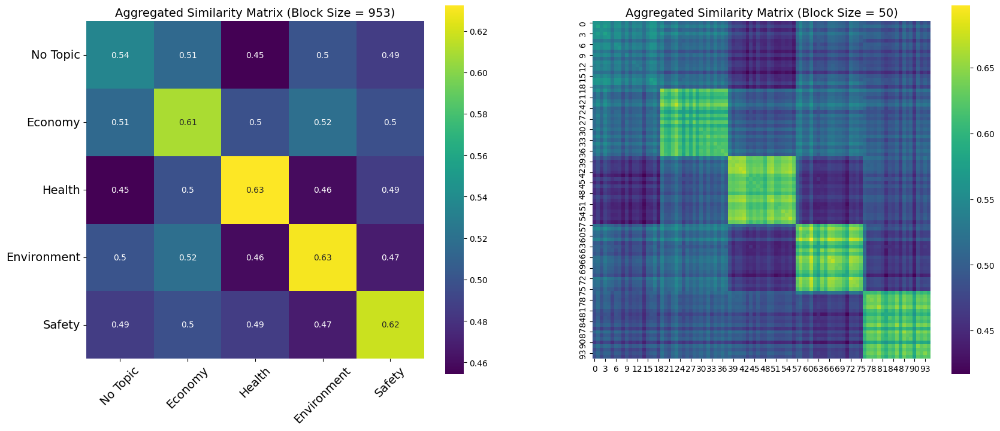

In [48]:
block_size = 953 # n_pages
aggregated_matrix = aggregate_matrix(gen_text_similarity_matrix, block_size)

topic_columns = ['No Topic', 'Economy', 'Health', 'Environment', 'Safety']

# Plotting the aggregated similarity matrix
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

sns.heatmap(aggregated_matrix, cmap='viridis', square=True, ax=axes[0], annot=True)
axes[0].set_title('Aggregated Similarity Matrix (Block Size = {})'.format(block_size), fontsize=14)
axes[0].set_xticklabels(topic_columns, rotation=45, fontsize=14)
axes[0].set_yticklabels(topic_columns, rotation=0, fontsize=14)

block_size = 50
aggregated_matrix = aggregate_matrix(gen_text_similarity_matrix, block_size)

# Plotting the aggregated similarity matrix
sns.heatmap(aggregated_matrix, cmap='viridis', square=True, ax=axes[1])
axes[1].set_title('Aggregated Similarity Matrix (Block Size = {})'.format(block_size), fontsize=14)

plt.show()


Intra and inter similarities distribution

In [ ]:
topics = ['gen_plain','gen_economy','gen_health','gen_environment','gen_safety']

n_topics = len(topics)
block_size = n_pages

# Initialize dictionary to store similarities
topic_similarities = {}

for i in range(n_topics):
  topic_similarities[topics[i]] = {
      'intra': [],
      'inter': []
  }
  for j in range(n_topics):
    # Extract the block (i, j)
    start_row = i * n_pages
    end_row = (i + 1) * n_pages
    start_col = j * n_pages
    end_col = (j + 1) * n_pages

    block = gen_text_similarity_matrix[start_row:end_row, start_col:end_col]

    if i == j:
      # Intra-similarity (within the same block)
      topic_similarities[topics[i]]['intra'].extend(block[np.triu_indices(n_pages, k=1)])  # Exclude diagonal
    else:
      # Inter-similarity (between different blocks)
      topic_similarities[topics[i]]['inter'].extend(block.flatten())

# Convert to NumPy arrays for further analysis within each block
for topic in topics:
  topic_similarities[topic]['intra'] = np.array(topic_similarities[topic]['intra'])
  topic_similarities[topic]['inter'] = np.array(topic_similarities[topic]['inter'])
#   print(f"Topic {topic} - Intra: {len(topic_similarities[topic]['intra'])}, Inter: {len(topic_similarities[topic]['inter'])}")

print(f"topic_similarities: {topic_similarities.keys()}, {topic_similarities[topics[0]].keys()}")


topic_similarities: dict_keys(['gen_plain', 'gen_economy', 'gen_health', 'gen_environment', 'gen_safety']), dict_keys(['intra', 'inter'])


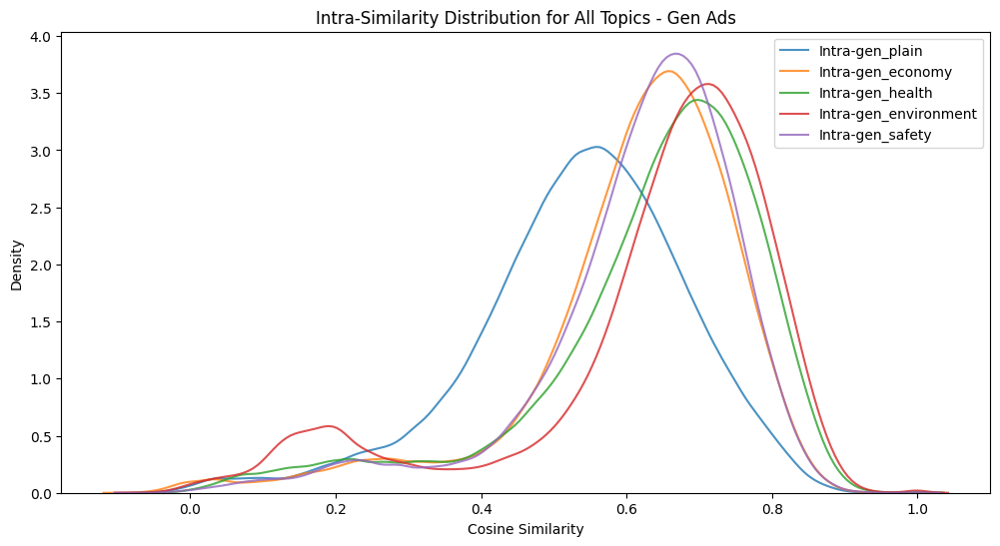

In [ ]:
plt.figure(figsize=(12, 6))
for topic in topic_similarities:
  sns.kdeplot(topic_similarities[topic]['intra'], label=f'Intra-{topic}', alpha=0.8)

plt.title('Intra-Similarity Distribution for All Topics - Gen Ads')
plt.xlabel('Cosine Similarity')
plt.ylabel('Density')
plt.legend()
plt.show()

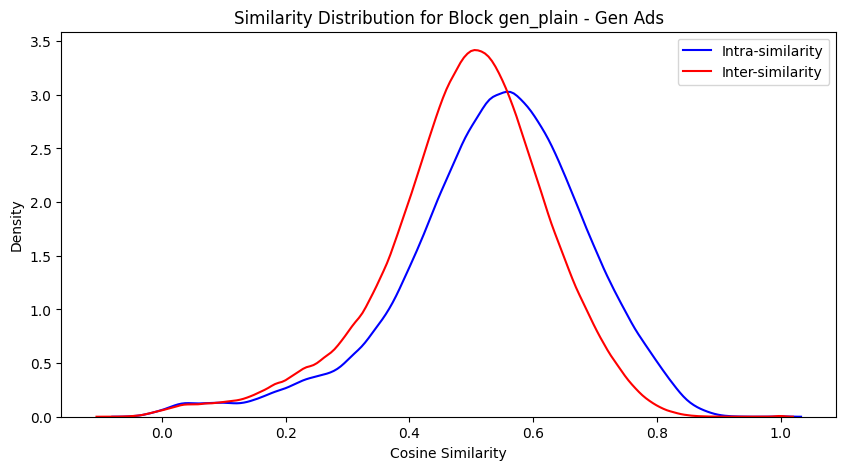

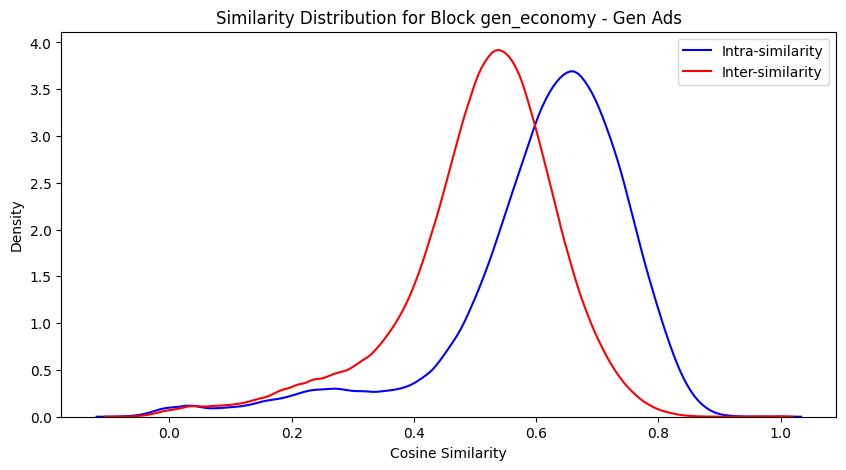

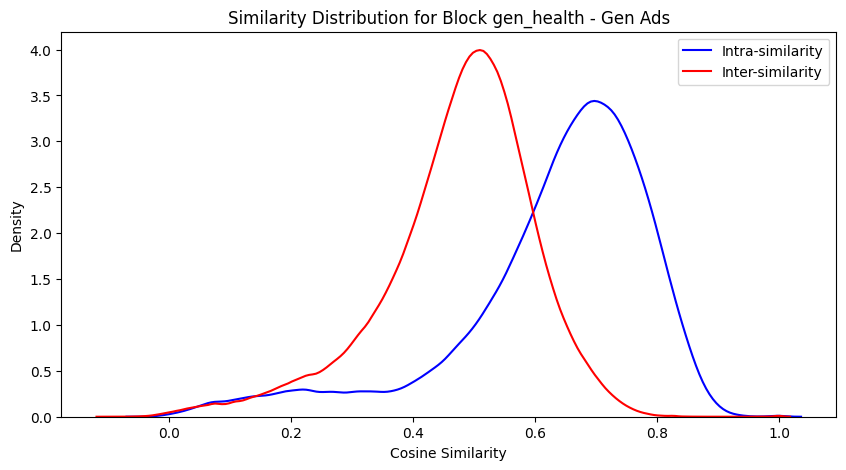

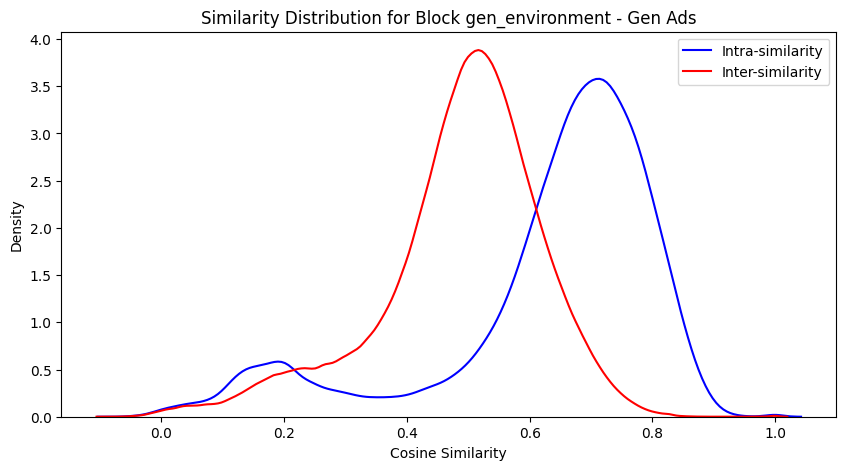

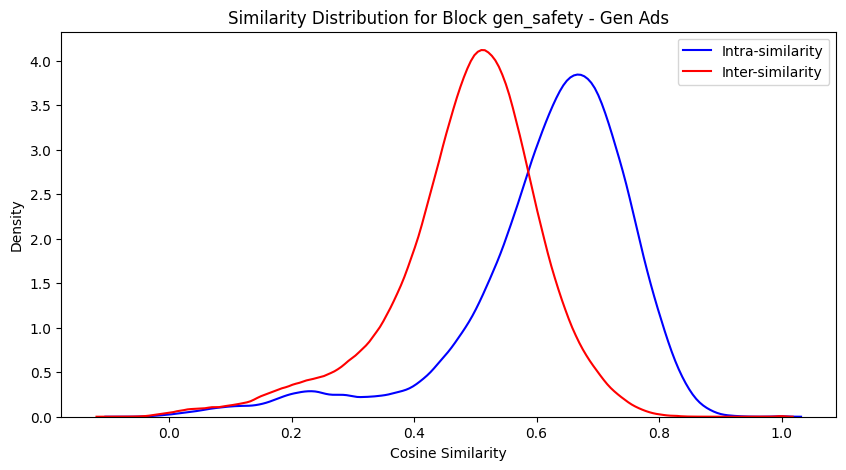

In [ ]:
for topic in topic_similarities:
  plt.figure(figsize=(10, 5))
  sns.kdeplot(topic_similarities[topic]['intra'], label='Intra-similarity', color='blue')
  sns.kdeplot(topic_similarities[topic]['inter'], label='Inter-similarity', color='red')

  plt.title(f'Similarity Distribution for Block {topic} - Gen Ads')
  plt.xlabel('Cosine Similarity')
  plt.ylabel('Density')
  plt.legend()
  plt.show()

### page_name

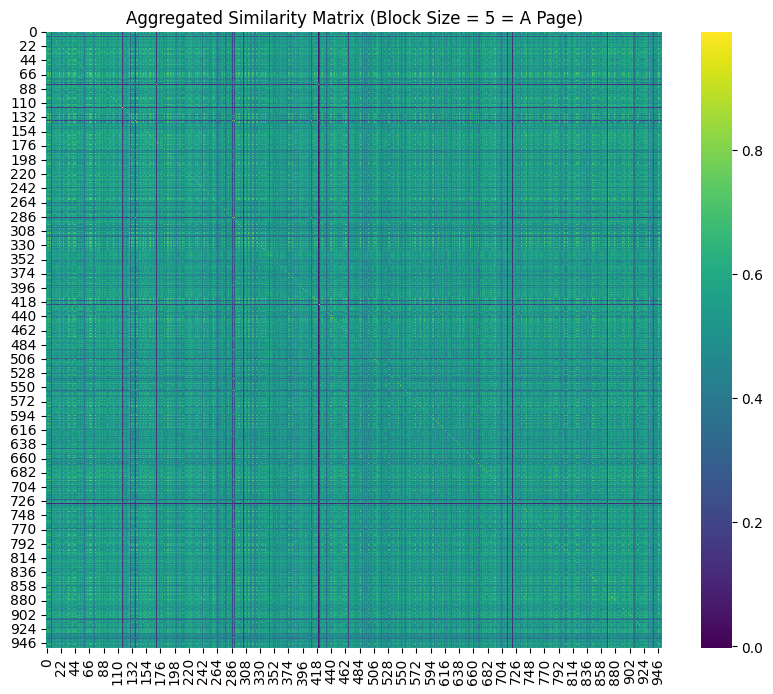

In [ ]:
# Order the embeddings for page_name

pn_gen_text_embeddings = []
for i in range(n_pages):
  pn_gen_text_embeddings.append(gen_text_embeddings[i])
  pn_gen_text_embeddings.append(gen_text_embeddings[(i + n_pages)])
  pn_gen_text_embeddings.append(gen_text_embeddings[(i + n_pages * 2)])
  pn_gen_text_embeddings.append(gen_text_embeddings[(i + n_pages * 3)])
  pn_gen_text_embeddings.append(gen_text_embeddings[(i + n_pages * 4)])

pn_gen_text_similarity_matrix = cosine_similarity(pn_gen_text_embeddings)

block_size = 5
aggregated_matrix = aggregate_matrix(pn_gen_text_similarity_matrix, block_size)

# Plotting the aggregated similarity matrix
plt.figure(figsize=(10, 8))
sns.heatmap(aggregated_matrix, cmap='viridis', square=True)
plt.title('Aggregated Similarity Matrix (Block Size = {} = A Page)'.format(block_size))
plt.show()

### party

party
['3POLO']    169
['AVD']       72
['CDX']      109
['CSX']      118
['FDI']       86
['FI']        57
['LEGA']      95
['M5S']       87
['PD']       160
Name: count, dtype: int64


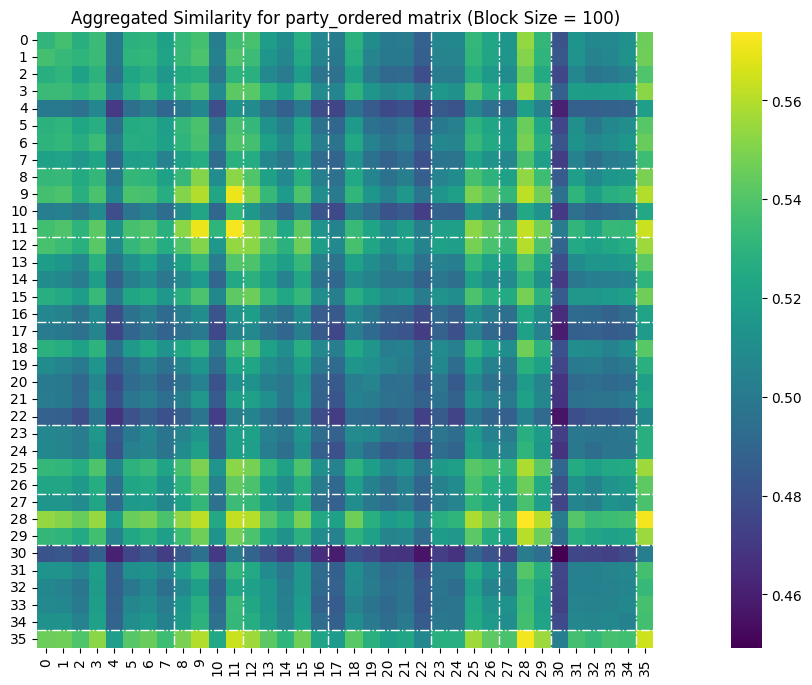

In [ ]:
# Order the embeddings for party

party_gen_text_embeddings = []

for party in parties:
    party_indices = gen_text_df[gen_text_df['party'] == party].index
    for index in party_indices:
        party_gen_text_embeddings.append(gen_text_embeddings[index])
        party_gen_text_embeddings.append(gen_text_embeddings[index + len(gen_text_df)])
        party_gen_text_embeddings.append(gen_text_embeddings[index + len(gen_text_df) * 2])
        party_gen_text_embeddings.append(gen_text_embeddings[index + len(gen_text_df) * 3])
        party_gen_text_embeddings.append(gen_text_embeddings[index + len(gen_text_df) * 4])

party_gen_text_similarity_matrix = cosine_similarity(party_gen_text_embeddings)

print(gen_text_df['party'].value_counts(sort=False).sort_index())

plt.figure(figsize=(20, 8))

block_size = 100 #125
np.fill_diagonal(party_gen_text_similarity_matrix, 0)
aggregated_matrix = aggregate_matrix(party_gen_text_similarity_matrix, block_size)

# Plotting the aggregated similarity matrix
sns.heatmap(aggregated_matrix, cmap='viridis', square=True)

# Add vertical lines at the specified xticks
cumulative_values = [169, 241, 350, 468, 554, 611, 706, 793, 953]

for value in cumulative_values:
    value = value*5 // block_size
    plt.vlines(x=value, ymin=0, ymax=aggregated_matrix.shape[0], color='white', linestyle='-.', linewidth=1)
    plt.hlines(y=value, xmin=0, xmax=aggregated_matrix.shape[1], color='white', linestyle='-.', linewidth=1)

plt.title('Aggregated Similarity for party_ordered matrix (Block Size = {})'.format(block_size))
plt.show()


Intra and inter similarities distribution

In [ ]:
block_borders = [x * 5 for x in cumulative_values]
block_borders.insert(0, 0)  # Insert 0 at the beginning

ads_per_party = gen_text_df['party'].value_counts(sort=False).sort_index().tolist()
ads_per_party = [x * 5 for x in ads_per_party]

# Initialize dictionary to store similarities
party_similarities = {}

for i in range(n_parties):
  party_similarities[parties[i]] = {
      'intra': [],
      'inter': []
  }
  for j in range(n_parties):
    # Extract the block (i, j)
    start_row = block_borders[i]
    end_row = block_borders[i + 1]
    start_col = block_borders[j]
    end_col = block_borders[j + 1]

    block = party_gen_text_similarity_matrix[start_row:end_row, start_col:end_col]
    # print(f"Block {i}, {j}: {block.shape}, {start_row}:{end_row}, {start_col}:{end_col}")

    if i == j:
      # Intra-similarity (within the same block)
      party_similarities[parties[i]]['intra'].extend(block[np.triu_indices(ads_per_party[i], k=1)])
    #   party_similarities[parties[i]]['intra'].extend(block.flatten())
    else:
      # Inter-similarity (between different blocks)
      party_similarities[parties[i]]['inter'].extend(block.flatten())

# Convert to NumPy arrays for further analysis within each block
for party in parties:
  party_similarities[party]['intra'] = np.array(party_similarities[party]['intra'])
  party_similarities[party]['inter'] = np.array(party_similarities[party]['inter'])
#   print(f"Party {party} - Intra: {len(party_similarities[party]['intra'])}, Inter: {len(party_similarities[party]['inter'])}")

print(f"party_similarities: {party_similarities.keys()}, {party_similarities[parties[0]].keys()}")

party_similarities: dict_keys(["['3POLO']", "['AVD']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]), dict_keys(['intra', 'inter'])


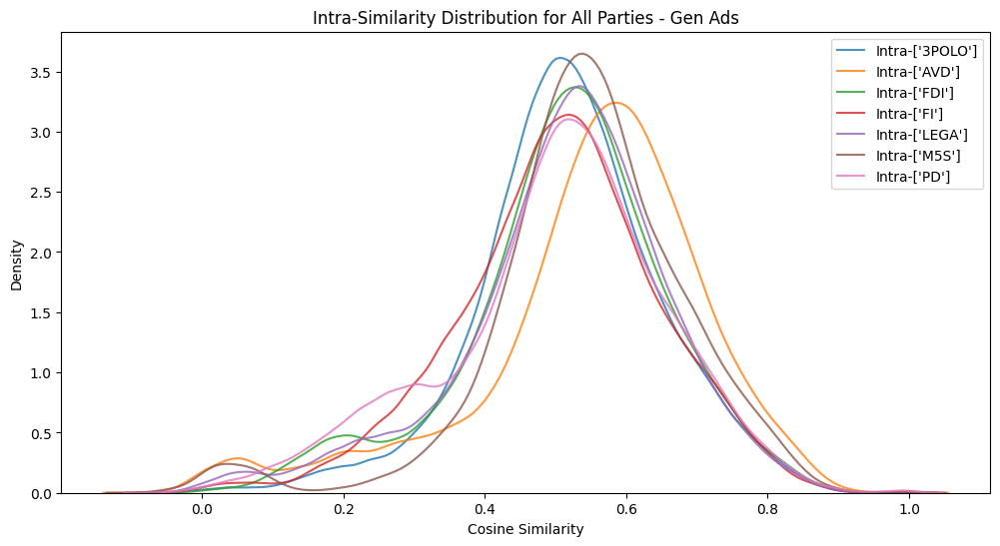

In [ ]:
plt.figure(figsize=(12, 6))
for topic in party_similarities:
  sns.kdeplot(party_similarities[topic]['intra'], label=f'Intra-{topic}', alpha=0.8)

plt.title('Intra-Similarity Distribution for All Parties - Gen Ads')
plt.xlabel('Cosine Similarity')
plt.ylabel('Density')
plt.legend()
plt.show()

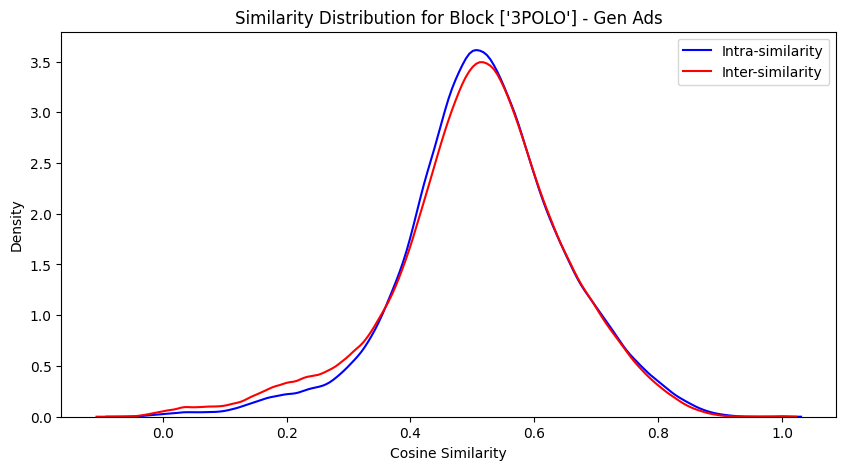

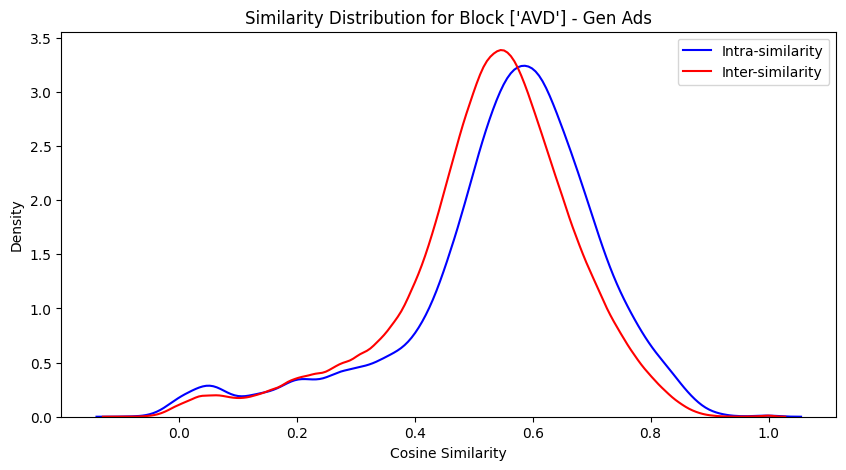

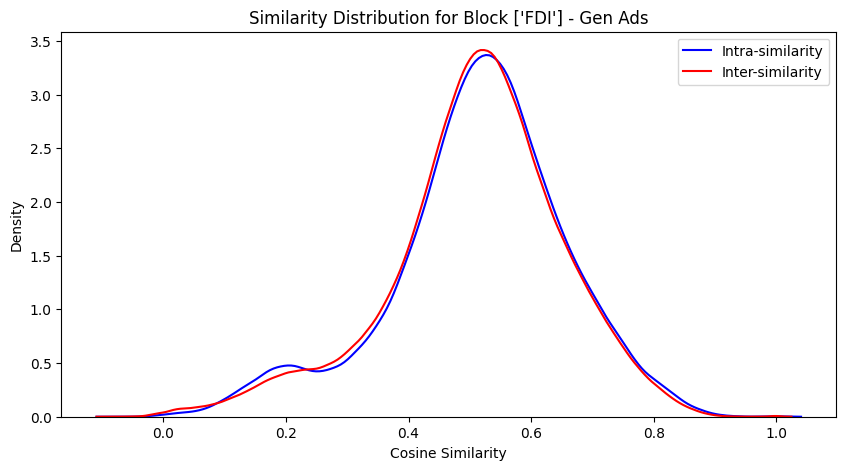

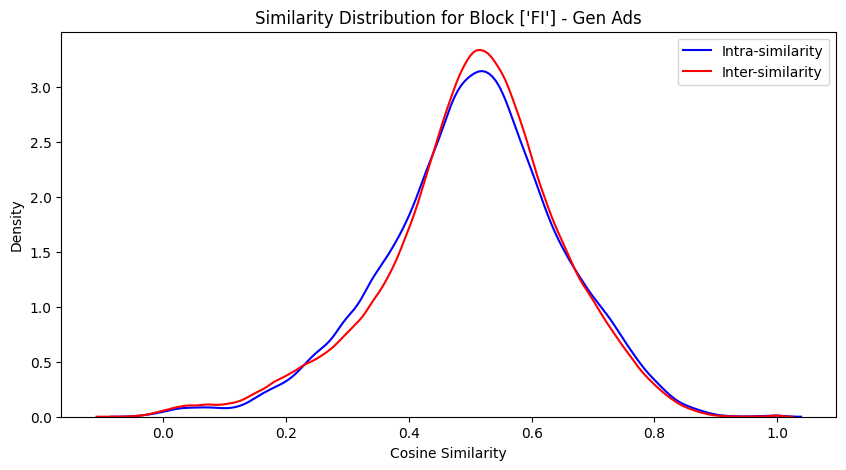

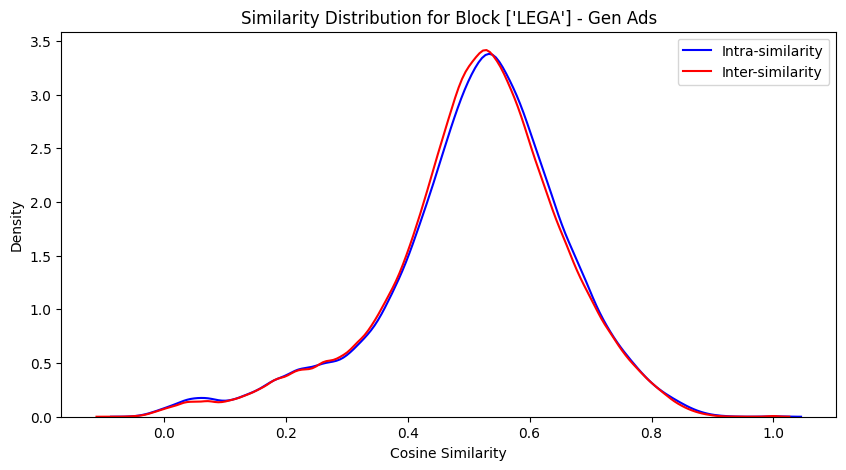

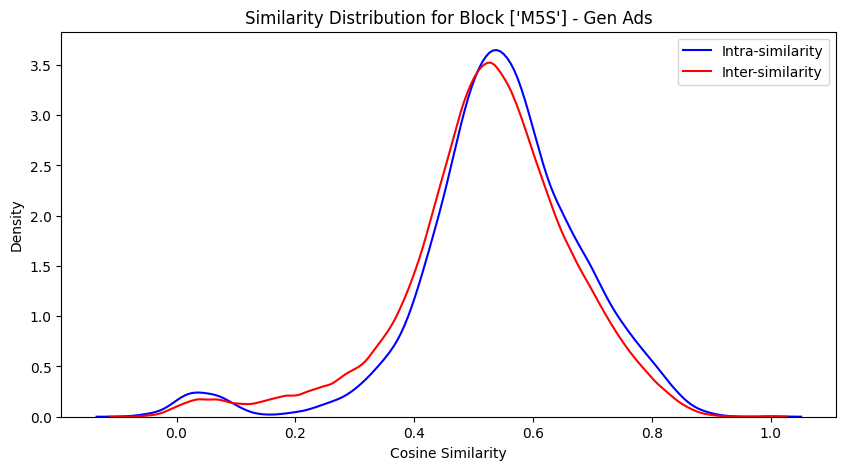

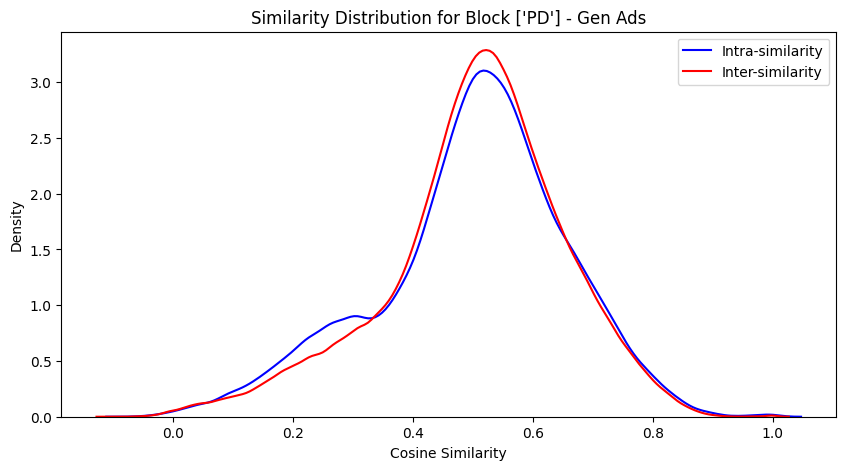

In [ ]:
for party in party_similarities:
  plt.figure(figsize=(10, 5))
  sns.kdeplot(party_similarities[party]['intra'], label='Intra-similarity', color='blue')
  sns.kdeplot(party_similarities[party]['inter'], label='Inter-similarity', color='red')

  plt.title(f'Similarity Distribution for Block {party} - Gen Ads')
  plt.xlabel('Cosine Similarity')
  plt.ylabel('Density')
  plt.legend()
  plt.show()

["['3POLO']", "['AVD']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]


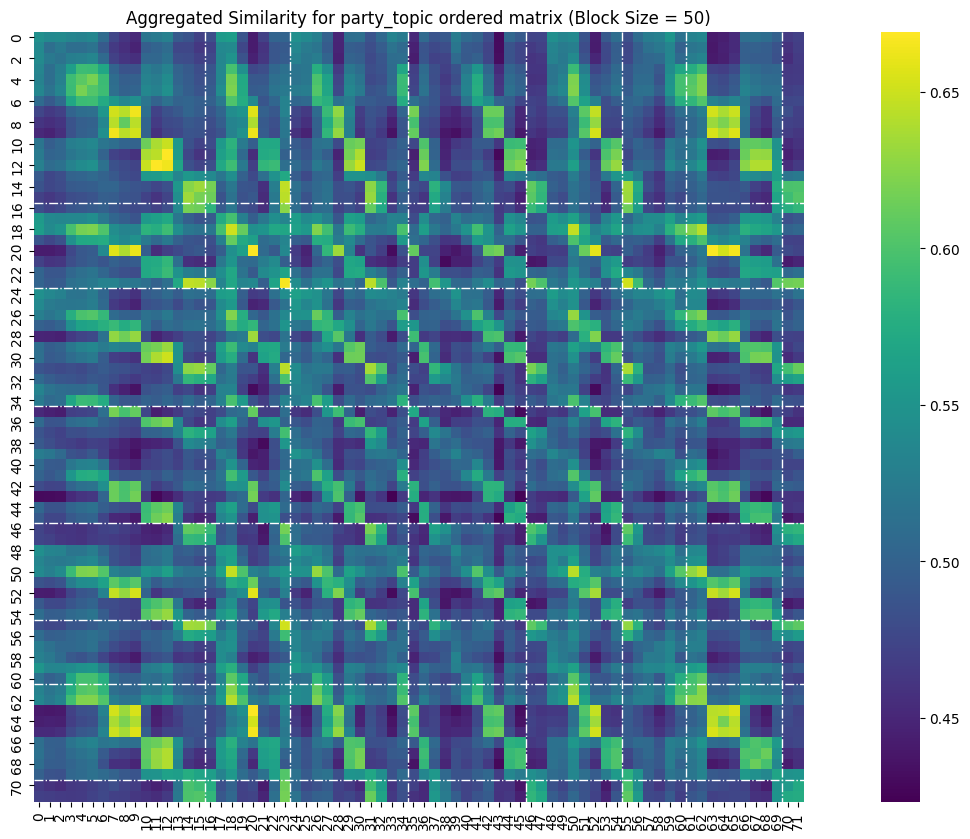

In [ ]:
# Order the embeddings first for party and second for topic

party_topic_gen_text_embeddings = []

for party in parties:
  party_df = gen_text_df[gen_text_df['party'] == party]
  #Change topic_columns to be a list instead of a string
  topic_columns = ['gen_plain', 'gen_economy', 'gen_health', 'gen_environment', 'gen_safety']
  for topic_column in topic_columns:
      topic_indices = party_df.index
      for index in topic_indices:
          try:
              embedding_index = index + len(gen_text_df) * topic_columns.index(topic_column)
              party_topic_gen_text_embeddings.append(gen_text_embeddings[embedding_index])
          except Exception as e:
              print(f"Error processing {topic_column} at index {index}: {e}")
              pass


pt_gen_text_similarity_matrix = cosine_similarity(party_topic_gen_text_embeddings)

print(parties)

plt.figure(figsize=(20, 10))

block_size = 50
np.fill_diagonal(pt_gen_text_similarity_matrix, 0)
aggregated_matrix = aggregate_matrix(pt_gen_text_similarity_matrix, block_size)

# Plotting the aggregated similarity matrix
sns.heatmap(aggregated_matrix, cmap='viridis', square=True)

# Add vertical lines at the specified xticks
cumulative_values = [169, 241, 350, 468, 554, 611, 706, 793]

for value in cumulative_values:
    value = value*5 // block_size
    plt.vlines(x=value, ymin=0, ymax=aggregated_matrix.shape[0], color='white', linestyle='-.', linewidth=1)
    plt.hlines(y=value, xmin=0, xmax=aggregated_matrix.shape[1], color='white', linestyle='-.', linewidth=1)

plt.title('Aggregated Similarity for party_topic ordered matrix (Block Size = {})'.format(block_size))
plt.show()

# [2] MainPagesGenText - plain+topic

### {S} Import mp_gen_text_embeddings

In [ ]:
if import_embeddings:

    # Load the CSV file containing the embeddings
    embeddings_df = pd.read_csv('data/mp_gen_text_embeddings.csv')

    # Convert the 'embeddings' column back to lists of floats
    embeddings_df['embeddings'] = embeddings_df['embeddings'].apply(
        lambda x: np.array(list(map(float, x.split(','))))
    )

    # Access the embeddings
    mp_gen_text_embeddings = embeddings_df['embeddings'].tolist()

    n_pages = len(mp_gen_text_df)

### mp_GeneratedText Embeddings Creation

In [ ]:
sentences = []

sentences.extend(mp_gen_text_df['gen_plain'])
sentences.extend(mp_gen_text_df['gen_economy'])
sentences.extend(mp_gen_text_df['gen_health'])
sentences.extend(mp_gen_text_df['gen_environment'])
sentences.extend(mp_gen_text_df['gen_safety'])

if not import_embeddings:

    model = SentenceTransformer('nickprock/sentence-bert-base-italian-xxl-uncased')

    # print(len(sentences), sentences)

    mp_gen_text_embeddings = []

    # Encode the sentences using the BERT model
    print("Processing embeddings for all texts...")

    for sentence in tqdm(sentences, desc="Embedding texts"):
        if isinstance(sentence, float) and np.isnan(sentence):
            embedding = model.encode("NaN")
        else:
            embedding = model.encode(sentence)
        mp_gen_text_embeddings.append(embedding)


    # Assuming 'embeddings' is a list of numpy arrays
    embeddings_df = pd.DataFrame({'embeddings': [','.join(map(str, embedding)) for embedding in mp_gen_text_embeddings]})

    # Save the DataFrame to a CSV file
    embeddings_df.to_csv('data/mp_gen_text_embeddings.csv', index=False)

## mp_gen_text_embeddings Similarity

In [ ]:
len(mp_gen_text_df), len(embeddings_df)

(15, 75)

In [120]:
# threshold = 0.95
n_values = 90

mp_gen_text_similarity_matrix = cosine_similarity(mp_gen_text_embeddings)

print(f"Similarity Mean {np.shape(mp_gen_text_similarity_matrix)}: {np.mean(mp_gen_text_similarity_matrix):.5f}")

clean_sm = mp_gen_text_similarity_matrix.copy()

clean_sm = np.triu(clean_sm, 1)

# print(f"Removed values > {threshold}: {len(clean_sm[clean_sm > threshold])}\n")
# clean_sm[clean_sm > threshold] = 0

# # Get the indices of the top x values
indices = np.argpartition(clean_sm.flatten(), -n_values)[-n_values:]

# Get the indices of the top x lowest values
# indices = np.argpartition(clean_sm.flatten(), n_values)[:n_values]

# Convert the flat indices to 2D indices
x, y = np.unravel_index(indices, clean_sm.shape)

columns_to_print = ['page_name', 'party']
# Print the top x values with their x and y coordinates
for i in range(len(indices)):
    row_x = x[i] % n_pages
    row_y = y[i] % n_pages
    column_x = x[i] // n_pages
    column_y = y[i] // n_pages
    # if(mp_gen_text_df.iloc[row_x]['party'] != mp_gen_text_df.iloc[row_y]['party']):
    if((column_x == column_y) or (mp_gen_text_df.iloc[row_x]['party'] == mp_gen_text_df.iloc[row_y]['party'])):
        continue
    print(f"Similarity Value: {clean_sm[x[i], y[i]]:.5f}, x: {x[i]}, y: {y[i]}")
    print(f"{column_x} - {mp_gen_text_df.iloc[row_x]['party']} - {mp_gen_text_df.iloc[row_x]['page_name']} \n{mp_gen_text_df.iloc[row_x, (3+column_x)]}")
    print(f"{column_y} - {mp_gen_text_df.iloc[row_y]['party']} - {mp_gen_text_df.iloc[row_y]['page_name']} \n{mp_gen_text_df.iloc[row_y, (3+column_y)]}")
    # print(f"Emb {embeddings_df.iloc[x[i]]}")
    # print(f"Emb {embeddings_df.iloc[y[i]]}")
    # print(cosine_similarity(embeddings_df['embeddings'].iloc[x[i]].reshape(1, -1), embeddings_df['embeddings'].iloc[y[i]].reshape(1, -1)))
    print()

Similarity Mean (75, 75): 0.58700
Similarity Value: 0.79677, x: 7, y: 28
0 - ['3POLO'] - Italia Viva 
"Basta con le promesse vuote! Il 25 settembre scegliamo il cambiamento reale. Vota #TerzoPolo per un'Italia più giusta e innovativa. #ItaliaSulSerio"
1 - ['FI'] - Silvio Berlusconi 
"Il futuro dell'Italia si gioca sull'economia. Noi di Forza Italia abbiamo un piano chiaro per rilanciare il Paese: taglio delle tasse, semplificazione burocratica e investimenti strategici. Vogliamo liberare le energie imprenditoriali e creare nuove opportunità di lavoro. Il 25 settembre, vota Forza Italia per un'Italia più forte e più prospera!"

Similarity Value: 0.79923, x: 6, y: 50
0 - ['M5S'] - Giuseppe Conte 
"Non lasciare che la paura del cambiamento ti trattenga! Scegli un futuro più giusto e sostenibile. Il 25 settembre vota per un'Italia che protegga l'ambiente e i diritti dei cittadini. Barra il simbolo del MoVimento 5 Stelle!"
3 - ['FDI'] - Giorgia Meloni 
"Il futuro dell'Italia è verde! Non po

### topics

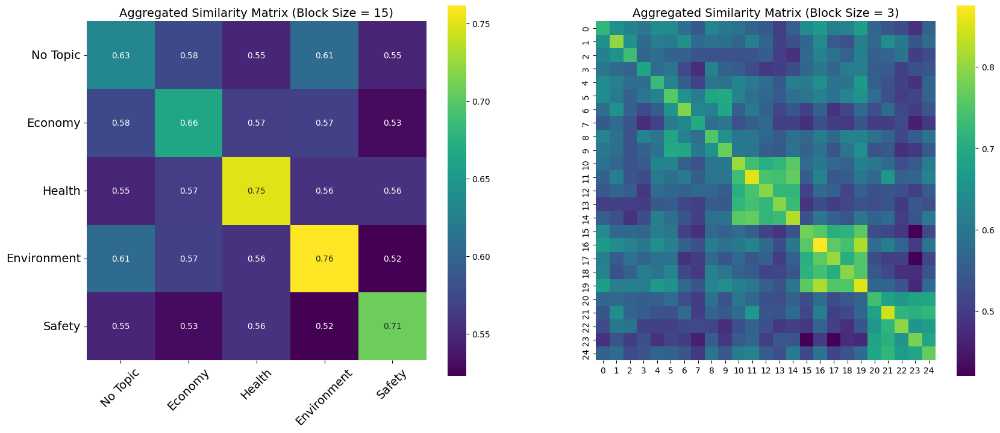

In [121]:
block_size = n_pages
aggregated_matrix = aggregate_matrix(mp_gen_text_similarity_matrix, block_size)

topic_columns = ['No Topic', 'Economy', 'Health', 'Environment', 'Safety']

# Plotting the aggregated similarity matrix
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

sns.heatmap(aggregated_matrix, cmap='viridis', square=True, ax=axes[0], annot=True)
axes[0].set_title('Aggregated Similarity Matrix (Block Size = {})'.format(block_size), fontsize=14)
axes[0].set_xticklabels(topic_columns, rotation=45, fontsize=14)
axes[0].set_yticklabels(topic_columns, rotation=0, fontsize=14)

block_size = 3
aggregated_matrix = aggregate_matrix(mp_gen_text_similarity_matrix, block_size)

# Plotting the aggregated similarity matrix
sns.heatmap(aggregated_matrix, cmap='viridis', square=True, ax=axes[1])
axes[1].set_title('Aggregated Similarity Matrix (Block Size = {})'.format(block_size), fontsize=14)

plt.show()

Intra and inter similarities distribution

In [122]:
topics = ['gen_plain','gen_economy','gen_health','gen_environment','gen_safety']

n_topics = len(topics)
block_size = n_pages

# Initialize dictionary to store similarities
topic_similarities = {}

for i in range(n_topics):
  topic_similarities[topics[i]] = {
      'intra': [],
      'inter': []
  }
  for j in range(n_topics):
    # Extract the block (i, j)
    start_row = i * n_pages
    end_row = (i + 1) * n_pages
    start_col = j * n_pages
    end_col = (j + 1) * n_pages

    block = mp_gen_text_similarity_matrix[start_row:end_row, start_col:end_col]

    if i == j:
      # Intra-similarity (within the same block)
      topic_similarities[topics[i]]['intra'].extend(block[np.triu_indices(n_pages, k=1)])  # Exclude diagonal
    else:
      # Inter-similarity (between different blocks)
      topic_similarities[topics[i]]['inter'].extend(block.flatten())

# Convert to NumPy arrays for further analysis within each block
for topic in topics:
  topic_similarities[topic]['intra'] = np.array(topic_similarities[topic]['intra'])
  topic_similarities[topic]['inter'] = np.array(topic_similarities[topic]['inter'])
#   print(f"Topic {topic} - Intra: {len(topic_similarities[topic]['intra'])}, Inter: {len(topic_similarities[topic]['inter'])}")

print(f"topic_similarities: {topic_similarities.keys()}, {topic_similarities[topics[0]].keys()}")


topic_similarities: dict_keys(['gen_plain', 'gen_economy', 'gen_health', 'gen_environment', 'gen_safety']), dict_keys(['intra', 'inter'])


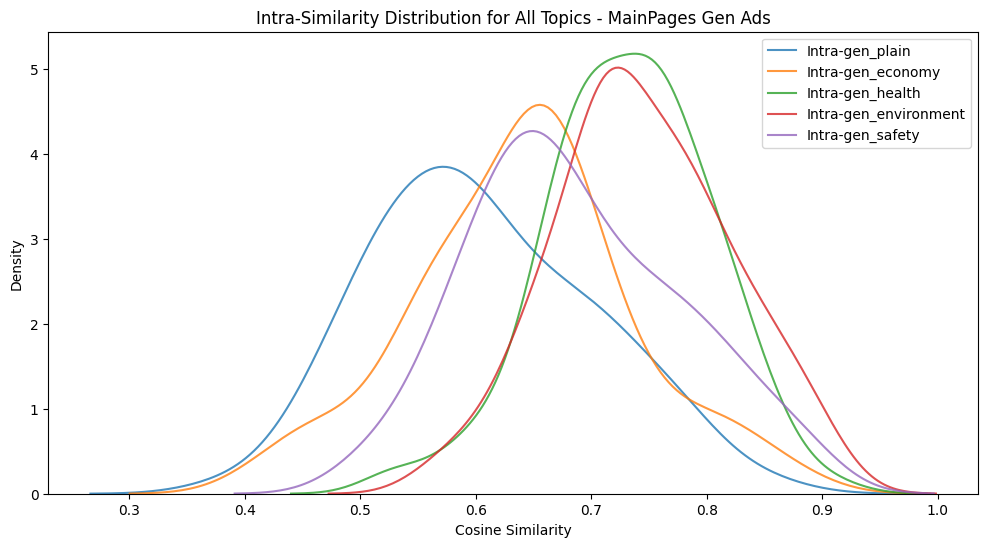

In [123]:
plt.figure(figsize=(12, 6))
for topic in topic_similarities:
  sns.kdeplot(topic_similarities[topic]['intra'], label=f'Intra-{topic}', alpha=0.8)

plt.title('Intra-Similarity Distribution for All Topics - MainPages Gen Ads')
plt.xlabel('Cosine Similarity')
plt.ylabel('Density')
plt.legend()
plt.show()

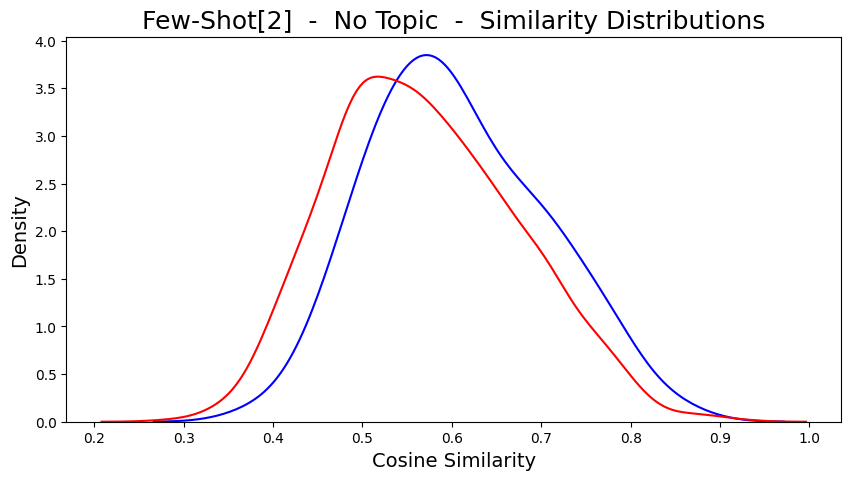

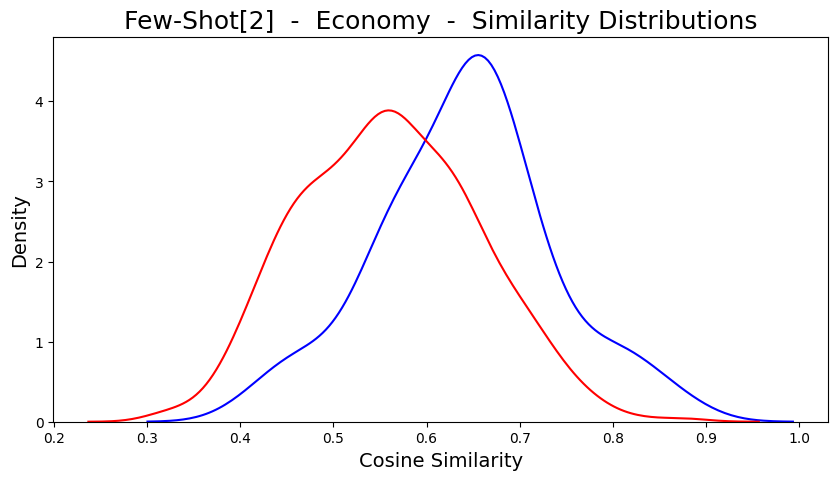

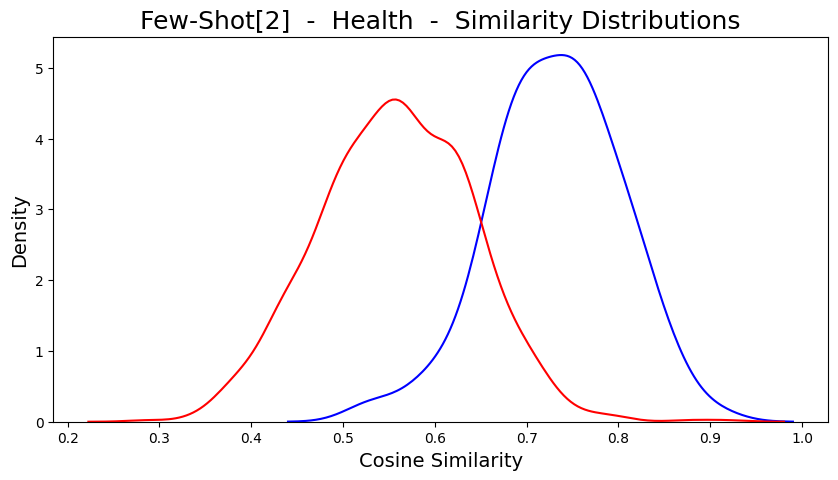

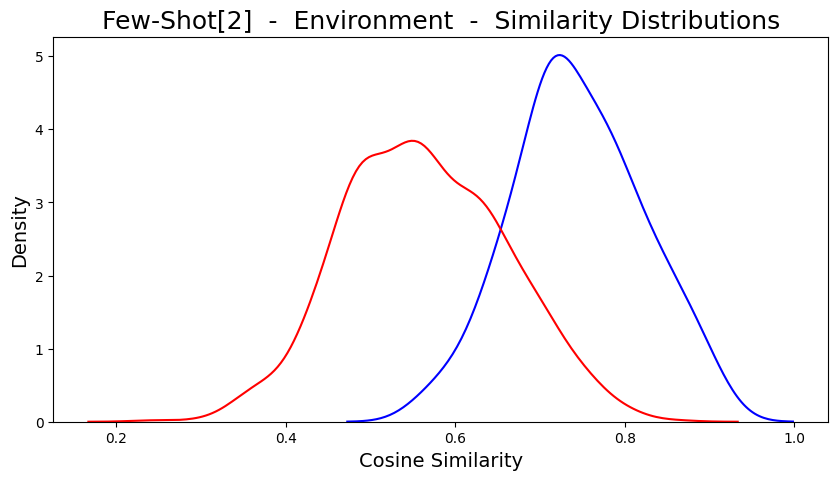

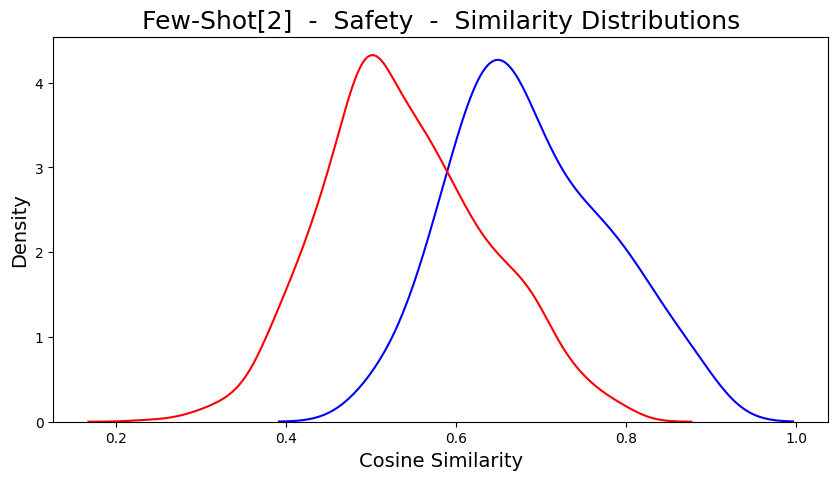

In [125]:
for i, topic in enumerate(topic_similarities):
  plt.figure(figsize=(10, 5))
  sns.kdeplot(topic_similarities[topic]['intra'], label='Intra-similarity', color='blue')
  sns.kdeplot(topic_similarities[topic]['inter'], label='Inter-similarity', color='red')

  plt.title(f'Few-Shot[2]  -  {topic_columns[i]}  -  Similarity Distributions', fontsize=18)
  plt.xlabel('Cosine Similarity', fontsize=14)
  plt.ylabel('Density', fontsize=14)
#   plt.legend(fontsize=14)
  plt.show()

### page_name

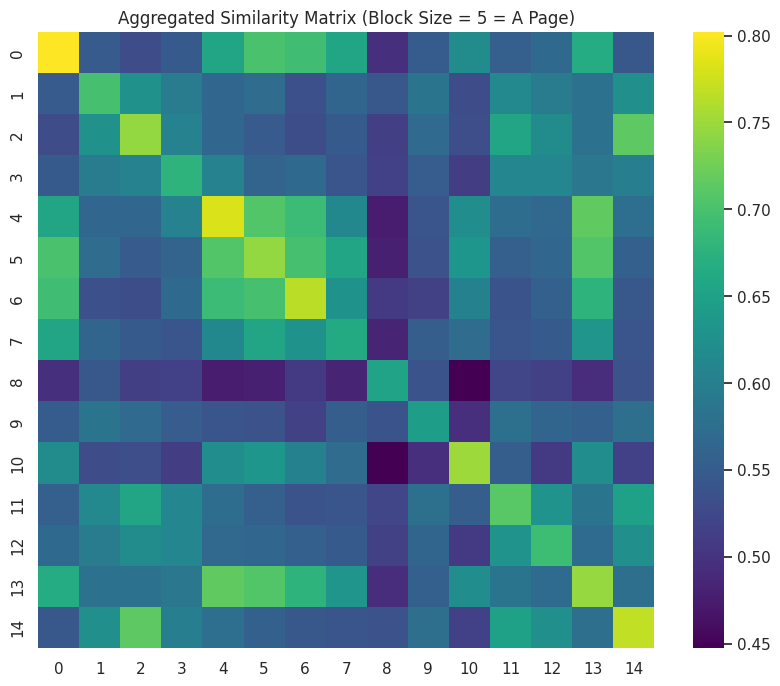

In [ ]:
# Order the embeddings for page_name

n_pages = len(mp_gen_text_df['page_name'].unique())

pn_mp_gen_text_embeddings = []
for i in range(n_pages):
    pn_mp_gen_text_embeddings.append(mp_gen_text_embeddings[i])
    pn_mp_gen_text_embeddings.append(mp_gen_text_embeddings[(i + n_pages)])
    pn_mp_gen_text_embeddings.append(mp_gen_text_embeddings[(i + n_pages * 2)])
    pn_mp_gen_text_embeddings.append(mp_gen_text_embeddings[(i + n_pages * 3)])
    pn_mp_gen_text_embeddings.append(mp_gen_text_embeddings[(i + n_pages * 4)])

pn_mp_gen_text_similarity_matrix = cosine_similarity(pn_mp_gen_text_embeddings)

block_size = 5
aggregated_matrix = aggregate_matrix(pn_mp_gen_text_similarity_matrix, block_size)

# Plotting the aggregated similarity matrix
plt.figure(figsize=(10, 8))
sns.heatmap(aggregated_matrix, cmap='viridis', square=True)
plt.title('Aggregated Similarity Matrix (Block Size = {} = A Page)'.format(block_size))
plt.show()

In [ ]:
# pages = mp_gen_text_df['page_name'].unique()

# # Generate the clustermap
# g = sns.clustermap(
#     aggregated_matrix,
#     cmap='viridis',
#     metric='euclidean',        # Distance metric for clustering
#     method='average',          # Clustering method
#     figsize=(12, 8),          # Adjust figure size as needed
#     cbar_pos=None,                # No colorbar
#     dendrogram_ratio=(.2, 0), # Adjust dendrogram size
#     xticklabels=pages,        # Labels for columns
#     yticklabels=pages,        # Labels for rows
#     annot=True,                # Annotate the heatmap cells with values
#     fmt=".2f",                 # Format for annotations
#     col_cluster=False          # Disable clustering on columns
# )

# # Customize the plot labels
# plt.setp(g.ax_heatmap.get_xticklabels(), rotation=45, ha='right')
# plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0)

# plt.title('Clustermap of Aggregated Similarity Matrix (Block Size = {})'.format(block_size))

# plt.show()


### party

party
['3POLO']    4
['AVD']      3
['FDI']      2
['FI']       2
['LEGA']     2
['M5S']      1
['PD']       1
Name: count, dtype: int64


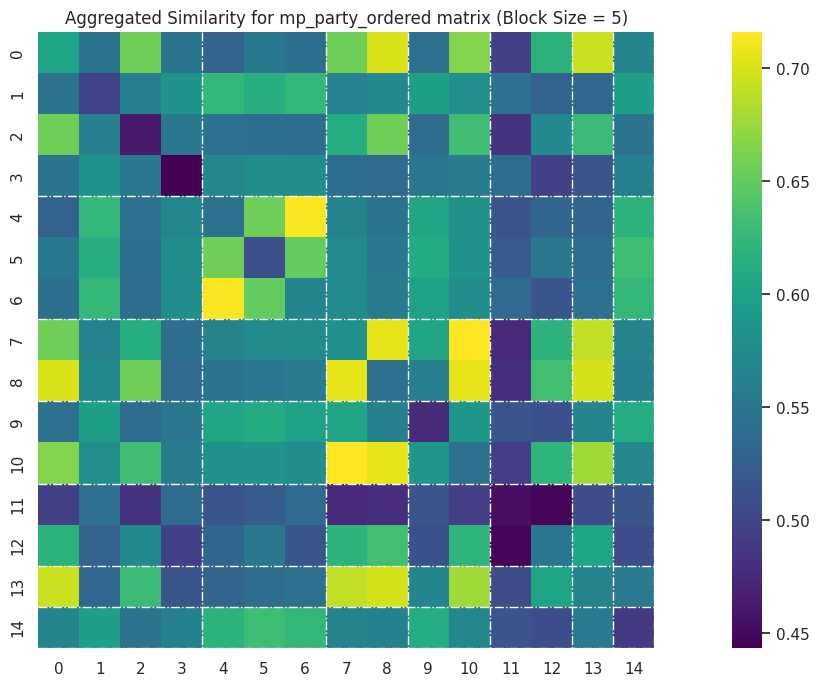

In [ ]:
# Order the embeddings for party

party_mp_gen_text_embeddings = []

for party in main_parties:
    party_indices = mp_gen_text_df[mp_gen_text_df['party'] == party].index
    for index in party_indices:
        party_mp_gen_text_embeddings.append(mp_gen_text_embeddings[index])
        party_mp_gen_text_embeddings.append(mp_gen_text_embeddings[index + len(mp_gen_text_df)])
        party_mp_gen_text_embeddings.append(mp_gen_text_embeddings[index + len(mp_gen_text_df) * 2])
        party_mp_gen_text_embeddings.append(mp_gen_text_embeddings[index + len(mp_gen_text_df) * 3])
        party_mp_gen_text_embeddings.append(mp_gen_text_embeddings[index + len(mp_gen_text_df) * 4])

party_mp_gen_text_similarity_matrix = cosine_similarity(party_mp_gen_text_embeddings)

print(mp_gen_text_df['party'].value_counts(sort=False).sort_index())

plt.figure(figsize=(20, 8))

block_size = 5 #125
np.fill_diagonal(party_mp_gen_text_similarity_matrix, 0)
aggregated_matrix = aggregate_matrix(party_mp_gen_text_similarity_matrix, block_size)

# Plotting the aggregated similarity matrix
sns.heatmap(aggregated_matrix, cmap='viridis', square=True)

# Add vertical lines at the specified xticks
cumulative_values = [4, 7, 9, 11, 13, 14, 15]

for value in cumulative_values:
    value = value*5 // block_size
    plt.vlines(x=value, ymin=0, ymax=aggregated_matrix.shape[0], color='white', linestyle='-.', linewidth=1)
    plt.hlines(y=value, xmin=0, xmax=aggregated_matrix.shape[1], color='white', linestyle='-.', linewidth=1)

plt.title('Aggregated Similarity for mp_party_ordered matrix (Block Size = {})'.format(block_size))
plt.show()


Intra and inter similarities distribution

In [ ]:
block_borders = [x * 5 for x in cumulative_values]
block_borders.insert(0, 0)  # Insert 0 at the beginning

ads_per_party = mp_gen_text_df['party'].value_counts(sort=False).sort_index().tolist()
ads_per_party = [x * 5 for x in ads_per_party]

# Initialize dictionary to store similarities
party_similarities = {}

for i in range(n_main_parties):
  party_similarities[main_parties[i]] = {
      'intra': [],
      'inter': []
  }
  for j in range(n_main_parties):
    # Extract the block (i, j)
    start_row = block_borders[i]
    end_row = block_borders[i + 1]
    start_col = block_borders[j]
    end_col = block_borders[j + 1]

    block = party_mp_gen_text_similarity_matrix[start_row:end_row, start_col:end_col]
    # print(f"Block {i}, {j}: {block.shape}, {start_row}:{end_row}, {start_col}:{end_col}")

    if i == j:
      # Intra-similarity (within the same block)
      party_similarities[main_parties[i]]['intra'].extend(block[np.triu_indices(ads_per_party[i], k=1)])
    else:
      # Inter-similarity (between different blocks)
      party_similarities[main_parties[i]]['inter'].extend(block.flatten())

# Convert to NumPy arrays for further analysis within each block
for party in main_parties:
  party_similarities[party]['intra'] = np.array(party_similarities[party]['intra'])
  party_similarities[party]['inter'] = np.array(party_similarities[party]['inter'])
#   print(f"Party {party} - Intra: {len(party_similarities[party]['intra'])}, Inter: {len(party_similarities[party]['inter'])}")

print(f"party_similarities: {party_similarities.keys()}, {party_similarities[main_parties[0]].keys()}")

party_similarities: dict_keys(["['3POLO']", "['AVD']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]), dict_keys(['intra', 'inter'])


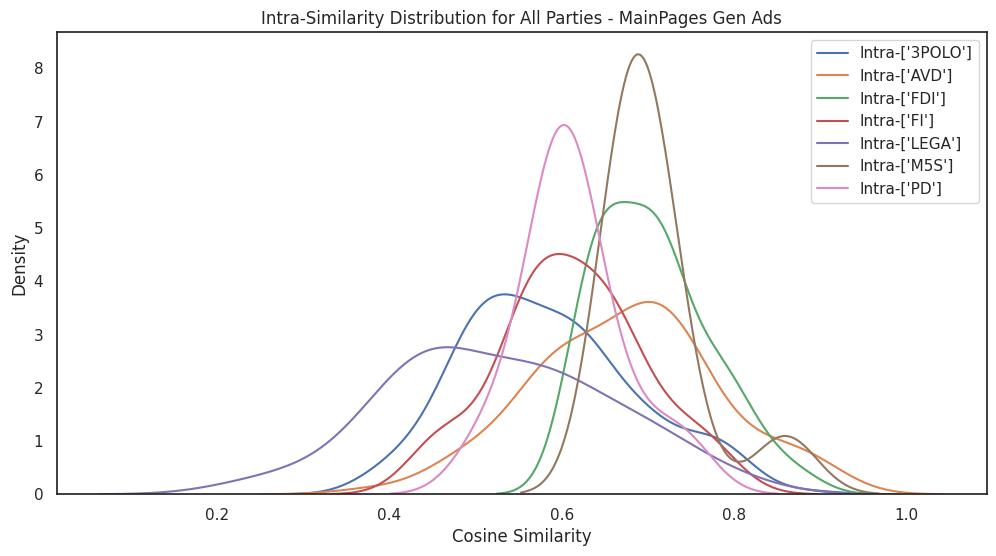

In [ ]:
plt.figure(figsize=(12, 6))
for topic in party_similarities:
#   sns.kdeplot(party_similarities[topic]['intra'], label=f'Intra-{topic}', alpha=0.8)
  sns.kdeplot(party_similarities[topic]['intra'], label=f'Intra-{topic}')

plt.title('Intra-Similarity Distribution for All Parties - MainPages Gen Ads')
plt.xlabel('Cosine Similarity')
plt.ylabel('Density')
plt.legend()
plt.show()

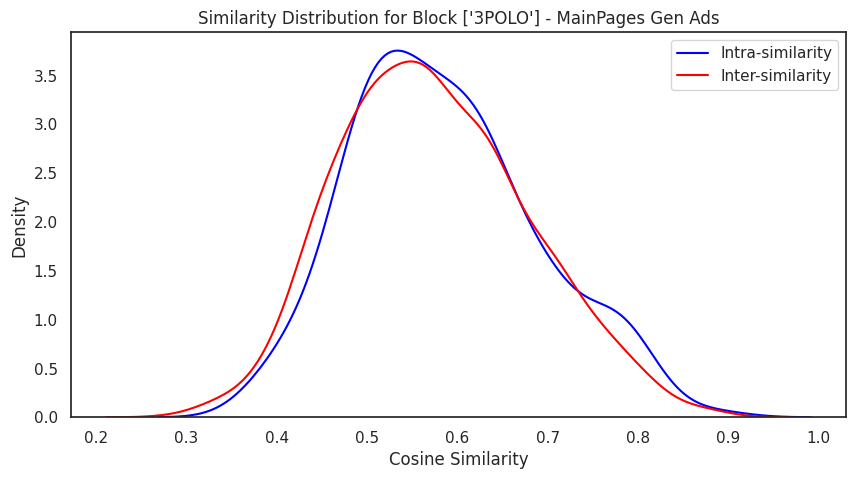

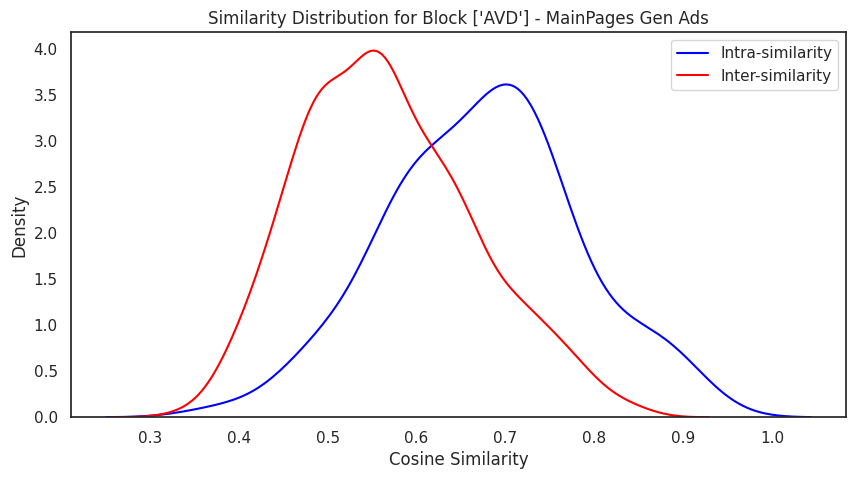

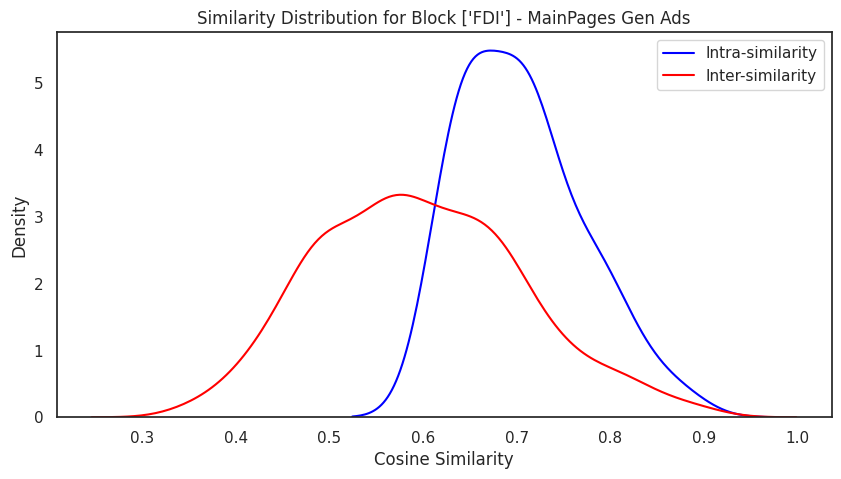

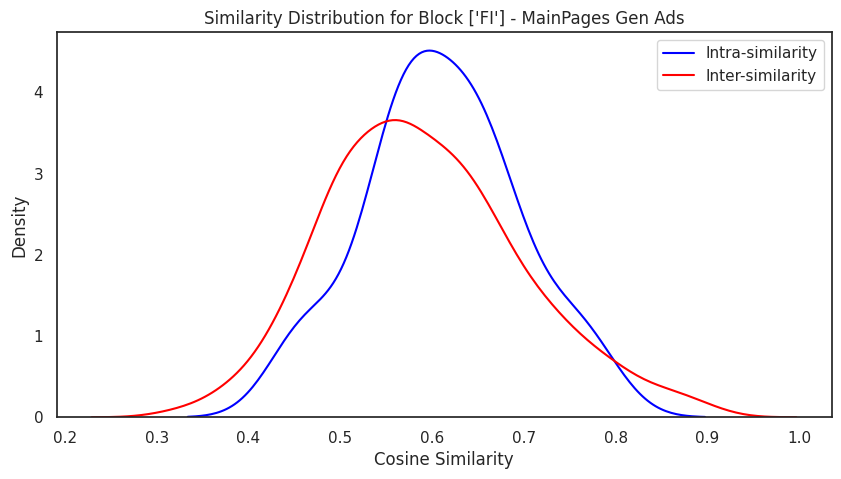

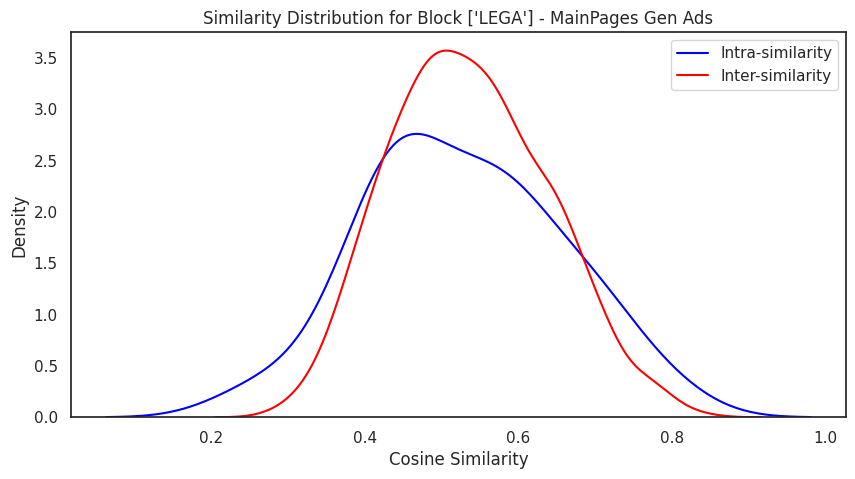

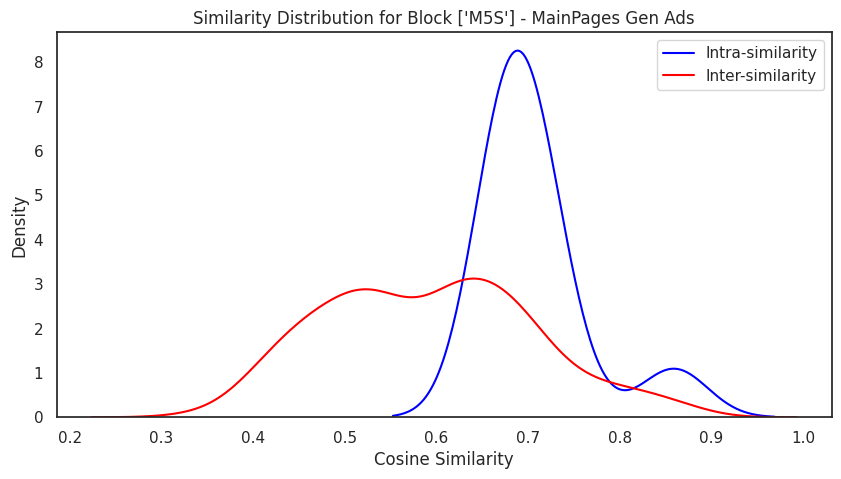

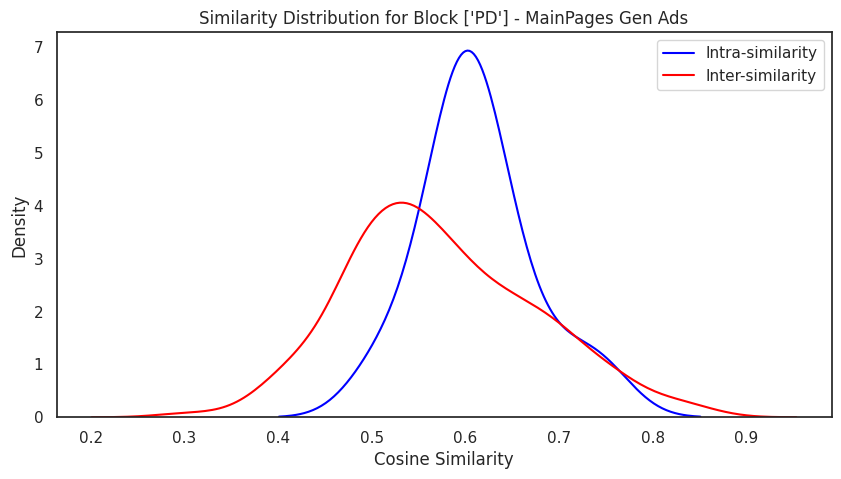

In [ ]:
for party in party_similarities:
  plt.figure(figsize=(10, 5))
  sns.kdeplot(party_similarities[party]['intra'], label='Intra-similarity', color='blue')
  sns.kdeplot(party_similarities[party]['inter'], label='Inter-similarity', color='red')

  plt.title(f'Similarity Distribution for Block {party} - MainPages Gen Ads')
  plt.xlabel('Cosine Similarity')
  plt.ylabel('Density')
  plt.legend()
  plt.show()

# [3] MainPartiesGenText - Multiple plain_text

### {S} Import mparties_gen_text_embeddings

In [ ]:
if import_embeddings:

    # Load the CSV file containing the embeddings
    embeddings_df = pd.read_csv('data/mp_gen_text_party_embeddings.csv')

    # Convert the 'embeddings' column back to lists of floats
    embeddings_df['embeddings'] = embeddings_df['embeddings'].apply(
        lambda x: np.array(list(map(float, x.split(','))))
    )

    # Access the embeddings
    mparties_gen_text_embeddings = embeddings_df['embeddings'].tolist()

### mparties_gen_text Embeddings Creation

In [ ]:
if not import_embeddings:
    sentences = []

    for i in range(n_main_parties):
        sentences.extend(mp_gen_text_df['gen_plain_list'][i])

    model = SentenceTransformer('nickprock/sentence-bert-base-italian-xxl-uncased')

    # print(len(sentences), sentences)

    mparties_gen_text_embeddings = []

    # Encode the sentences using the BERT model
    print("Processing embeddings for all texts...")

    for sentence in tqdm(sentences, desc="Embedding texts"):
        if isinstance(sentence, float) and np.isnan(sentence):
            embedding = model.encode("NaN")
        else:
            embedding = model.encode(sentence)
        mparties_gen_text_embeddings.append(embedding)


    # Assuming 'embeddings' is a list of numpy arrays
    embeddings_df = pd.DataFrame({'embeddings': [','.join(map(str, embedding)) for embedding in mparties_gen_text_embeddings]})

    # Save the DataFrame to a CSV file
    embeddings_df.to_csv('data/mp_gen_text_party_embeddings.csv', index=False)

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Processing embeddings for all texts...


Embedding texts: 100%|██████████| 350/350 [02:26<00:00,  2.38it/s]


### mparties_gen_text_embeddings Similarity

["['3POLO']", "['AVD']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]


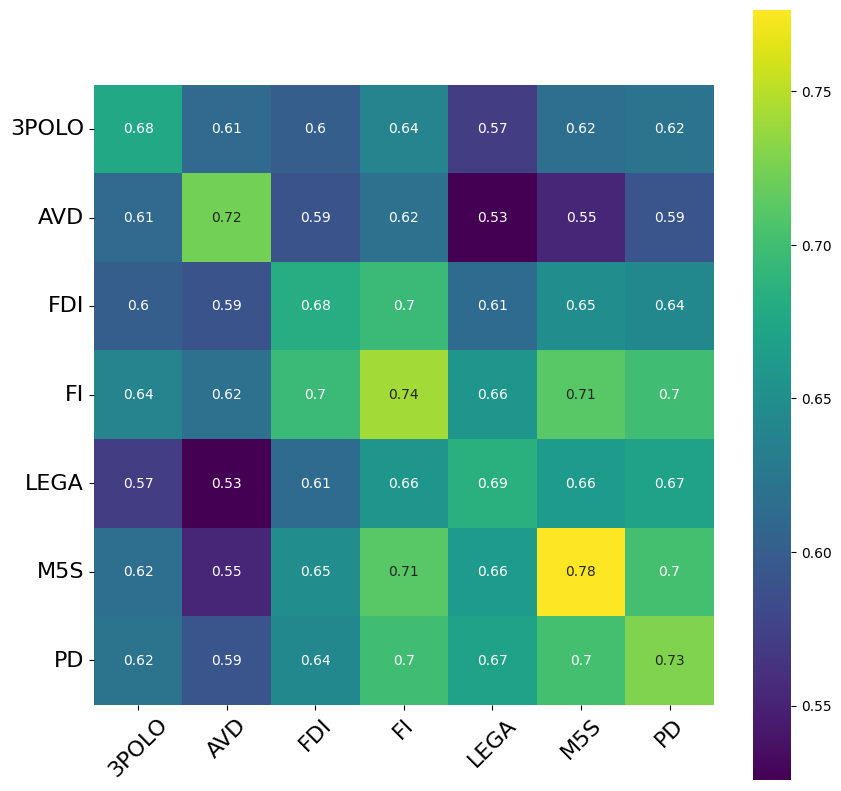

In [ ]:
# Order the embeddings for party

mparties_gen_text_similarity_matrix = cosine_similarity(mparties_gen_text_embeddings)

ads_per_party = 50

print(main_parties)

plt.figure(figsize=(10, 10))


block_size = ads_per_party
np.fill_diagonal(mparties_gen_text_similarity_matrix, 0)
aggregated_matrix = aggregate_matrix(mparties_gen_text_similarity_matrix, block_size)

# Plotting the aggregated similarity matrix
ax = sns.heatmap(aggregated_matrix, cmap='viridis', square=True, annot=True)
ax.set_xticklabels(main_parties_labels, rotation=45)
ax.set_yticklabels(main_parties_labels, rotation=0)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# plt.title('Aggregated Similarity for mp_party_ordered matrix (Block Size = {})'.format(block_size))
plt.show()


["['3POLO']", "['AVD']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]
[49, 99, 149, 199, 249, 299]


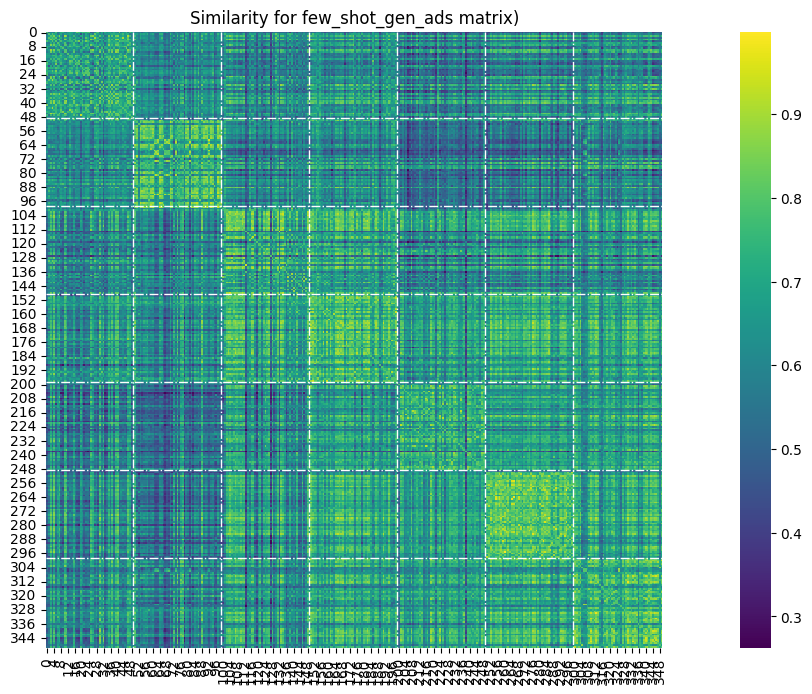

In [ ]:
print(main_parties)

plt.figure(figsize=(20, 8))
mparties_gen_text_similarity_matrix = cosine_similarity(mparties_gen_text_embeddings)
np.fill_diagonal(mparties_gen_text_similarity_matrix, 0.8)

# Plotting the aggregated similarity matrix
ax = sns.heatmap(mparties_gen_text_similarity_matrix, cmap='viridis', square=True)

block_borders = [1, 2, 3, 4, 5, 6]
block_borders = [x * ads_per_party - 1 for x in block_borders]
print(block_borders)

for value in block_borders:
    value = value
    plt.vlines(x=value, ymin=0, ymax=mparties_gen_text_similarity_matrix.shape[0], color='white', linestyle='-.', linewidth=1)
    plt.hlines(y=value, xmin=0, xmax=mparties_gen_text_similarity_matrix.shape[1], color='white', linestyle='-.', linewidth=1)

plt.title('Similarity for few_shot_gen_ads matrix)'.format(block_size))
plt.show()

In [ ]:
# # Generate the clustermap
# g = sns.clustermap(
#     aggregated_matrix,
#     cmap='viridis',
#     metric='euclidean',        # Distance metric for clustering
#     method='average',          # Clustering method
#     figsize=(8, 8),          # Adjust figure size as needed
#     cbar_pos=None,                # No colorbar
#     dendrogram_ratio=(.2, 0), # Adjust dendrogram size
#     xticklabels=main_parties,        # Labels for columns
#     yticklabels=main_parties,        # Labels for rows
#     annot=True,                # Annotate the heatmap cells with values
#     fmt=".2f",                 # Format for annotations
#     col_cluster=False          # Disable clustering on columns
# )

# # Customize the plot labels
# plt.setp(g.ax_heatmap.get_xticklabels(), rotation=45, ha='right')
# plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0)

# plt.title('Clustermap of Aggregated Similarity Matrix (Block Size = {})'.format(block_size))

# plt.show()


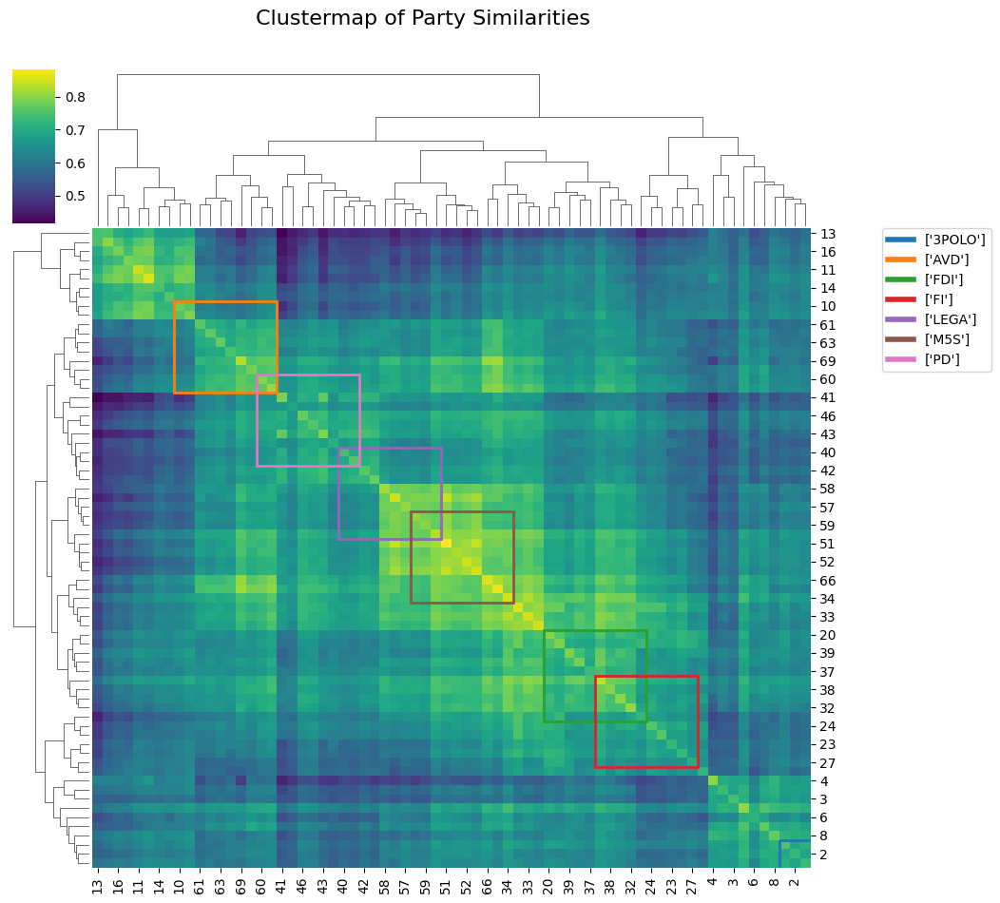

In [ ]:
mparties_gen_text_similarity_matrix = cosine_similarity(mparties_gen_text_embeddings)
block_size = 5
mparties_gen_text_similarity_matrix = aggregate_matrix(mparties_gen_text_similarity_matrix, block_size)


# Assuming you have main_parties and each party has 50 ads
num_ads_per_party = 10
num_parties = len(main_parties)

# Generate a color palette with a unique color for each party
colors = sns.color_palette()  # You can change the palette as you like

# Generate the clustermap
g = sns.clustermap(
    mparties_gen_text_similarity_matrix,
    cmap='viridis',
    metric='euclidean',
    method='average',
    figsize=(9, 9),
    dendrogram_ratio=(.1, .2),
    cbar_pos=(0.02, 0.8, 0.05, 0.18),
)
# Set a title for the overall plot
g.fig.suptitle('Clustermap of Party Similarities', fontsize=16, y=1.05)

# Get the reordered indices for rows and columns from the dendrogram
row_reordered = g.dendrogram_row.reordered_ind
col_reordered = g.dendrogram_col.reordered_ind

# Get the axes where the heatmap is plotted
ax = g.ax_heatmap

# Loop through each party and draw rectangles around their corresponding block
for i in range(num_parties):
    # Calculate the original boundary for each party
    start_idx = i * num_ads_per_party
    end_idx = start_idx + num_ads_per_party

    # Get the new positions after reordering
    row_start = row_reordered.index(start_idx)
    row_end = row_reordered.index(end_idx - 1)
    col_start = col_reordered.index(start_idx)
    col_end = col_reordered.index(end_idx - 1)

    # Draw a rectangle around the reordered block for the party
    rect = Rectangle(
        (col_start, row_start),  # bottom-left corner
        num_ads_per_party,       # width (number of columns)
        num_ads_per_party,       # height (number of rows)
        linewidth=2, edgecolor=colors[i], facecolor='none'  # Add party-specific color
    )
    ax.add_patch(rect)  # Add the rectangle to the heatmap

# Create a custom legend mapping colors to party names
legend_elements = [Line2D([0], [0], color=colors[i], lw=4, label=main_parties[i]) for i in range(num_parties)]
ax.legend(handles=legend_elements, bbox_to_anchor=(1.1, 1), loc='upper left', borderaxespad=0.)

plt.show()


Intra and inter similarities distribution

In [ ]:
block_borders = [0, 1, 2, 3, 4, 5, 6, 7]
block_borders = [x * ads_per_party for x in block_borders]


# Initialize dictionary to store similarities
party_similarities = {}

for i in range(n_main_parties):
  party_similarities[main_parties[i]] = {
      'intra': [],
      'inter': []
  }
  for j in range(n_main_parties):
    # Extract the block (i, j)
    start_row = block_borders[i]
    end_row = block_borders[i + 1]
    start_col = block_borders[j]
    end_col = block_borders[j + 1]

    block = mparties_gen_text_similarity_matrix[start_row:end_row, start_col:end_col]
    # print(f"parties: i{main_parties[i]} - j{main_parties[j]}")
    # print(f"Block {i}, {j}: {block.shape}, {start_row}:{end_row}, {start_col}:{end_col}")

    if i == j:
      # Intra-similarity (within the same block)
      party_similarities[main_parties[i]]['intra'].extend(block[np.triu_indices(ads_per_party, k=1)])
    else:
      # Inter-similarity (between different blocks)
      party_similarities[main_parties[i]]['inter'].extend(block.flatten())

# Convert to NumPy arrays for further analysis within each block
for party in main_parties:
    party_similarities[party]['intra'] = np.array(party_similarities[party]['intra'])
    party_similarities[party]['inter'] = np.array(party_similarities[party]['inter'])
    # print(f"Party {party} - Intra: {len(party_similarities[party]['intra'])}, Inter: {len(party_similarities[party]['inter'])}")

print(f"party_similarities: {party_similarities.keys()}, {party_similarities[main_parties[0]].keys()}")

party_similarities: dict_keys(["['3POLO']", "['AVD']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]), dict_keys(['intra', 'inter'])


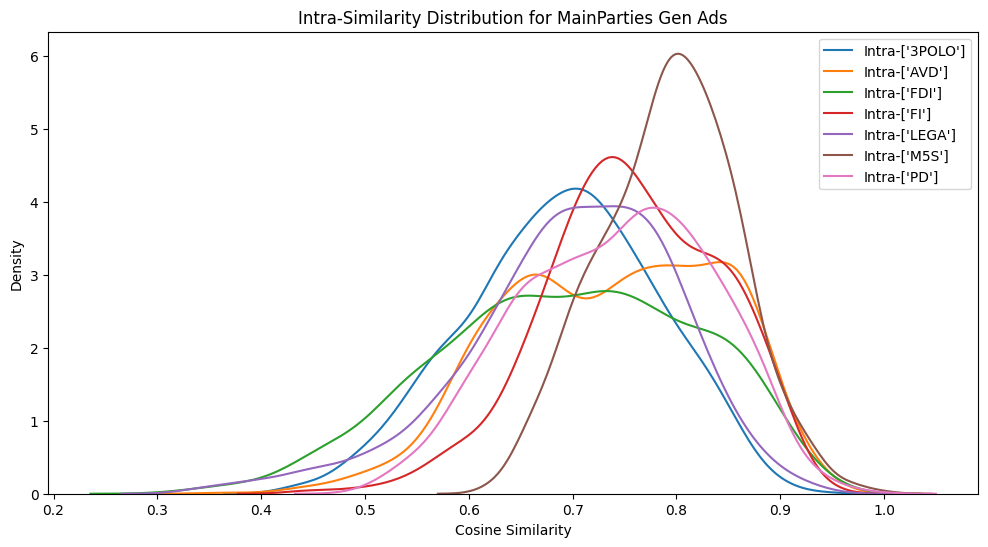

In [ ]:
plt.figure(figsize=(12, 6))
for topic in party_similarities:
#   sns.kdeplot(party_similarities[topic]['intra'], label=f'Intra-{topic}', alpha=0.8)
  sns.kdeplot(party_similarities[topic]['intra'], label=f'Intra-{topic}')

plt.title('Intra-Similarity Distribution for MainParties Gen Ads')
plt.xlabel('Cosine Similarity')
plt.ylabel('Density')
plt.legend()
plt.show()

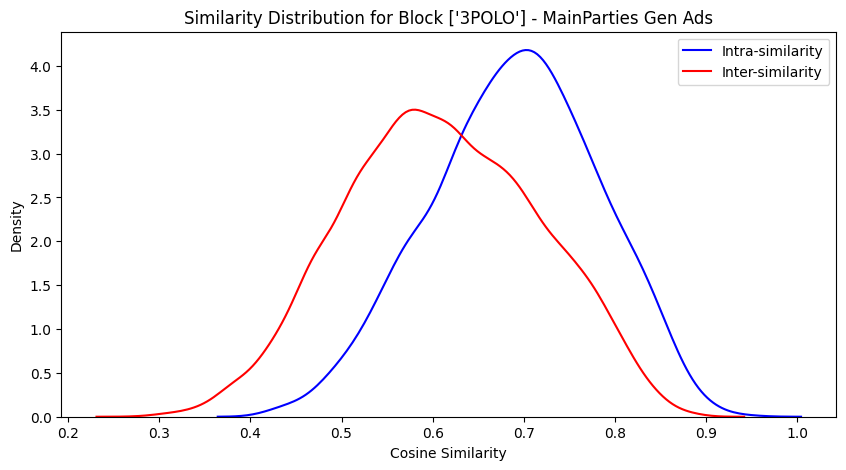

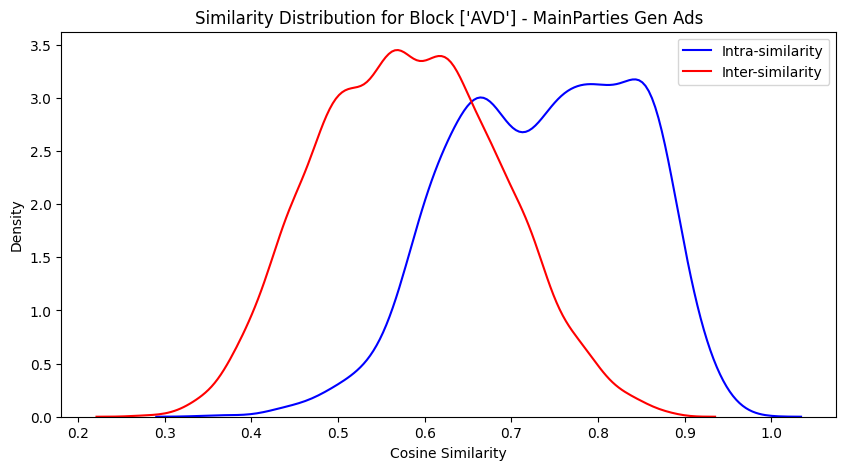

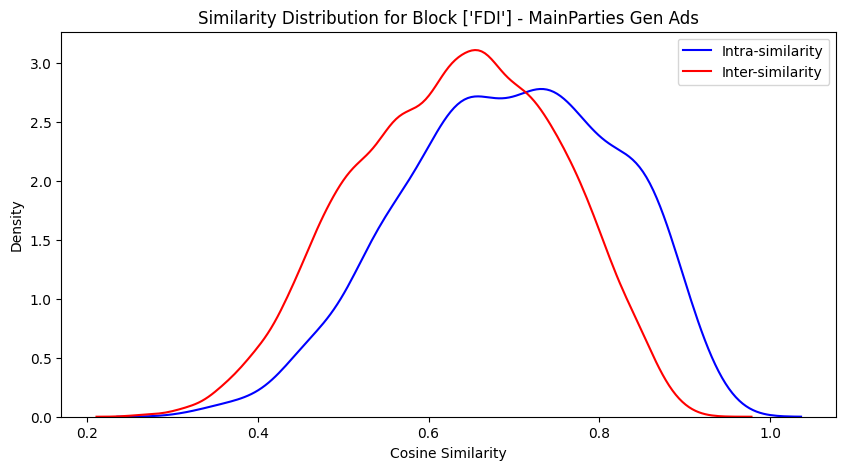

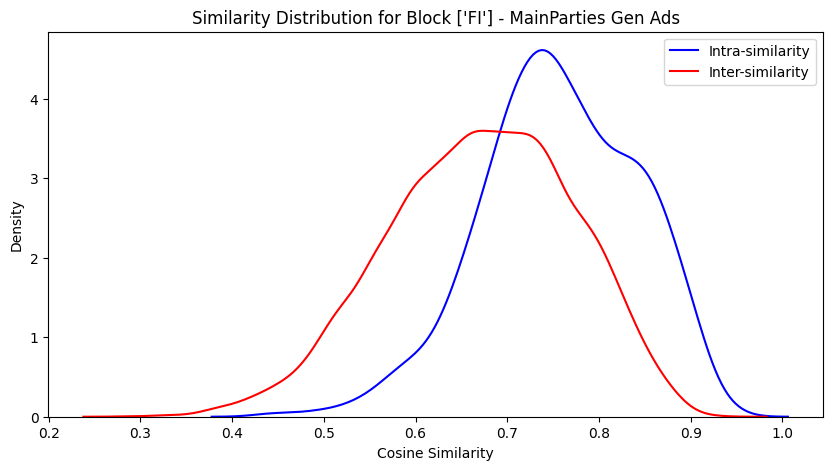

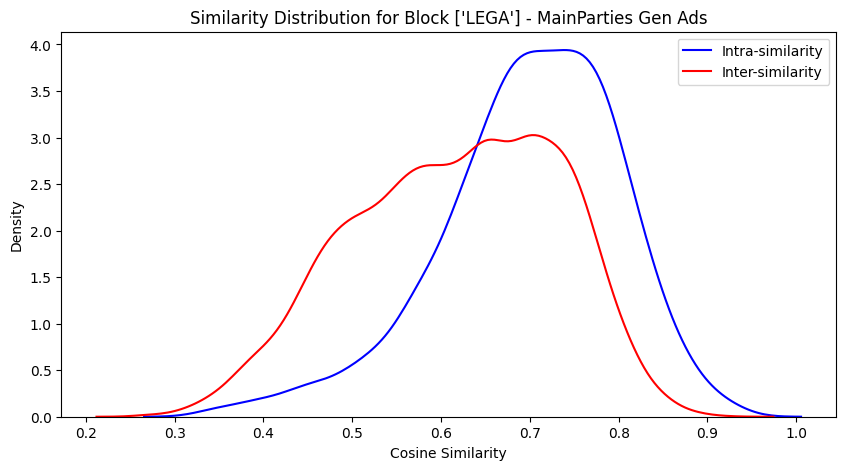

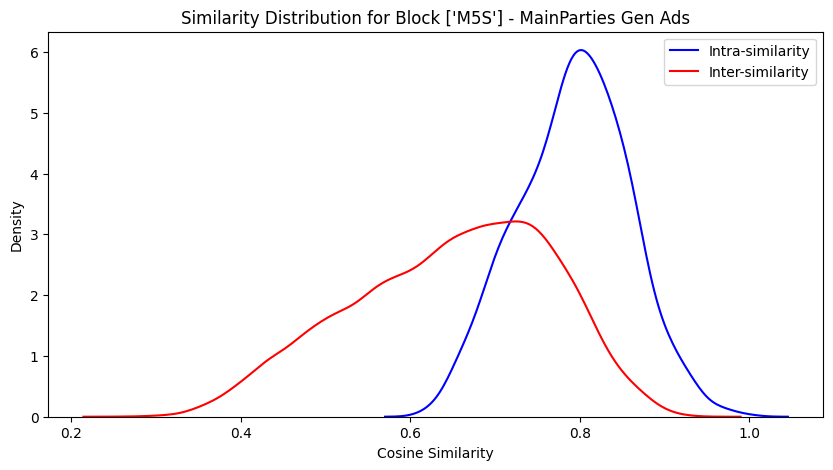

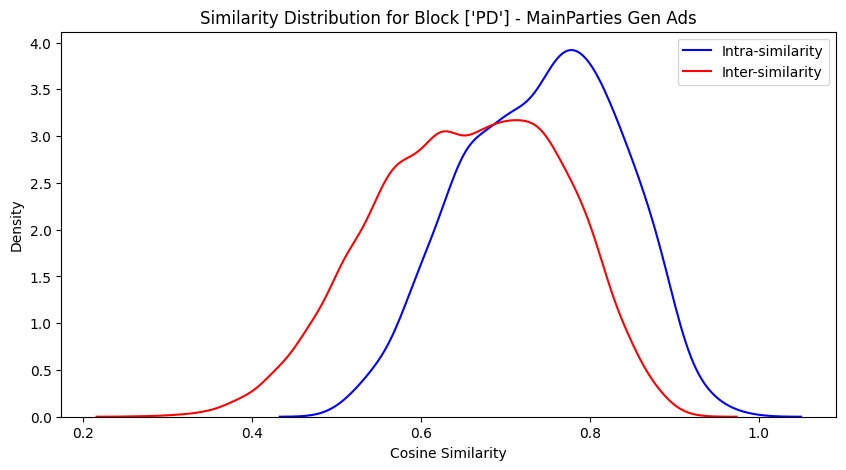

In [ ]:
for party in party_similarities:
  plt.figure(figsize=(10, 5))
  sns.kdeplot(party_similarities[party]['intra'], label='Intra-similarity', color='blue')
  sns.kdeplot(party_similarities[party]['inter'], label='Inter-similarity', color='red')

  plt.title(f'Similarity Distribution for Block {party} - MainParties Gen Ads')
  plt.xlabel('Cosine Similarity')
  plt.ylabel('Density')
  plt.legend()
  plt.show()

# --- SZN_2 ---



> Impossible is not a fact, it’s an opinion, so go build the future



# [3.1]

### Temporary new few-shots ads creation

In [ ]:
# # Initialize an empty list to store row data
# rows_data = []

# n_plain_texts = 300
# total_iterations = n_main_parties * (n_plain_texts)  # x for plain text

# print(main_parties)


# # Initialize progress bar
# with tqdm(total=total_iterations, desc="Processing pages") as pbar:
#     for party in main_parties:
#         # print(f"\n{party}")

#         # Check and wait for rate limit
#         check_rate_limit()

#         party_data = main_pages_data[main_pages_data['party'] == party]

#         # Create a row dictionary with initial data
#         row_dict = {
#             'party': party,
#         }

#         top_ads_list = []
#         responses = []


#         # Generate plain text and topic-specific text
#         for i in range(n_plain_texts):

#             # Get random x unique ad creative bodies
#             top_ads = (party_data
#                     .drop_duplicates('ad_creative_bodies')
#                     .sample(9)['ad_creative_bodies']
#                     .tolist()
#                     )
#             examples = '\n'.join([f'{i+1}. "{ad}"' for i, ad in enumerate(top_ads)])
#             # print("Examples:" + examples)
#             top_ads_list.append(top_ads)

#             prompt = generate_political_prompt(examples, party)

#             # print("PROMPT:\n" +prompt)

#             while True:
#                 try:
#                     response = client.text_generation(prompt, max_new_tokens=256)
#                     break  # Exit the loop if successful
#                 except Exception:
#                     print(f"Rate limit reached.\n{len(call_times)} Calls.\nWaiting for 60 seconds...")
#                     time.sleep(60)
#             # print("Generated ads:\n" + response + "\n ---")
#             responses.append(response)


#             # Record the call time
#             call_times.append(datetime.now())

#             pbar.update(1)

#         # Add the completed row data to the list
#         row_dict['top_ads'] = top_ads_list
#         row_dict['gen_plain_list'] = responses
#         rows_data.append(row_dict)



# # Create DataFrame from the list of dictionaries
# mp_gen_text_df = pd.DataFrame(rows_data)

# print("\nSaving gen_texts to CSV...")
# # Save the results
# mp_gen_text_df.to_csv(f'data/mp_generated_ads_party_3.csv', index=False)


# print("Process completed successfully!")
# mp_gen_text_df

["['3POLO']", "['AVD']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]


Processing pages:   0%|          | 0/2100 [00:00<?, ?it/s]


Number of calls in previus hour: 0


Processing pages:  14%|█▍        | 300/2100 [27:23<2:18:21,  4.61s/it]


Number of calls in previus hour: 300


Processing pages: 100%|██████████| 2100/2100 [3:30:11<00:00,  6.01s/it]



Saving gen_texts to CSV...
Process completed successfully!


,party,top_ads,gen_plain_list
0,['3POLO'],"[[Gli altri fanno promesse, noi presentiamo ri...","[""Il futuro dell'Italia non può essere affidat..."
1,['AVD'],"[[🟢🔴Come #AlleanzaVerdiSinistra, non abbiamo p...","[""🟢🔴 Il futuro dell'Italia è verde! Noi di #A..."
2,['FDI'],[[Cosa vogliamo fare del Reddito di Cittadinan...,"[""Pronti a sostenere le famiglie italiane. Il ..."
3,['FI'],"[[L’ho detto tante volte, lo ripeto anche oggi...","[""Siamo al bivio: o un governo amico del lavor..."
4,['LEGA'],"[[Grazie alla Lega la Flat Tax al 15% è, già o...","[""Stop ai burocrati di Bruxelles! Credo nell'I..."
5,['M5S'],[[Vogliamo eliminare il divario salariale tra ...,"[""Non lasciare che la sanità pubblica venga sm..."
6,['PD'],[[“1000 piazze per l’Italia” è la campagna di ...,"[""La tua voce conta! Il 25 settembre scegli il..."


In [ ]:
# # Initialize an empty list to store row data
# rows_data = []

# n_plain_texts = 500
# total_iterations = n_main_parties * (n_plain_texts)  # x for plain text

# # Load the Sentence BERT model
# model = SentenceTransformer('nickprock/sentence-bert-base-italian-xxl-uncased')

# clear_output()
# print(main_parties)

# # Initialize lists to hold embeddings
# all_gen_text_embeddings = []
# # all_top_ads_embeddings = []

# # Initialize progress bar
# with tqdm(total=total_iterations, desc="Processing pages") as pbar:
#     for party in main_parties:
#         # print(f"\n{party}")

#         # Check and wait for rate limit
#         check_rate_limit()

#         party_data = main_pages_data[main_pages_data['party'] == party]

#         # Create a row dictionary with initial data
#         row_dict = {
#             'party': party,
#         }

#         top_ads_list = []
#         responses = []

#         gen_text_embeddings = []
#         # top_ads_embeddings = []

#         # Generate plain text and topic-specific text
#         for i in range(n_plain_texts):

#             # Get random x unique ad creative bodies
#             top_ads = (party_data
#                     .drop_duplicates('ad_creative_bodies')
#                     .sample(9)['ad_creative_bodies']
#                     .tolist()
#                     )
#             examples = '\n'.join([f'{i+1}. "{ad}"' for i, ad in enumerate(top_ads)])
#             # print("Examples:" + examples)
#             top_ads_list.append(top_ads)


#             # ad_embeddings = []
#             # for ad in examples:
#             #     if isinstance(ad, float) and np.isnan(ad):
#             #         embedding = model.encode("NaN")
#             #     else:
#             #         embedding = model.encode(ad)
#             #     ad_embeddings.append(embedding)
#             # # Append the entire list of 9 embeddings (no flattening)
#             # top_ads_embeddings.append(ad_embeddings)
#             # print("top_ads embedding Created")


#             prompt = generate_political_prompt(examples, party)

#             # print("PROMPT:\n" +prompt)

#             while True:
#                 try:
#                     response = client.text_generation(prompt, max_new_tokens=256)
#                     break  # Exit the loop if successful
#                 except Exception:
#                     print(f"Rate limit reached.\n{len(call_times)} Calls.\nWaiting for 60 seconds...")
#                     time.sleep(60)
#             # print("Generated ads:\n" + response + "\n ---")
#             responses.append(response)

#             if isinstance(response, float) and np.isnan(response):
#                 embedding = model.encode("NaN")
#             else:
#                 embedding = model.encode(response)
#             gen_text_embeddings.append(embedding)
#             # print("Ad embedding Created")


#             # Record the call time
#             call_times.append(datetime.now())

#             pbar.update(1)

#         # Add the completed row data to the list
#         row_dict['top_ads'] = top_ads_list
#         row_dict['gen_plain_list'] = responses
#         rows_data.append(row_dict)

#         all_gen_text_embeddings.append(gen_text_embeddings)
#         # all_top_ads_embeddings.append(top_ads_embeddings)


# # Create DataFrame from the list of dictionaries
# mp_gen_text_df = pd.DataFrame(rows_data)

# print("\nSaving gen_texts to CSV...")
# # Save the results
# mp_gen_text_df.to_csv(f'data/mp_generated_ads_party_3.csv', index=False)


# print("Saving embeddings to a single CSV file...")

# # Create a DataFrame with the generated text embeddings
# combined_df = pd.DataFrame({
#     'gen_text_embeddings': ['|'.join([','.join(map(str, embedding)) for embedding in gen_text_list]) for gen_text_list in all_gen_text_embeddings]
# })

# # # Create a DataFrame with both the generated text and top ads embeddings
# # combined_df = pd.DataFrame({
# #     'gen_text_embeddings': ['|'.join([','.join(map(str, embedding)) for embedding in gen_text_list]) for gen_text_list in all_gen_text_embeddings],
# #     'top_ads_embeddings': ['||'.join(['|'.join([','.join(map(str, embedding)) for embedding in ad_list]) for ad_list in top_ads_list]) for top_ads_list in all_top_ads_embeddings]
# # })

# # Save the combined DataFrame to a single CSV file
# combined_df.to_csv('data/mp_gen_text_party_3_embeddings.csv', index=False)

# print("Process completed successfully!")
# mp_gen_text_df, combined_df

["['3POLO']", "['AVD']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]


Processing pages:  22%|██▏       | 768/3500 [1:06:24<7:27:04,  9.82s/it]

## [3.1] Ads Generation and Embeddings Creation

In [ ]:
if not import_embeddings:
    print(main_parties)

    # Initialize an empty list to store row data
    rows_data = []

    n_plain_texts = 100
    total_iterations = n_main_parties * (n_plain_texts)  # x for plain text + number of topics

    # Initialize progress bar
    with tqdm(total=total_iterations, desc="Processing pages") as pbar:
        for party in main_parties:
            # print(f"\n{party}")

            # Check and wait for rate limit
            check_rate_limit()

            party_data = main_pages_data[main_pages_data['party'] == party]

            # Create a row dictionary with initial data
            row_dict = {
                'party': party,
            }

            top_ads_list = []
            responses = []

            # Generate plain text and topic-specific text
            for i in range(n_plain_texts):

                # Get random x unique ad creative bodies
                top_ads = (party_data
                        .drop_duplicates('ad_creative_bodies')
                        .sample(9)['ad_creative_bodies']
                        .tolist()
                        )
                examples = '\n'.join([f'{i+1}. "{ad}"' for i, ad in enumerate(top_ads)])
                # print("Examples:" + examples)

                prompt = generate_political_prompt(examples, party)

                # print("PROMPT:\n" +prompt)

                while True:
                    try:
                        response = client.text_generation(prompt, max_new_tokens=256)
                        break  # Exit the loop if successful
                    except Exception:
                        print(f"Rate limit reached.\n{len(call_times)} Calls.\nWaiting for 60 seconds...")
                        time.sleep(60)

                # print("Generated ads:\n" + response + "\n ---")
                top_ads_list.append(top_ads)
                responses.append(response)

                # Record the call time
                call_times.append(datetime.now())

                pbar.update(1)

            # Add the completed row data to the list
            row_dict['top_ads'] = top_ads_list
            row_dict['gen_plain_list'] = responses
            rows_data.append(row_dict)

    # Create DataFrame from the list of dictionaries
    mp_gen_text_df = pd.DataFrame(rows_data)

    print("\nSaving results to CSV...")
    # Save the results
    mp_gen_text_df.to_csv(f'data/mp_generated_ads_party_2.csv', index=False)
    print("Process completed successfully!")
    mp_gen_text_df

In [ ]:
if not import_embeddings:
    i = random.randint(0, n_main_parties-1)
    print(f"\nParty: {mp_gen_text_df['party'][i]}\n")
    for j in range(n_plain_texts):
        print(f"{j}\nTop ads:")
        print('\n'.join(mp_gen_text_df['top_ads'][i][j]))
        print()
        print("Generated ads:")
        print(mp_gen_text_df['gen_plain_list'][i][j])

        print("\n---")

In [ ]:
if not import_embeddings:

    # Load the Sentence BERT model
    model = SentenceTransformer('nickprock/sentence-bert-base-italian-xxl-uncased')

    # Initialize lists to hold embeddings
    all_gen_text_embeddings = []
    all_top_ads_embeddings = []

    # Loop through each row in mp_gen_text_df
    print("Processing embeddings for generated text and top ads...")

    for i in tqdm(range(len(mp_gen_text_df)), desc="Embedding rows"):

        # Extract generated text and top ads for this row
        gen_text_list = mp_gen_text_df['gen_plain_list'][i]  # List of 100 strings
        top_ads_list = mp_gen_text_df['top_ads'][i]  # List of 100 lists, each containing 9 strings

        # Embeddings for generated text (list of 100 strings)
        gen_text_embeddings = []
        for sentence in gen_text_list:
            if isinstance(sentence, float) and np.isnan(sentence):
                embedding = model.encode("NaN")
            else:
                embedding = model.encode(sentence)
            gen_text_embeddings.append(embedding)

        # Append to the global list (no flattening for this one)
        all_gen_text_embeddings.append(gen_text_embeddings)

        # Embeddings for top ads (list of 100 lists, each containing 9 strings)
        top_ads_embeddings = []
        for ad_list in top_ads_list:
            ad_embeddings = []
            for ad in ad_list:
                if isinstance(ad, float) and np.isnan(ad):
                    embedding = model.encode("NaN")
                else:
                    embedding = model.encode(ad)
                ad_embeddings.append(embedding)
            # Append the entire list of 9 embeddings (no flattening)
            top_ads_embeddings.append(ad_embeddings)

        # Append the full top ads embeddings (grouped by row)
        all_top_ads_embeddings.append(top_ads_embeddings)

    # Save everything in one DataFrame
    print("Saving embeddings to a single CSV file...")

    # Create a DataFrame with both the generated text and top ads embeddings
    combined_df = pd.DataFrame({
        'gen_text_embeddings': ['|'.join([','.join(map(str, embedding)) for embedding in gen_text_list]) for gen_text_list in all_gen_text_embeddings],
        'top_ads_embeddings': ['||'.join(['|'.join([','.join(map(str, embedding)) for embedding in ad_list]) for ad_list in top_ads_list]) for top_ads_list in all_top_ads_embeddings]
    })

    # Save the combined DataFrame to a single CSV file
    combined_df.to_csv('data/mp_gen_text_party_2_embeddings.csv', index=False)

    print("Process completed successfully!")

### {S} [3.1] Import

In [ ]:
if import_embeddings:

    ads_per_party = 100

    # Load the CSV file containing the combined embeddings
    combined_df = pd.read_csv('data/mp_gen_text_party_2_embeddings.csv')

    # Convert the 'gen_text_embeddings' back to lists of NumPy arrays
    combined_df['gen_text_embeddings'] = combined_df['gen_text_embeddings'].apply(
        lambda x: [np.array(list(map(float, emb.split(',')))) for emb in x.split('|')]
    )
    combined_df['gen_text_embeddings'] = combined_df['gen_text_embeddings'].tolist()

    # Convert the 'top_ads_embeddings' back to lists of lists of NumPy arrays
    combined_df['top_ads_embeddings'] = combined_df['top_ads_embeddings'].apply(
        lambda x: [[np.array(list(map(float, emb.split(',')))) for emb in ad_list.split('|')] for ad_list in x.split('||')]
    )
    combined_df['top_ads_embeddings'] = combined_df['top_ads_embeddings'].tolist()

    combined_df['party'] = main_parties

    combined_df = combined_df[['party', 'top_ads_embeddings', 'gen_text_embeddings']]

    print("Combined embeddings loaded successfully!")

Combined embeddings loaded successfully!


In [111]:
type(combined_df['gen_text_embeddings'][0][0][0])

numpy.float64

## [3.1] Similarity

["['3POLO']", "['AVD']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]


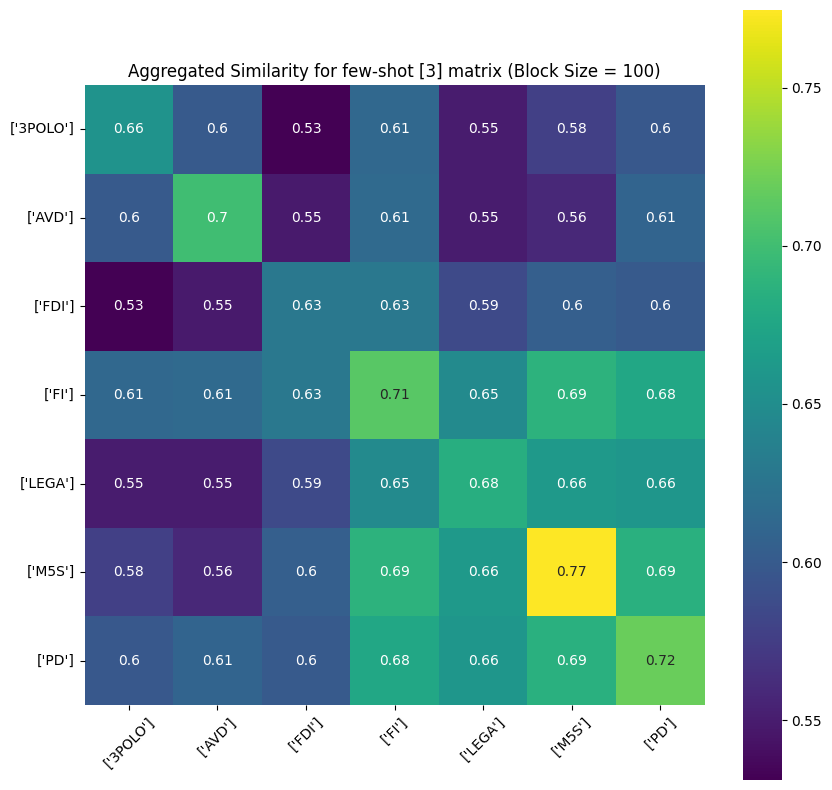

In [72]:
gen_embeddings = []
for party_i in range(n_main_parties):
    gen_embeddings.extend(combined_df['gen_text_embeddings'][party_i])

gen_embeddings_matrix = cosine_similarity(gen_embeddings)

print(main_parties)

plt.figure(figsize=(10, 10))

block_size = ads_per_party
np.fill_diagonal(gen_embeddings_matrix, 0)
aggregated_matrix = aggregate_matrix(gen_embeddings_matrix, block_size)

# Plotting the aggregated similarity matrix
ax = sns.heatmap(aggregated_matrix, cmap='viridis', square=True, annot=True)
ax.set_xticklabels(main_parties, rotation=45)
ax.set_yticklabels(main_parties, rotation=0)

plt.title('Aggregated Similarity for few-shot [3] matrix (Block Size = {})'.format(block_size))
plt.show()


### few_shots - comparison with few_shots - intra/inter similarities

In [73]:
block_borders = [0, 1, 2, 3, 4, 5, 6, 7]
block_borders = [x * ads_per_party for x in block_borders]

gen_embeddings = []
for party_i in range(n_main_parties):
    gen_embeddings.extend(combined_df['gen_text_embeddings'][party_i])

gen_embeddings_matrix = cosine_similarity(gen_embeddings)

# Initialize dictionary to store similarities
party_similarities = {}

for i in range(n_main_parties):
  party_similarities[i] = {
      'intra': [],
      'inter': []
  }
  for j in range(n_main_parties):
    # Extract the block (i, j)
    start_row = block_borders[i]
    end_row = block_borders[i + 1]
    start_col = block_borders[j]
    end_col = block_borders[j + 1]

    block = gen_embeddings_matrix[start_row:end_row, start_col:end_col]
    # print(f"parties: i{main_parties[i]} - j{main_parties[j]}")
    # print(f"Block {i}, {j}: {block.shape}, {start_row}:{end_row}, {start_col}:{end_col}")

    if i == j:
      # Intra-similarity (within the same block)
      party_similarities[i]['intra'].extend(block[np.triu_indices(ads_per_party, k=1)])
    else:
      # Inter-similarity (between different blocks)
      party_similarities[i]['inter'].extend(block.flatten())

# Convert to NumPy arrays for further analysis within each block
for i in range(n_main_parties):
    party_similarities[i]['intra'] = np.array(party_similarities[i]['intra'])
    party_similarities[i]['inter'] = np.array(party_similarities[i]['inter'])
    # print(f"Party {party} - Intra: {len(party_similarities[party]['intra'])}, Inter: {len(party_similarities[party]['inter'])}")

print(f"party_similarities: {party_similarities.keys()}, {party_similarities[0].keys()}")

party_similarities: dict_keys([0, 1, 2, 3, 4, 5, 6]), dict_keys(['intra', 'inter'])


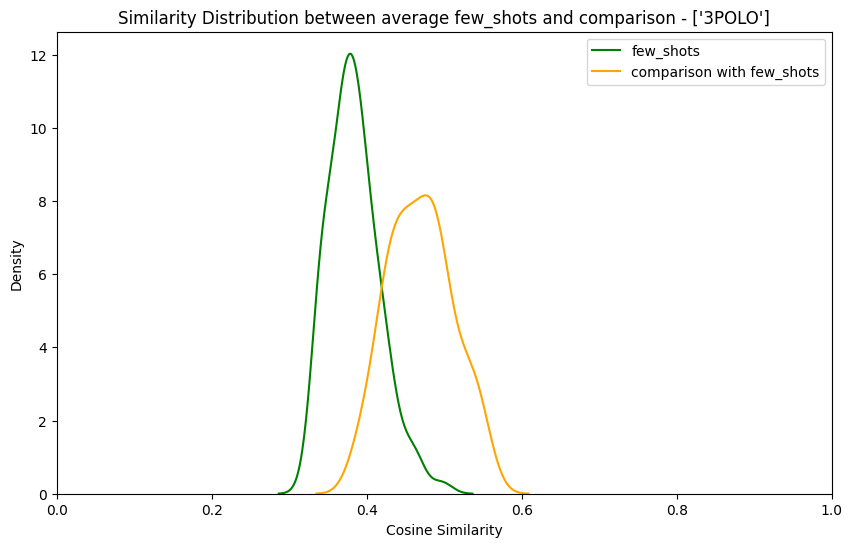

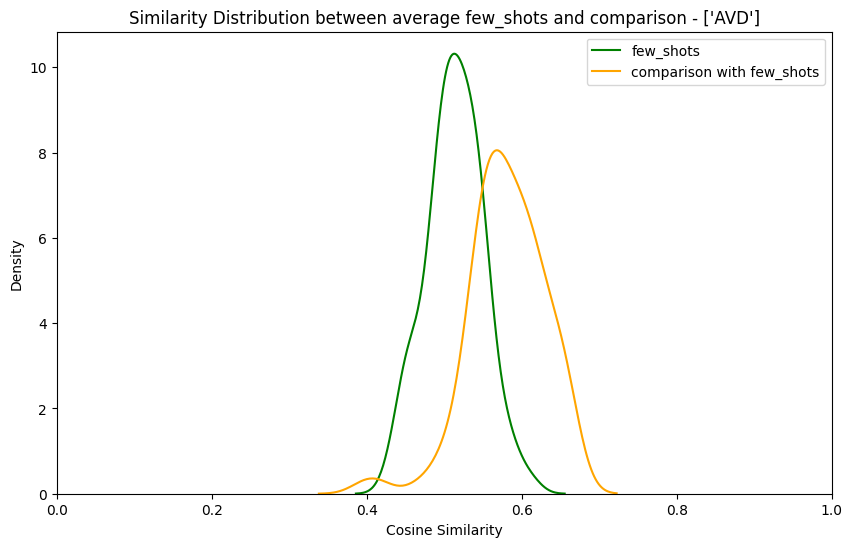

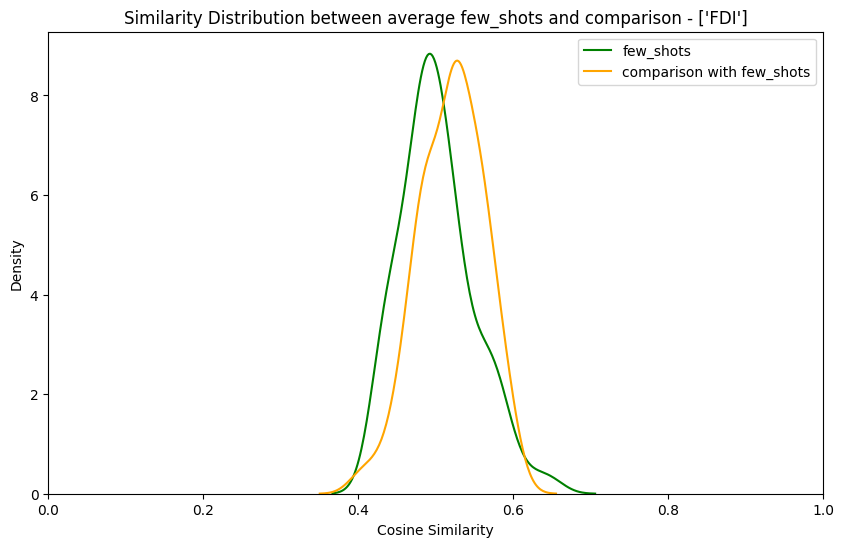

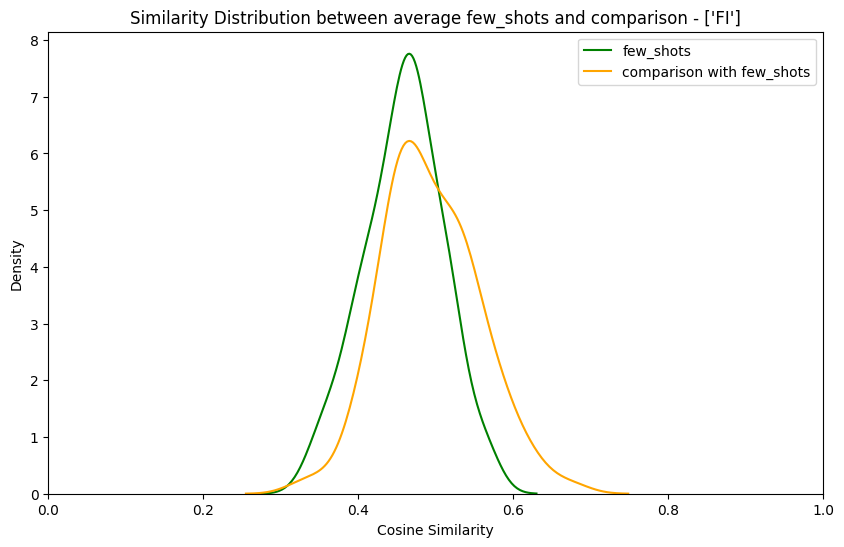

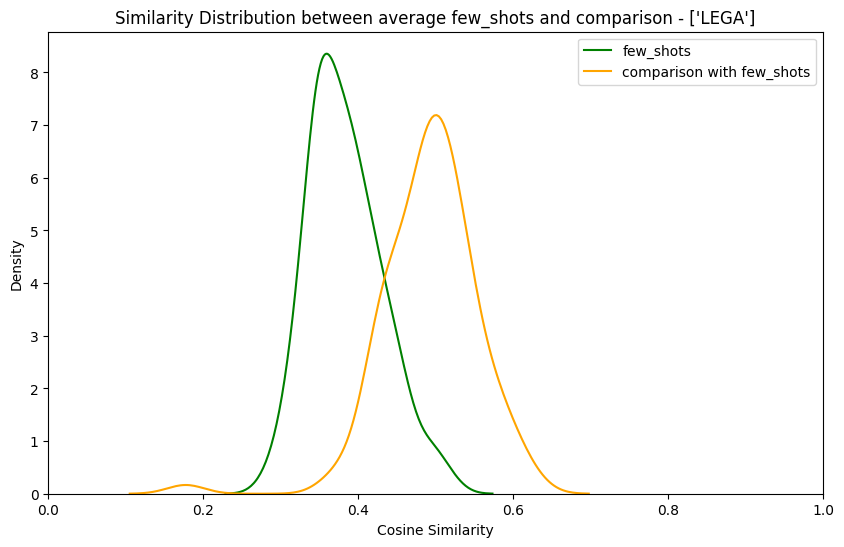

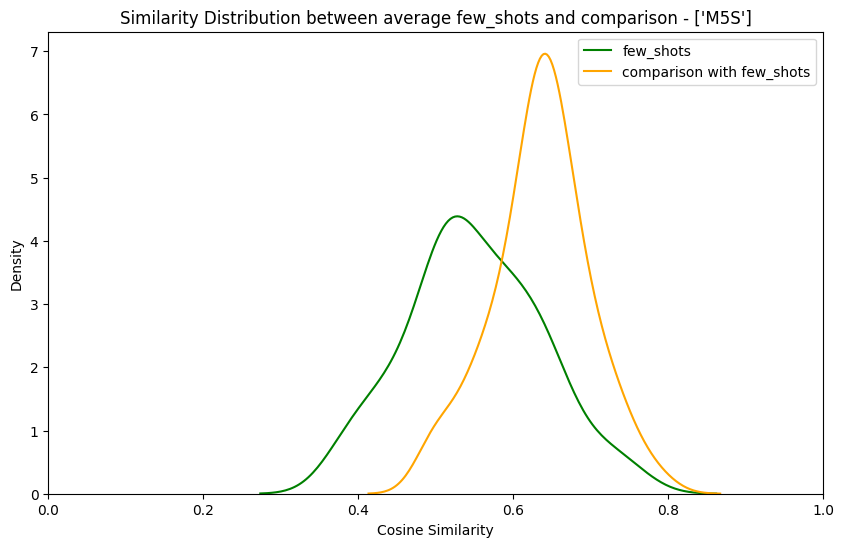

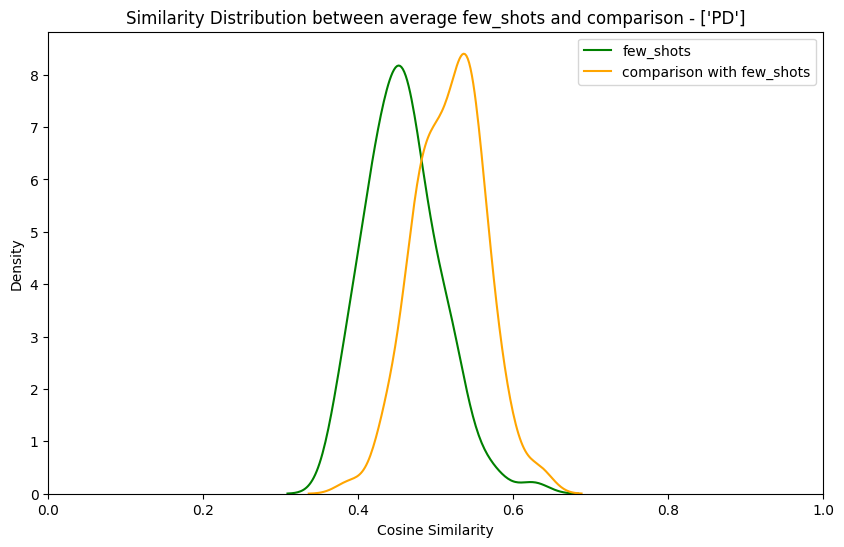

In [74]:
average_few_shots = []
average_comparison = []

for party_i in range(n_main_parties):
    average_few_shots.append([])
    average_comparison.append([])

    for i in range(ads_per_party):
        comparison_embeddings = []
        comparison_embeddings.extend(combined_df['top_ads_embeddings'][party_i][i])
        comparison_embeddings.append(combined_df['gen_text_embeddings'][party_i][i])

        comparison_embeddings_matrix = cosine_similarity(comparison_embeddings)

        # Generate indices for the upper triangle excluding the diagonal and last row
        n = 10
        row_indices, col_indices = np.triu_indices(n, k=1)
        valid_indices_fs = col_indices < n - 1
        valid_indices_cmp = col_indices == n - 1

        few_shots_similarities = comparison_embeddings_matrix[row_indices[valid_indices_fs], col_indices[valid_indices_fs]]
        # print(len(few_shots_similarities), np.mean(few_shots_similarities))
        average_few_shots[party_i].append(np.mean(few_shots_similarities))

        comparison_similarities = comparison_embeddings_matrix[row_indices[valid_indices_cmp], col_indices[valid_indices_cmp]]
        # print(len(comparison_similarities), np.mean(comparison_similarities))
        average_comparison[party_i].append(np.mean(comparison_similarities))


    plt.figure(figsize=(10, 6))
    sns.kdeplot(average_few_shots[party_i], label='few_shots', color='green')
    sns.kdeplot(average_comparison[party_i], label='comparison with few_shots', color='orange')
    plt.title(f'Similarity Distribution between average few_shots and comparison - {main_parties[party_i]}')
    plt.xlabel('Cosine Similarity')
    plt.ylabel('Density')
    plt.xlim(0, 1)
    plt.legend()
    plt.show()

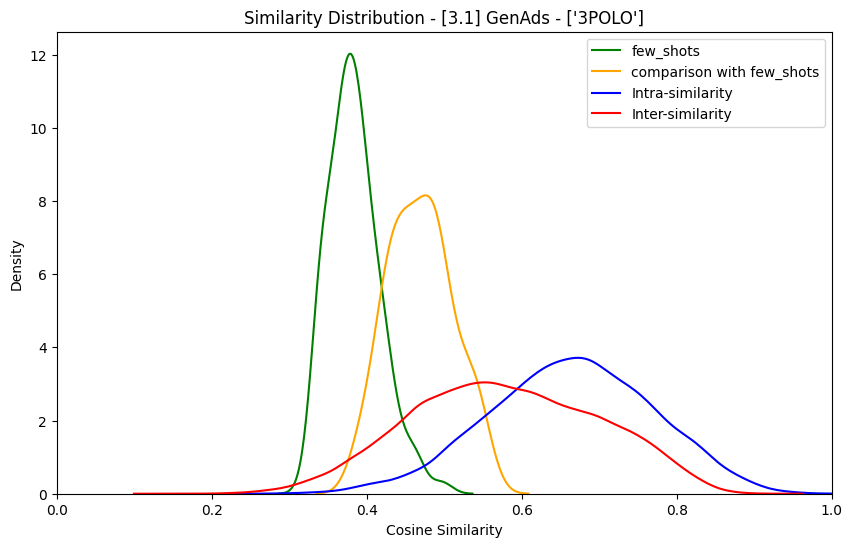

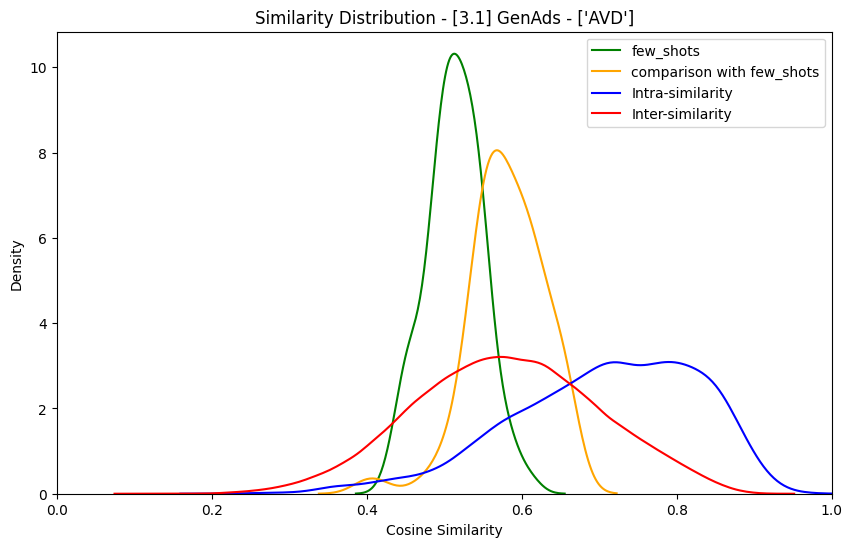

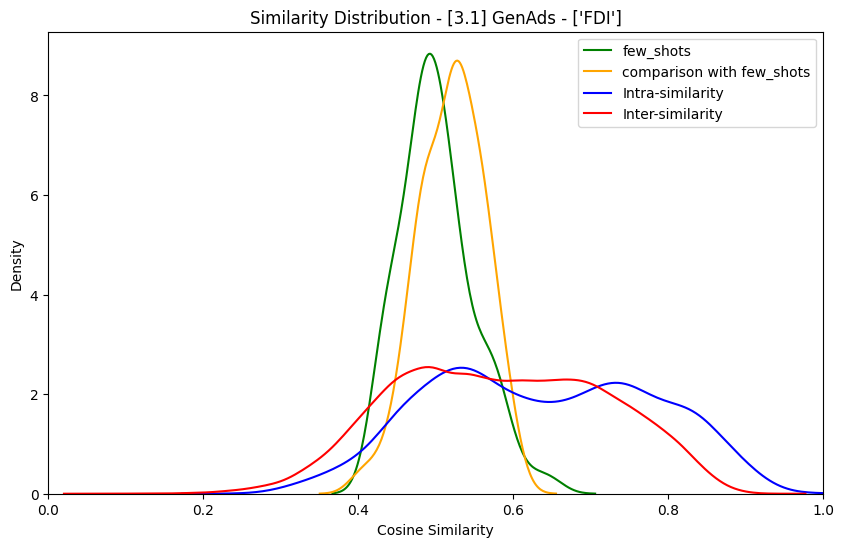

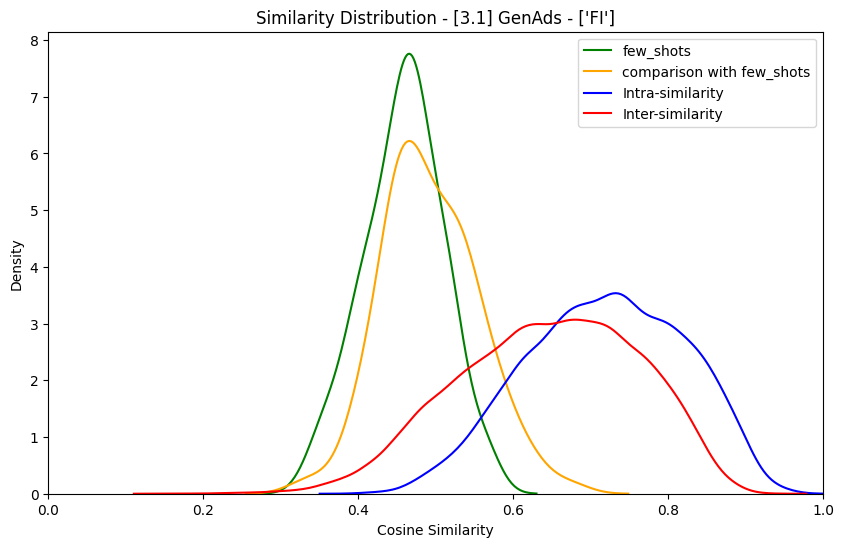

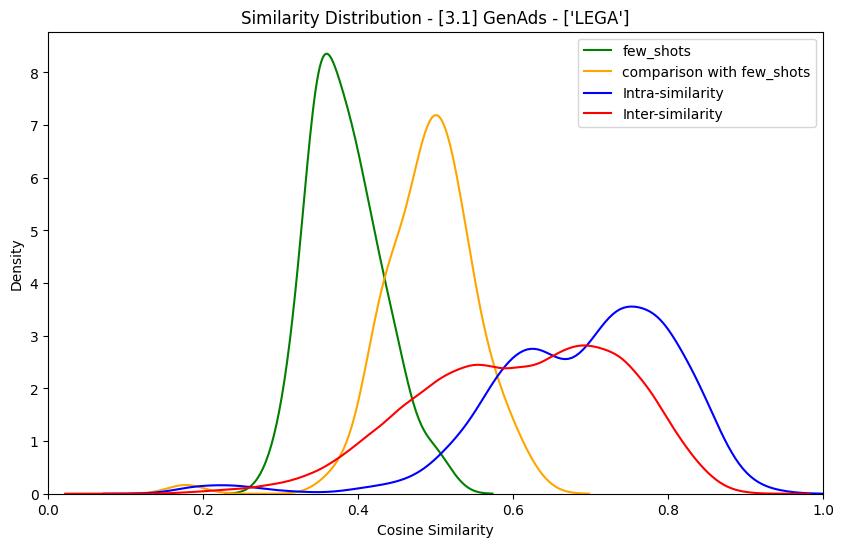

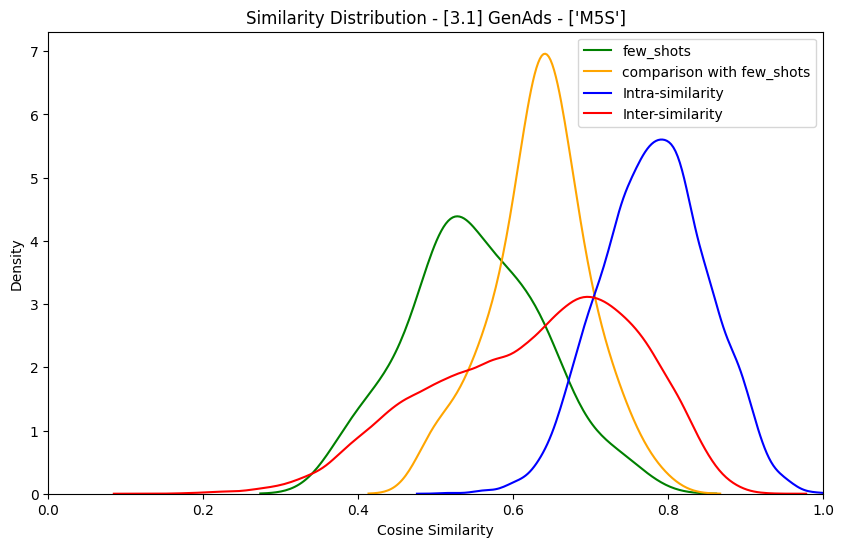

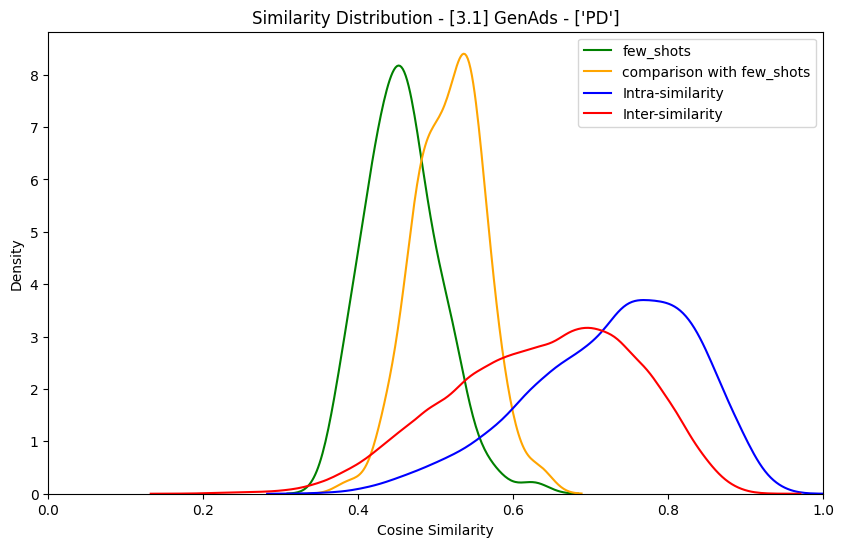

In [75]:
for party_i in range(n_main_parties):
    plt.figure(figsize=(10, 6))
    sns.kdeplot(average_few_shots[party_i], label='few_shots', color='green')
    sns.kdeplot(average_comparison[party_i], label='comparison with few_shots', color='orange')
    sns.kdeplot(party_similarities[party_i]['intra'], label='Intra-similarity', color='blue')
    sns.kdeplot(party_similarities[party_i]['inter'], label='Inter-similarity', color='red')
    plt.title(f'Similarity Distribution - [3.1] GenAds - {main_parties[party_i]}')
    plt.xlabel('Cosine Similarity')
    plt.ylabel('Density')
    plt.xlim(0, 1)
    plt.legend()
    plt.show()

### real ads - comparison with few_shots - intra/inter similarities

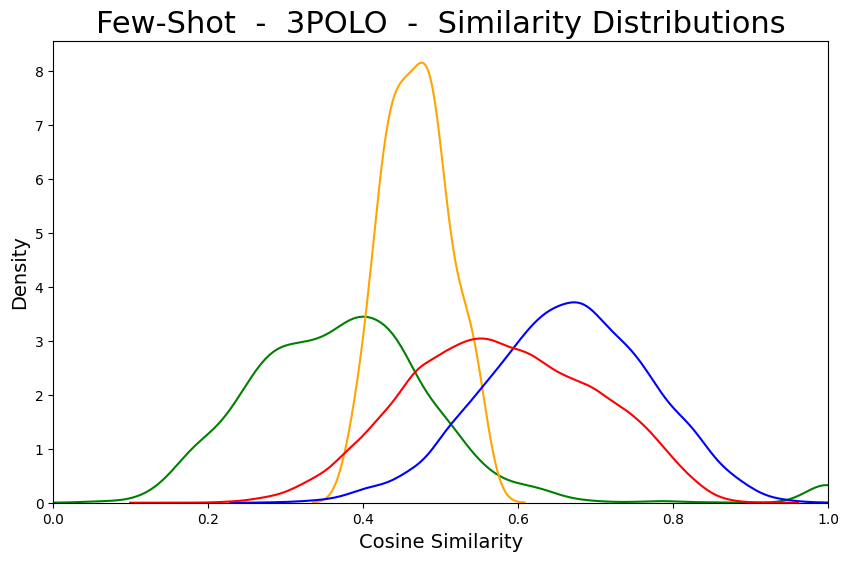

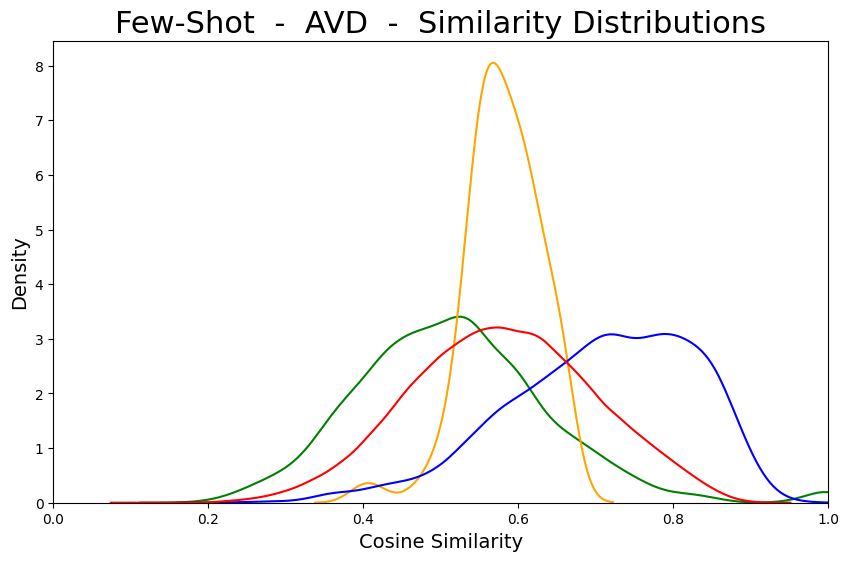

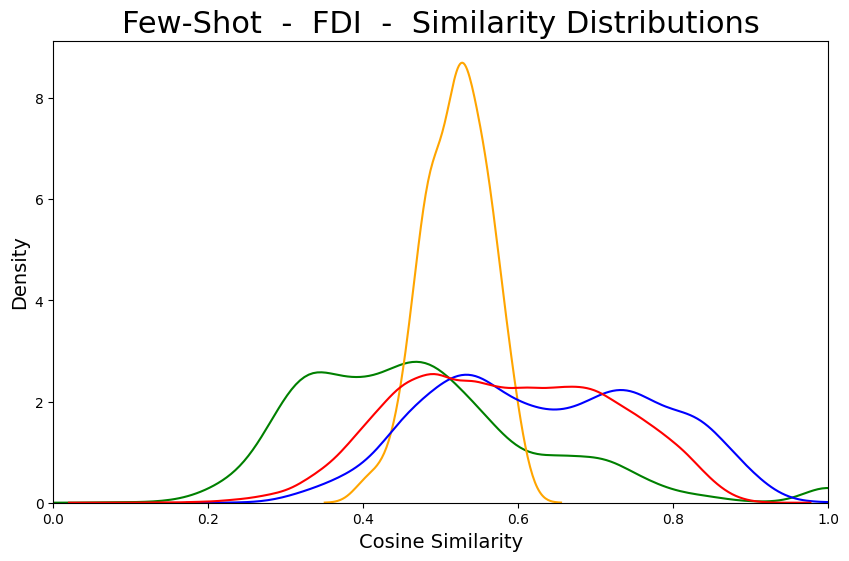

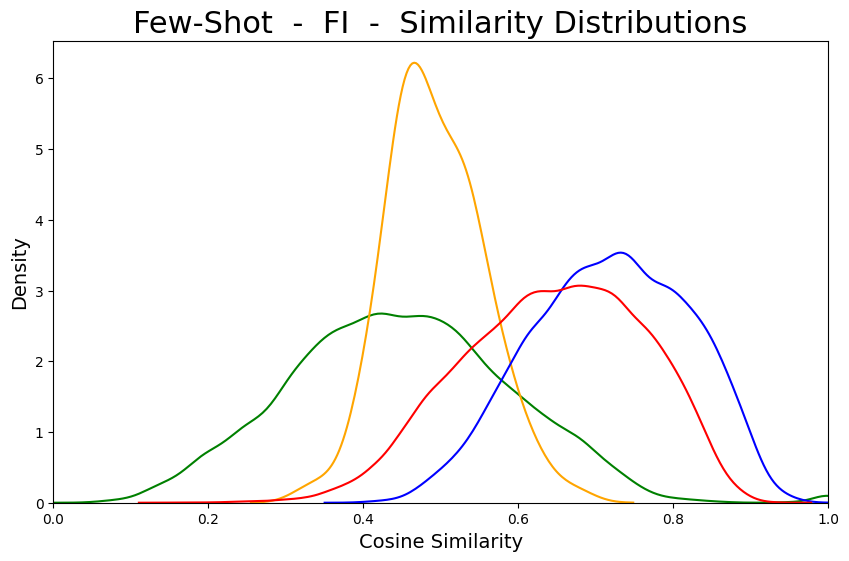

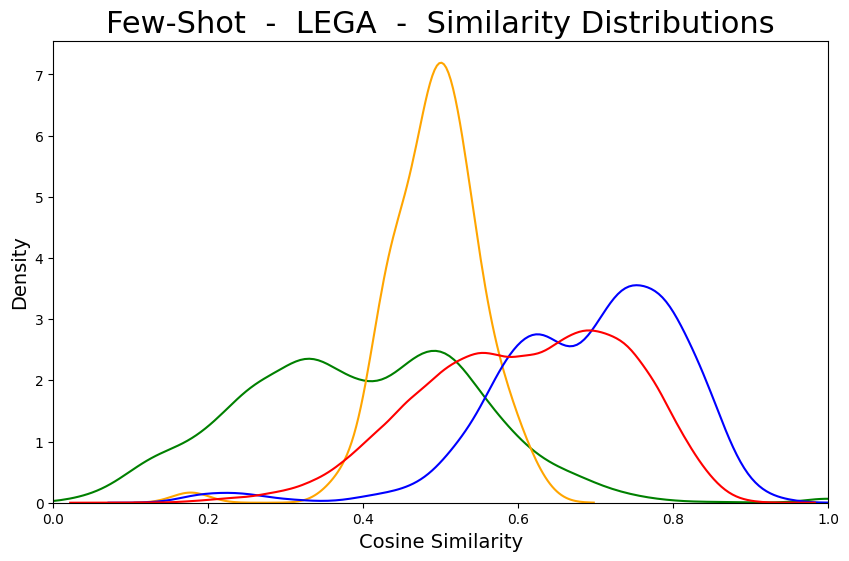

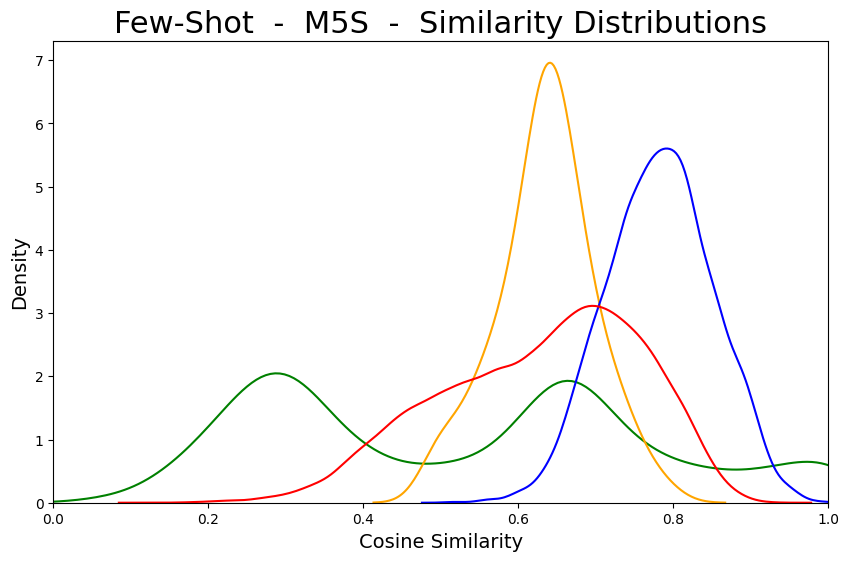

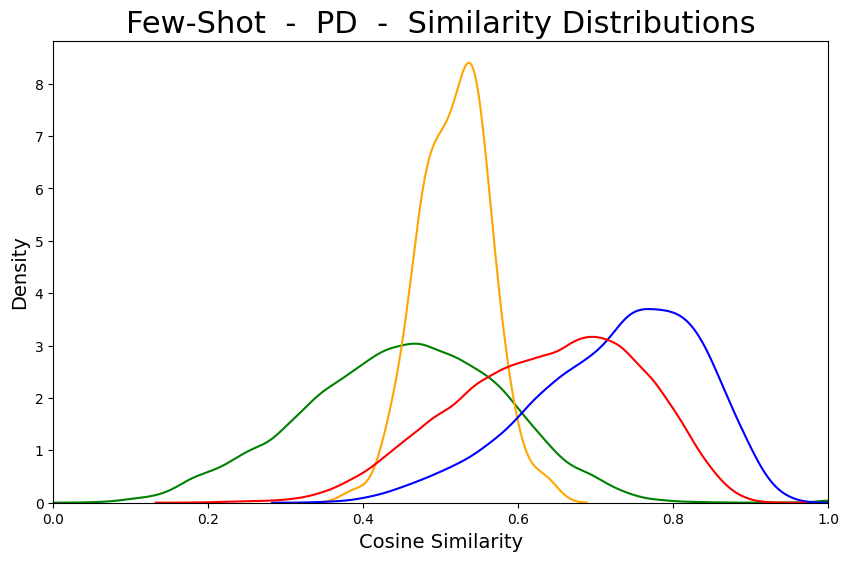

In [76]:
for party_i, party in enumerate(main_parties):
    plt.figure(figsize=(10, 6))
    sns.kdeplot(real_ads_party_similarities[party]['intra'], label='real_ads', color='green')
    sns.kdeplot(average_comparison[party_i], label='comparison with few_shots', color='orange')
    sns.kdeplot(party_similarities[party_i]['intra'], label='Intra-similarity', color='blue')
    sns.kdeplot(party_similarities[party_i]['inter'], label='Inter-similarity', color='red')
    # plt.title(f'Similarity Distribution - [3.1] GenAds - {main_parties[party_i]}')
    plt.title(f'Few-Shot  -  {main_parties_labels[party_i]}  -  Similarity Distributions', fontsize=22)
    plt.xlabel('Cosine Similarity', fontsize=14)
    plt.ylabel('Density', fontsize=14)
#   plt.legend(fontsize=14)
    plt.xlim(0, 1)
    plt.show()

## [3.1] Clustering

In [112]:
fs_ordered_embeddings = []
for party_i in range(n_main_parties):
    fs_ordered_embeddings.extend(combined_df['gen_text_embeddings'][party_i])

print(main_parties)
party_labels = np.concatenate([np.full(ads_per_party, i) for i in range(len(main_parties))])

# Step 1: Dimensionality Reduction
pca = PCA(n_components=2)  # Reduce to 2 components for visualization
reduced_embeddings = pca.fit_transform(fs_ordered_embeddings)

# Step 2: K-means Clustering
kmeans = KMeans(n_clusters=len(main_parties), random_state=42)
cluster_labels = kmeans.fit_predict(reduced_embeddings)


["['3POLO']", "['AVD']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]


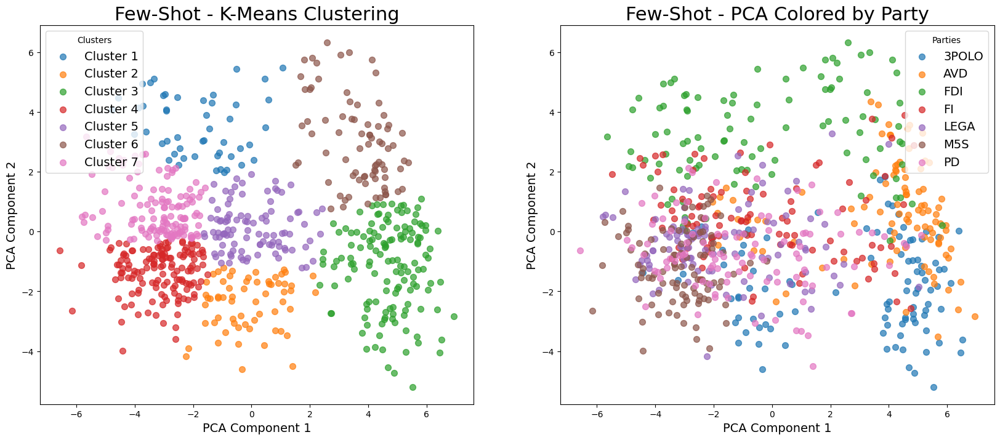

In [113]:
# Plotting both graphs side by side
fig, axs = plt.subplots(1, 2, figsize=(20, 8))

# Colors for plotting
colors = plt.get_cmap('tab10').colors

# Plot 1: K-Means Clusters

axs[0].set_title('Few-Shot - K-Means Clustering', fontsize=22)
axs[0].set_xlabel('PCA Component 1', fontsize=14)
axs[0].set_ylabel('PCA Component 2', fontsize=14)

for cluster_num in range(len(main_parties)):
    indices = cluster_labels == cluster_num
    axs[0].scatter(
        reduced_embeddings[indices, 0],
        reduced_embeddings[indices, 1],
        label=f'Cluster {cluster_num + 1}',
        color=colors[cluster_num % len(colors)],
        s=50,
        alpha=0.7
    )

axs[0].legend(title="Clusters", fontsize=14)

# Plot 2: Actual Party Labels

axs[1].set_title('Few-Shot - PCA Colored by Party', fontsize=22)
axs[1].set_xlabel('PCA Component 1', fontsize=14)
axs[1].set_ylabel('PCA Component 2', fontsize=14)

for i, party in enumerate(main_parties):
    indices = party_labels == i
    axs[1].scatter(
        reduced_embeddings[indices, 0],
        reduced_embeddings[indices, 1],
        label=main_parties_labels[i],
        color=colors[i % len(colors)],
        s=50,
        alpha=0.7
    )

axs[1].legend(title="Parties", fontsize=14)

plt.show()

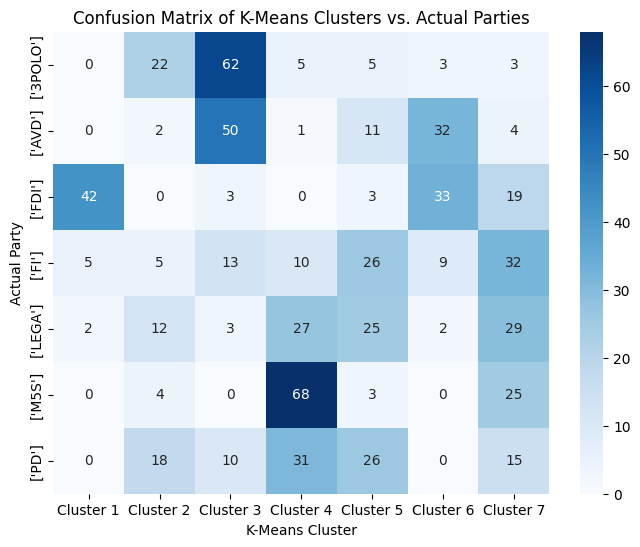

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Compute confusion matrix
cm = confusion_matrix(party_labels, cluster_labels)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=[f'Cluster {i+1}' for i in range(len(main_parties))],
            yticklabels=main_parties)
plt.xlabel('K-Means Cluster')
plt.ylabel('Actual Party')
plt.title('Confusion Matrix of K-Means Clusters vs. Actual Parties')
plt.show()


In [ ]:
# Step 1: Run K-means with more clusters on the new embeddings
num_clusters = len(main_parties) * 2
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
predicted_labels_more_clusters = kmeans.fit_predict(fs_ordered_embeddings)

In [ ]:
# Count occurrences of each party in each cluster
cluster_composition = {cluster_id: Counter(party_labels[predicted_labels_more_clusters == cluster_id])
                       for cluster_id in range(num_clusters)}

# Create absolute counts DataFrame and calculate percentages
cluster_df_absolute = pd.DataFrame.from_dict(cluster_composition, orient='index').fillna(0).astype(int)
cluster_df_absolute.columns = main_parties
cluster_df_percentage = (cluster_df_absolute.div(cluster_df_absolute.sum(axis=1), axis=0) * 100).round(1)

# Cast combined DataFrame to object type to store strings
combined_df = cluster_df_percentage.astype(object)

# Format each cell with percentage first, followed by absolute count, or "0%" if percentage is zero
for row in combined_df.index:
    for col in combined_df.columns:
        percentage = cluster_df_percentage.at[row, col]
        count = cluster_df_absolute.at[row, col]
        combined_df.at[row, col] = f"{percentage}% ({count})" if percentage != 0 else "0%"

# Calculate and add purity column to combined DataFrame
cluster_purity_percentage = cluster_df_percentage.max(axis=1)
cluster_purity_absolute = cluster_df_absolute.sum(axis=1)
combined_df['Purity (Total)'] = [f"{p}% ({a})" if p != 0 else "0%" for p, a in zip(cluster_purity_percentage.round(1), cluster_purity_absolute)]

combined_df = combined_df.sort_index()

# Display the combined DataFrame for clusters
display(combined_df)
print(f"\nAverage Cluster Purity: {cluster_purity_percentage.mean():.2f}%\n")

# Reversed Axis: Analyze distribution of ads per party across clusters
party_cluster_composition = {party_id: Counter(predicted_labels_more_clusters[party_labels == party_id])
                             for party_id in range(len(main_parties))}

# Create absolute counts DataFrame and calculate percentages for reversed axis
party_df_absolute = pd.DataFrame.from_dict(party_cluster_composition, orient='index').fillna(0).astype(int)
party_df_absolute.columns = [f'Cluster_{i}' for i in range(num_clusters)]
party_df_absolute.index = main_parties
party_df_percentage = (party_df_absolute.div(party_df_absolute.sum(axis=1), axis=0) * 100).round(1)

# Cast combined party DataFrame to object type to store strings
combined_party_df = party_df_percentage.astype(object)

# Format each cell with percentage first, followed by absolute count, or "0%" if percentage is zero
for row in combined_party_df.index:
    for col in combined_party_df.columns:
        percentage = party_df_percentage.at[row, col]
        count = party_df_absolute.at[row, col]
        combined_party_df.at[row, col] = f"{percentage}% ({count})" if percentage != 0 else "0%"

# Calculate and add purity column to combined party DataFrame
party_purity_percentage = party_df_percentage.max(axis=1)
party_purity_absolute = party_df_absolute.sum(axis=1)
combined_party_df['Purity (Total)'] = [f"{p}% ({a})" if p != 0 else "0%" for p, a in zip(party_purity_percentage.round(1), party_purity_absolute)]

# Display the combined DataFrame for parties
display(combined_party_df)
print(f"\nAverage Party Purity: {party_purity_percentage.mean():.2f}%")

,['3POLO'],['AVD'],['FDI'],['FI'],['LEGA'],['M5S'],['PD'],Purity (Total)
0,70.0% (14),25.0% (5),5.0% (1),0%,0%,0%,0%,70.0% (20)
1,0%,1.9% (1),0%,1.9% (1),13.0% (7),83.3% (45),0%,83.3% (54)
2,0%,10.6% (5),2.1% (1),12.8% (6),4.3% (2),17.0% (8),53.2% (25),53.2% (47)
3,25.8% (8),35.5% (11),0%,0%,16.1% (5),19.4% (6),3.2% (1),35.5% (31)
4,0%,0%,0%,70.4% (19),7.4% (2),11.1% (3),11.1% (3),70.4% (27)
5,1.6% (1),1.6% (1),6.6% (4),1.6% (1),85.2% (52),3.3% (2),0%,85.2% (61)
6,95.5% (21),0%,0%,4.5% (1),0%,0%,0%,95.5% (22)
7,51.7% (31),43.3% (26),0%,0%,3.3% (2),1.7% (1),0%,51.7% (60)
8,1.4% (1),4.3% (3),0%,82.9% (58),1.4% (1),4.3% (3),5.7% (4),82.9% (70)
9,0%,0%,100.0% (44),0%,0%,0%,0%,100.0% (44)



Average Cluster Purity: 65.55%



,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,Cluster_10,Cluster_11,Cluster_12,Cluster_13,Purity (Total)
['3POLO'],1.0% (1),57.0% (57),25.0% (25),3.0% (3),8.0% (8),4.0% (4),2.0% (2),0%,0%,0%,0%,0%,0%,0%,57.0% (100)
['AVD'],8.0% (8),0%,0%,0%,6.0% (6),1.0% (1),17.0% (17),21.0% (21),1.0% (1),1.0% (1),0%,31.0% (31),14.0% (14),0%,31.0% (100)
['FDI'],11.0% (11),6.0% (6),5.0% (5),0%,5.0% (5),3.0% (3),18.0% (18),0%,19.0% (19),1.0% (1),1.0% (1),26.0% (26),5.0% (5),0%,26.0% (100)
['FI'],5.0% (5),2.0% (2),2.0% (2),2.0% (2),15.0% (15),1.0% (1),7.0% (7),0%,5.0% (5),52.0% (52),7.0% (7),2.0% (2),0%,0%,52.0% (100)
['LEGA'],6.0% (6),1.0% (1),8.0% (8),3.0% (3),0%,3.0% (3),7.0% (7),0%,24.0% (24),2.0% (2),45.0% (45),1.0% (1),0%,0%,45.0% (100)
['M5S'],0%,1.0% (1),6.0% (6),19.0% (19),0%,58.0% (58),4.0% (4),1.0% (1),9.0% (9),1.0% (1),1.0% (1),0%,0%,0%,58.0% (100)
['PD'],0%,0%,1.0% (1),0%,12.0% (12),0%,0%,0%,38.0% (38),4.0% (4),0%,0%,1.0% (1),44.0% (44),44.0% (100)



Average Party Purity: 44.71%


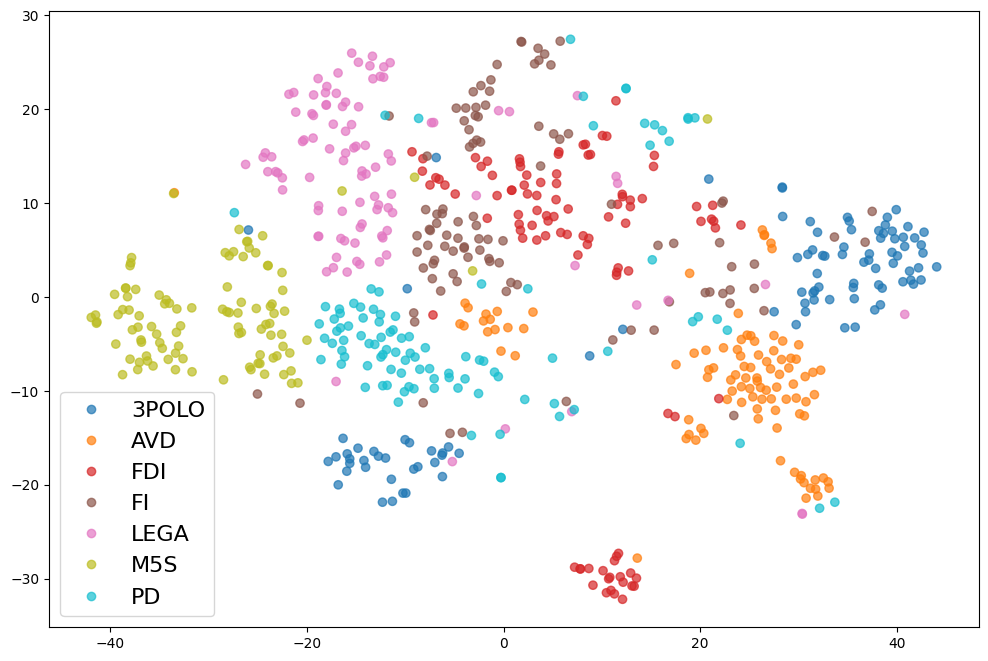

In [103]:
fs_ordered_embeddings = normalize(fs_ordered_embeddings, norm='l2')

# Apply t-SNE
tsne_embeddings = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(fs_ordered_embeddings)

# Plot t-SNE results
plt.figure(figsize=(12, 8))
scatter = plt.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], c=party_labels, cmap='tab10', alpha=0.7)
plt.legend(handles=scatter.legend_elements()[0], labels=main_parties_labels, fontsize=16)
# plt.title('t-SNE Visualization of Ad Embeddings')
plt.show()


# [4] Zero-shot with party program

## [4] Ads Generation and Embeddings Creation

In [ ]:
if not import_embeddings:
    print(main_parties)

    # Initialize an empty list to store row data
    rows_data = []

    n_plain_texts = 111
    total_iterations = n_main_parties * (n_plain_texts)  # x for plain text + number of topics

    # Initialize progress bar
    with tqdm(total=total_iterations, desc="Processing pages") as pbar:
        for party in main_parties:
            # print(f"\n{party}")

            # Check and wait for rate limit
            check_rate_limit()


            # Create a row dictionary with initial data
            row_dict = {
                'party': party,
            }

            bullet_points_text = electoral_programs[party]['bullet_points']
            bullet_points = bullet_points_text.strip().split('\n')
            bullet_point_permutations = list(permutations(bullet_points))
            # print(f"Number of permutations: {len(bullet_point_permutations)}")
            bullet_point_permutations = random.sample(bullet_point_permutations, n_plain_texts)

            responses = []

            # Generate plain text and topic-specific text
            for i in range(n_plain_texts):

                prompt = generate_political_prompt_zero_shot(party, '\n'.join(bullet_point_permutations[i]))

                # print("PROMPT:\n" +prompt)

                while True:
                    try:
                        response = client.text_generation(prompt, max_new_tokens=256)
                        break  # Exit the loop if successful
                    except Exception:
                        print(f"Rate limit reached.\n{len(call_times)} Calls.\nWaiting for 60 seconds...")
                        print(Exception)
                        time.sleep(60)

                # print("Generated ads:\n" + response + "\n ---")
                responses.append(response)

                # Record the call time
                call_times.append(datetime.now())

                pbar.update(1)

            # Add the completed row data to the list
            row_dict['gen_plain_list'] = responses
            rows_data.append(row_dict)

    # Create DataFrame from the list of dictionaries
    zero_shot_gen_text_df = pd.DataFrame(rows_data)

    print("\nSaving results to CSV...")
    # Save the results
    zero_shot_gen_text_df.to_csv(f'data/zero_shot_generated_ads.csv', index=False)
    print("Process completed successfully!")
    zero_shot_gen_text_df

In [ ]:
if not import_embeddings:
    for s in zero_shot_gen_text_df.iloc[0]['gen_plain_list']:
        print("\n<START>",s,"<END>")

In [ ]:
if not import_embeddings:

    # Load the Sentence BERT model
    model = SentenceTransformer('nickprock/sentence-bert-base-italian-xxl-uncased')

    # Initialize list to hold embeddings
    all_gen_text_embeddings = []

    # Loop through each row in zero_shot_gen_text_df
    print("Processing embeddings for generated text...")

    for i in tqdm(range(len(zero_shot_gen_text_df)), desc="Embedding rows"):

        # Extract generated text for this row
        gen_text_list = zero_shot_gen_text_df['gen_plain_list'][i]  # List of 100 strings

        # Embeddings for generated text (list of 100 strings)
        gen_text_embeddings = []
        for sentence in gen_text_list:
            if isinstance(sentence, float) and np.isnan(sentence):
                embedding = model.encode("NaN")
            else:
                embedding = model.encode(sentence)
            gen_text_embeddings.append(embedding)

        # Append to the global list (no flattening for this one)
        all_gen_text_embeddings.append(gen_text_embeddings)

    # Save the generated text embeddings to a CSV file
    print("Saving embeddings to a single CSV file...")

    # Create a DataFrame with the generated text embeddings
    zs_gen_text_embeddings_df = pd.DataFrame({
        'gen_text_embeddings': ['|'.join([','.join(map(str, embedding)) for embedding in gen_text_list]) for gen_text_list in all_gen_text_embeddings]
    })

    # Save the DataFrame to a CSV file
    zs_gen_text_embeddings_df.to_csv('data/zero_shot_gen_embeddings.csv', index=False)

    print("Process completed successfully!")

### {S} [4] Import

In [ ]:
if import_embeddings:

    ads_per_party = 111

    # Load the CSV file
    zs_gen_text_embeddings_df = pd.read_csv('data/zero_shot_gen_embeddings.csv')

    # Convert the 'gen_text_embeddings' column back to lists of NumPy arrays
    zs_gen_text_embeddings_df['gen_text_embeddings'] = zs_gen_text_embeddings_df['gen_text_embeddings'].apply(
        lambda x: [np.array(list(map(float, embedding.split(',')))) for embedding in x.split('|')]
    )

    # Add the 'party' column from the main_parties list
    zs_gen_text_embeddings_df['party'] = main_parties

    # Reorder columns to place 'party' first
    zs_gen_text_embeddings_df = zs_gen_text_embeddings_df[['party', 'gen_text_embeddings']]

    zs_gen_text_embeddings_df

## [4] Similarity

["['3POLO']", "['AVD']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]


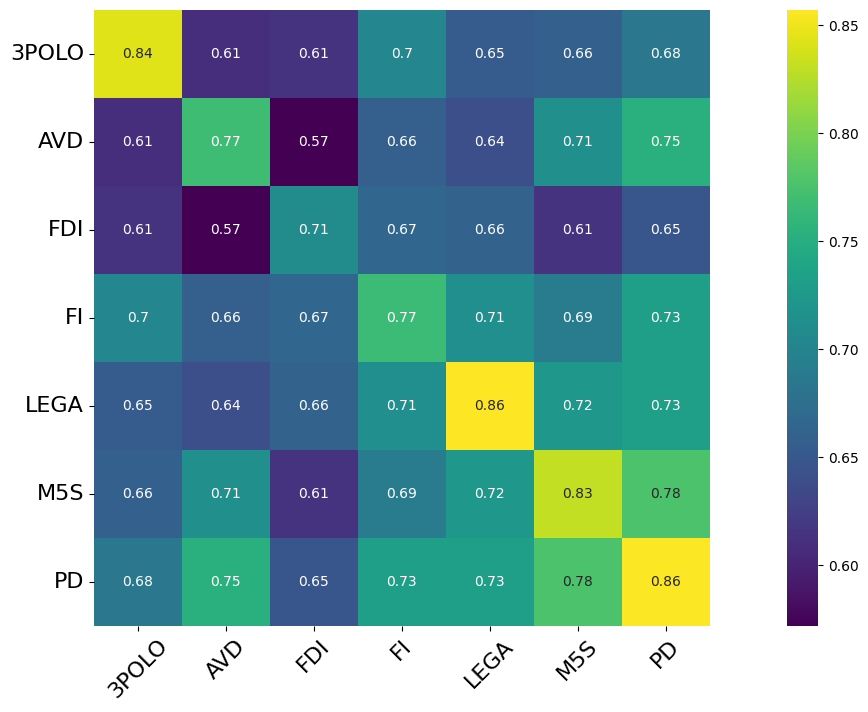

In [78]:
zs_gen_ads_embeddings = []

for party_i in range(n_main_parties):
    zs_gen_ads_embeddings.extend(zs_gen_text_embeddings_df['gen_text_embeddings'][party_i])

zs_gen_ads_embeddings_matrix = cosine_similarity(zs_gen_ads_embeddings)

print(main_parties)

plt.figure(figsize=(20, 8))

block_size = ads_per_party
# np.fill_diagonal(zs_gen_ads_embeddings_matrix, 0)
aggregated_matrix = aggregate_matrix(zs_gen_ads_embeddings_matrix, block_size)

# Plotting the aggregated similarity matrix
ax = sns.heatmap(aggregated_matrix, cmap='viridis', square=True, annot=True)
ax.set_xticklabels(main_parties_labels, rotation=45)
ax.set_yticklabels(main_parties_labels, rotation=0)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# plt.title('Aggregated Similarity for zero_shot_gen_ads matrix)'.format(block_size))
plt.show()


["['3POLO']", "['AVD']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]
[110, 221, 332, 443, 554, 665]


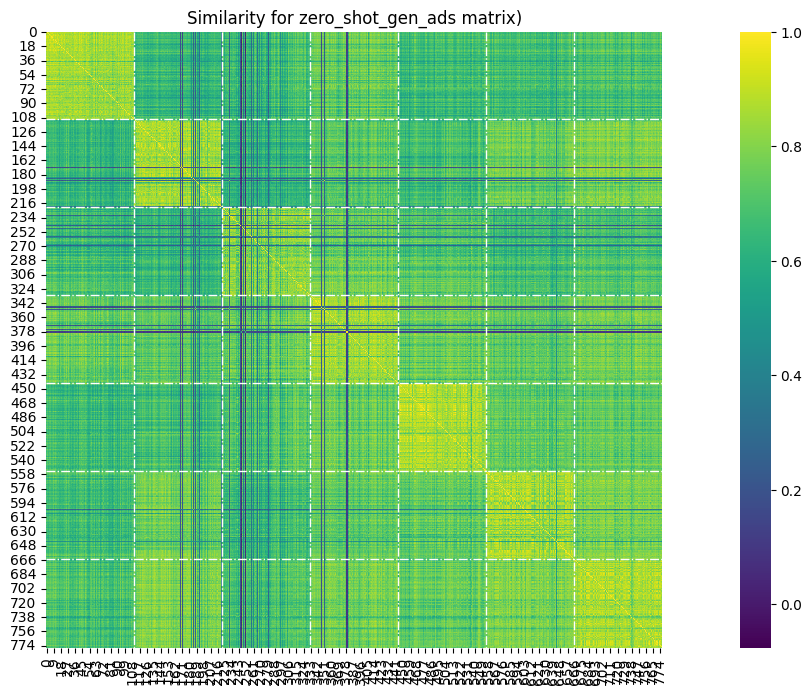

In [79]:
print(main_parties)

plt.figure(figsize=(20, 8))

# Plotting the aggregated similarity matrix
ax = sns.heatmap(zs_gen_ads_embeddings_matrix, cmap='viridis', square=True)

block_borders = [1, 2, 3, 4, 5, 6]
block_borders = [x * ads_per_party - 1 for x in block_borders]
print(block_borders)

for value in block_borders:
    value = value
    plt.vlines(x=value, ymin=0, ymax=zs_gen_ads_embeddings_matrix.shape[0], color='white', linestyle='-.', linewidth=1)
    plt.hlines(y=value, xmin=0, xmax=zs_gen_ads_embeddings_matrix.shape[1], color='white', linestyle='-.', linewidth=1)

plt.title('Similarity for zero_shot_gen_ads matrix)'.format(block_size))
plt.show()

["['3POLO']", "['AVD']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]
[110, 221, 332, 443, 554, 665]


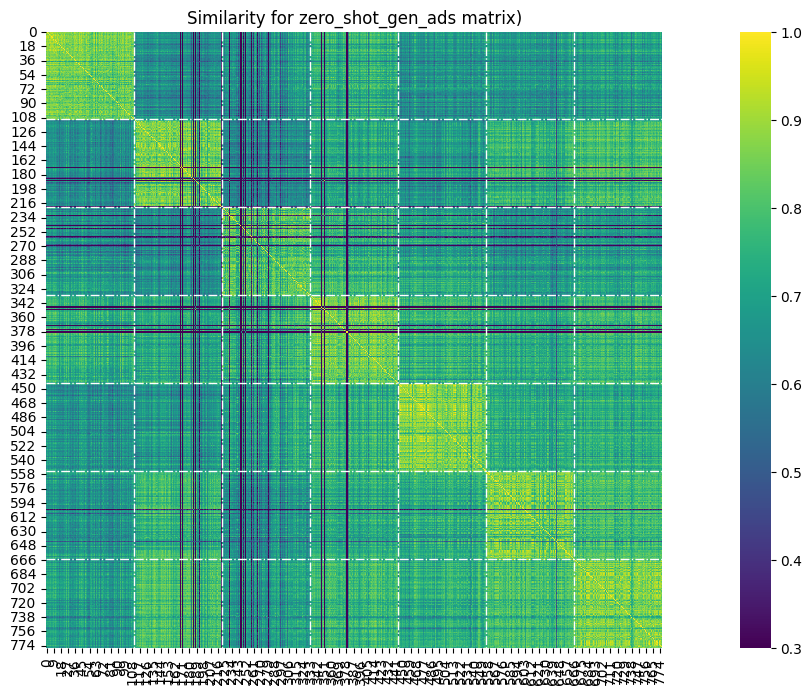

In [80]:
print(main_parties)

plt.figure(figsize=(20, 8))

# Plotting the aggregated similarity matrix
sns.heatmap(zs_gen_ads_embeddings_matrix, cmap='viridis', square=True, vmin=0.3)

block_borders = [1, 2, 3, 4, 5, 6]
block_borders = [x * ads_per_party - 1 for x in block_borders]
print(block_borders)

for value in block_borders:
    value = value
    plt.vlines(x=value, ymin=0, ymax=zs_gen_ads_embeddings_matrix.shape[0], color='white', linestyle='-.', linewidth=1)
    plt.hlines(y=value, xmin=0, xmax=zs_gen_ads_embeddings_matrix.shape[1], color='white', linestyle='-.', linewidth=1)

plt.title('Similarity for zero_shot_gen_ads matrix)'.format(block_size))
plt.show()


In [81]:

# plt.title('Clustermap of ZS Gen Ads Embeddings')


# # Compute the pairwise cosine distances
# distance_vector = pdist(zs_gen_ads_embeddings, metric='cosine')

# # Compute the linkage matrix
# linkage_matrix = linkage(distance_vector, method='average')

# # Convert the condensed distance vector to a square distance matrix
# distance_matrix = squareform(distance_vector)

# # Generate the clustermap
# sns.set(style='white')

# g = sns.clustermap(
#     distance_matrix,
#     row_linkage=linkage_matrix,
#     col_linkage=linkage_matrix,
#     cmap='viridis',
#     figsize=(10, 10),
#     annot=False,
#     square=True,
#     # row_cluster=False,
#     dendrogram_ratio=(0.1, 0.1),
#     vmin=0, vmax=0.6,
#     cbar_pos=(0.02, 0.8, 0.05, 0.18)
# )

# # Set the title
# g.fig.suptitle('Clustermap of ZS Gen Ads Embeddings', fontsize=16)
# plt.subplots_adjust(top=0.9)

# plt.show()

# print("Distance matrix stats:")
# print("Min:", np.min(distance_matrix))
# print("Max:", np.max(distance_matrix))
# print("Mean:", np.mean(distance_matrix))
# print("Std Dev:", np.std(distance_matrix))

# plt.figure(figsize=(8, 6))
# plt.hist(distance_vector, bins=50, color='skyblue', edgecolor='black')
# plt.title('Histogram of Pairwise Distances')
# plt.xlabel('Distance')
# plt.ylabel('Frequency')
# plt.show()


In [82]:
# # Generate the clustermap
# g = sns.clustermap(
#     aggregated_matrix,
#     cmap='viridis',
#     metric='euclidean',        # Distance metric for clustering
#     method='average',          # Clustering method
#     figsize=(8, 6),          # Adjust figure size as needed
#     cbar_pos=None,                # No colorbar
#     dendrogram_ratio=(.2, 0), # Adjust dendrogram size
#     xticklabels=main_parties,        # Labels for columns
#     yticklabels=main_parties,        # Labels for rows
#     annot=True,                # Annotate the heatmap cells with values
#     fmt=".2f",                 # Format for annotations
#     col_cluster=False          # Disable clustering on columns
# )

# # Customize the plot labels
# plt.setp(g.ax_heatmap.get_xticklabels(), rotation=45, ha='right')
# plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0)

# plt.title('Clustermap of Aggregated Similarity zero_shot_gen_ads Matrix')

# plt.show()


### intra/inter similarities

In [83]:
block_borders = [0, 1, 2, 3, 4, 5, 6, 7]
block_borders = [x * ads_per_party for x in block_borders]

gen_embeddings = []
for party_i in range(n_main_parties):
    gen_embeddings.extend(zs_gen_text_embeddings_df['gen_text_embeddings'][party_i])

gen_embeddings_matrix = cosine_similarity(gen_embeddings)

# Initialize dictionary to store similarities
party_similarities = {}

for i in range(n_main_parties):
  party_similarities[i] = {
      'intra': [],
      'inter': []
  }
  for j in range(n_main_parties):
    # Extract the block (i, j)
    start_row = block_borders[i]
    end_row = block_borders[i + 1]
    start_col = block_borders[j]
    end_col = block_borders[j + 1]

    block = gen_embeddings_matrix[start_row:end_row, start_col:end_col]
    # print(f"parties: i{main_parties[i]} - j{main_parties[j]}")
    # print(f"Block {i}, {j}: {block.shape}, {start_row}:{end_row}, {start_col}:{end_col}")

    if i == j:
      # Intra-similarity (within the same block)
      party_similarities[i]['intra'].extend(block[np.triu_indices(ads_per_party, k=1)])
    else:
      # Inter-similarity (between different blocks)
      party_similarities[i]['inter'].extend(block.flatten())

# Convert to NumPy arrays for further analysis within each block
for i in range(n_main_parties):
    party_similarities[i]['intra'] = np.array(party_similarities[i]['intra'])
    party_similarities[i]['inter'] = np.array(party_similarities[i]['inter'])
    # print(f"Party {party} - Intra: {len(party_similarities[party]['intra'])}, Inter: {len(party_similarities[party]['inter'])}")

print(f"party_similarities: {party_similarities.keys()}, {party_similarities[0].keys()}")

party_similarities: dict_keys([0, 1, 2, 3, 4, 5, 6]), dict_keys(['intra', 'inter'])


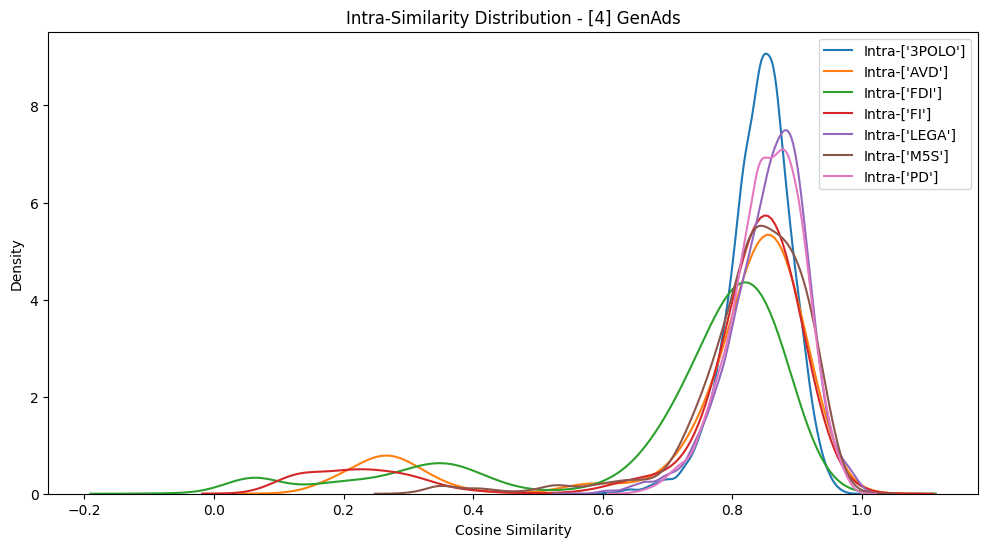

In [84]:
plt.figure(figsize=(12, 6))
for party_i in range(n_main_parties):
  sns.kdeplot(party_similarities[party_i]['intra'], label=f'Intra-{main_parties[party_i]}')

plt.title('Intra-Similarity Distribution - [4] GenAds')
plt.xlabel('Cosine Similarity')
plt.ylabel('Density')
plt.legend()
plt.show()

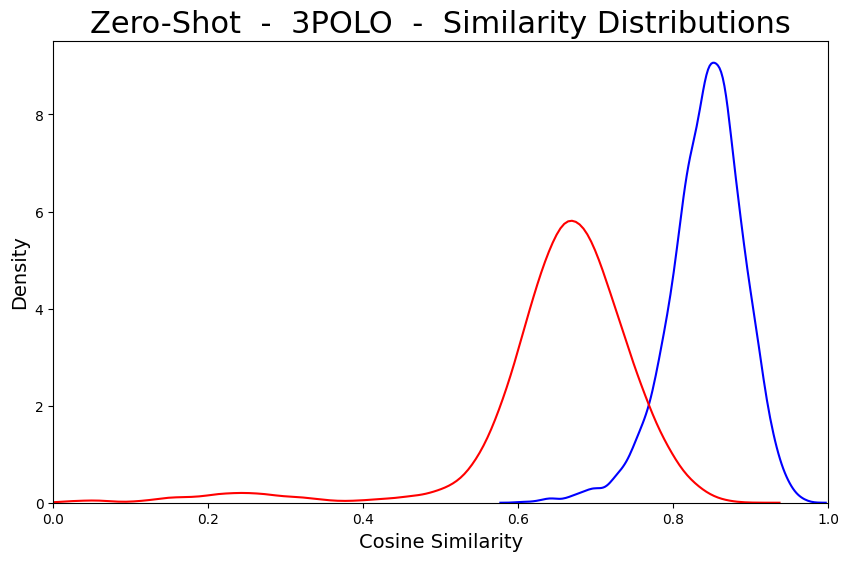

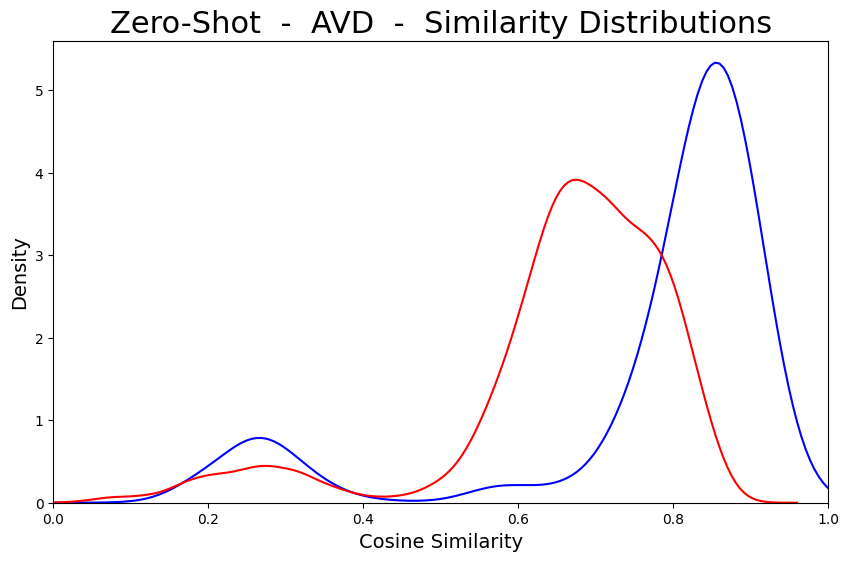

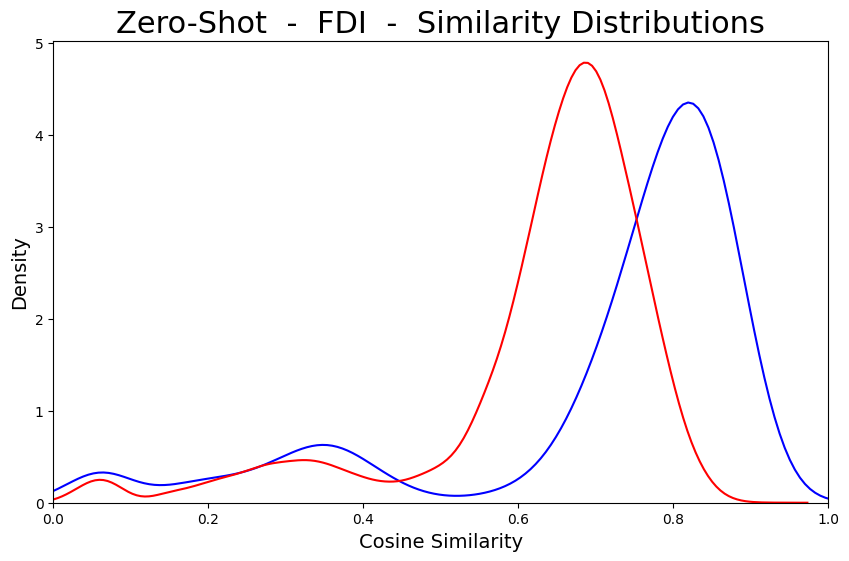

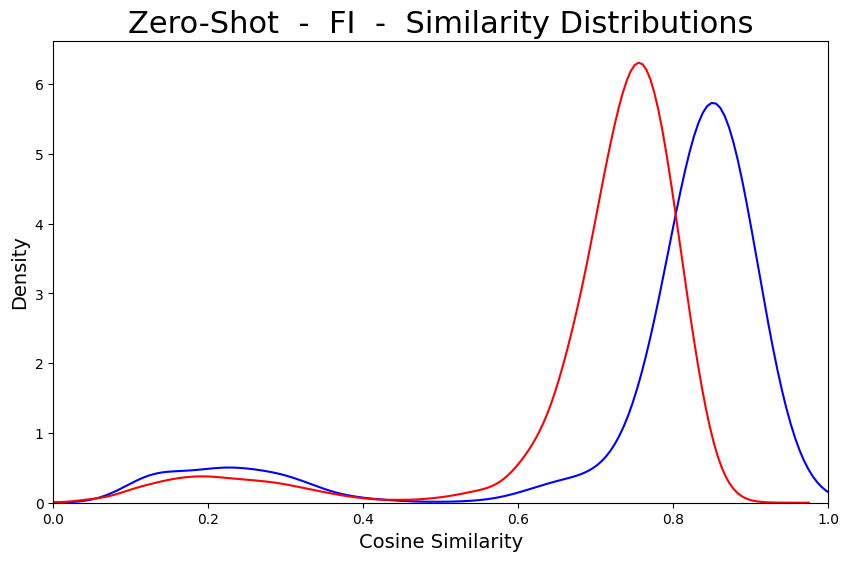

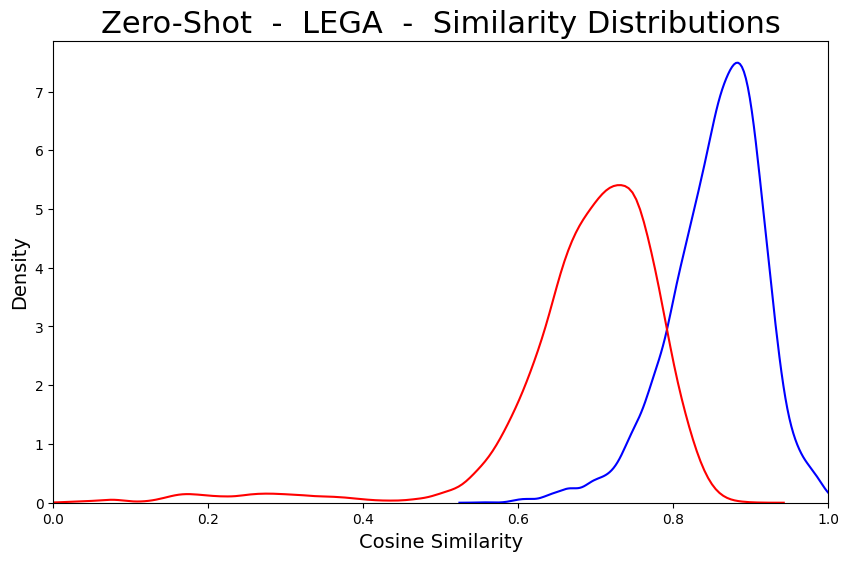

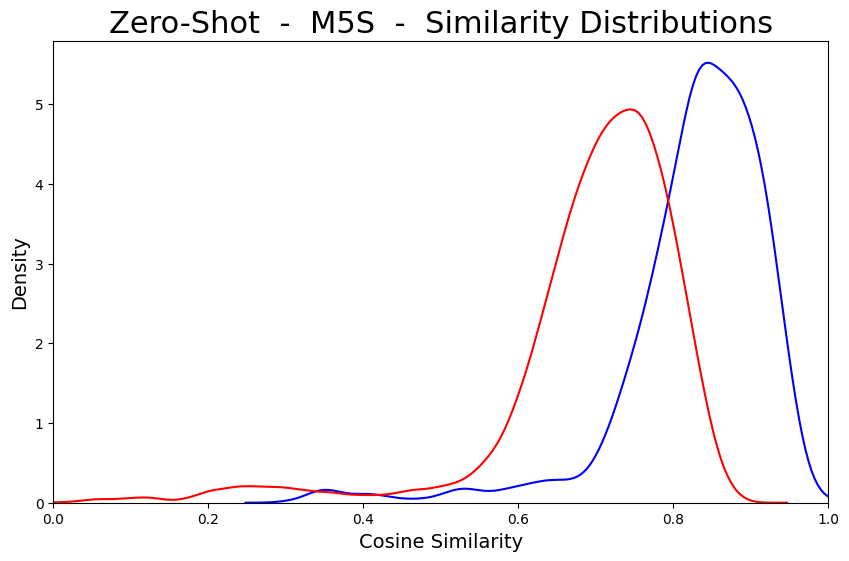

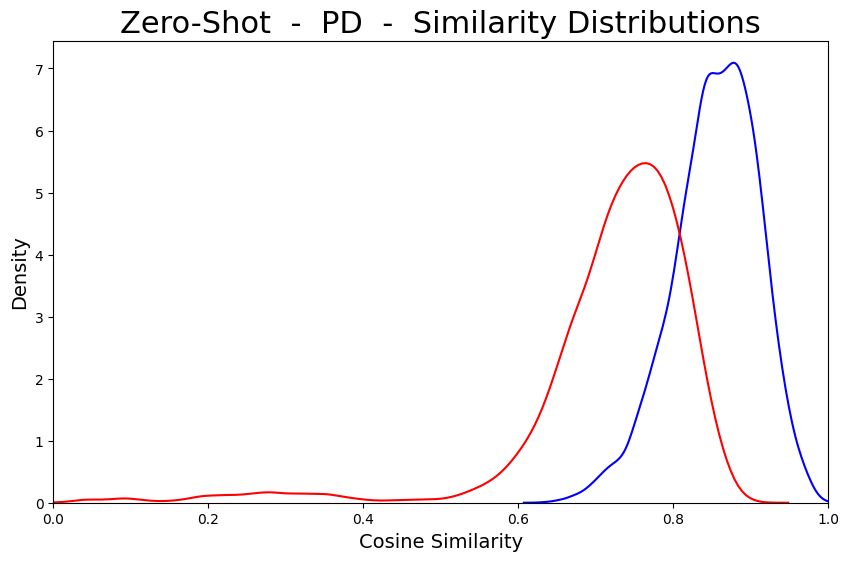

In [85]:
for party_i in range(n_main_parties):
    plt.figure(figsize=(10, 6))
    sns.kdeplot(party_similarities[party_i]['intra'], label='Intra-similarity', color='blue')
    sns.kdeplot(party_similarities[party_i]['inter'], label='Inter-similarity', color='red')
    # plt.title(f'Similarity Distribution - [4] GenAds - {main_parties[party_i]}')
    plt.title(f'Zero-Shot  -  {main_parties_labels[party_i]}  -  Similarity Distributions', fontsize=22)
    plt.xlabel('Cosine Similarity', fontsize=14)
    plt.ylabel('Density', fontsize=14)
#   plt.legend(fontsize=14)
    plt.xlim(0, 1)
    plt.show()

## [4] Clustering

In [116]:
zs_gen_ads_embeddings = []

for party_i in range(n_main_parties):
    zs_gen_ads_embeddings.extend(zs_gen_text_embeddings_df['gen_text_embeddings'][party_i])

print(main_parties)
party_labels = np.concatenate([np.full(ads_per_party, i) for i in range(len(main_parties))])

# Step 1: Dimensionality Reduction
pca = PCA(n_components=2)  # Reduce to 2 components for visualization
reduced_embeddings = pca.fit_transform(zs_gen_ads_embeddings)

# Step 2: K-means Clustering
kmeans = KMeans(n_clusters=len(main_parties), random_state=42)
cluster_labels = kmeans.fit_predict(reduced_embeddings)


["['3POLO']", "['AVD']", "['FDI']", "['FI']", "['LEGA']", "['M5S']", "['PD']"]


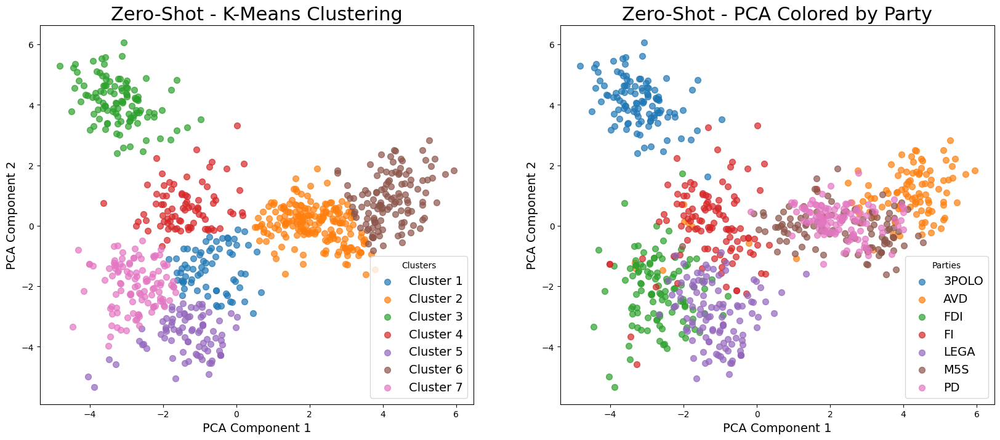

In [117]:
# Plotting both graphs side by side
fig, axs = plt.subplots(1, 2, figsize=(20, 8))

# Colors for plotting
colors = plt.get_cmap('tab10').colors

# Plot 1: K-Means Clusters

axs[0].set_title('Zero-Shot - K-Means Clustering', fontsize=22)
axs[0].set_xlabel('PCA Component 1', fontsize=14)
axs[0].set_ylabel('PCA Component 2', fontsize=14)

for cluster_num in range(len(main_parties)):
    indices = cluster_labels == cluster_num
    axs[0].scatter(
        reduced_embeddings[indices, 0],
        reduced_embeddings[indices, 1],
        label=f'Cluster {cluster_num + 1}',
        color=colors[cluster_num % len(colors)],
        s=50,
        alpha=0.7
    )

axs[0].legend(title="Clusters", fontsize=14)

# Plot 2: Actual Party Labels

axs[1].set_title('Zero-Shot - PCA Colored by Party', fontsize=22)
axs[1].set_xlabel('PCA Component 1', fontsize=14)
axs[1].set_ylabel('PCA Component 2', fontsize=14)

for i, party in enumerate(main_parties):
    indices = party_labels == i
    axs[1].scatter(
        reduced_embeddings[indices, 0],
        reduced_embeddings[indices, 1],
        label=main_parties_labels[i],
        color=colors[i % len(colors)],
        s=50,
        alpha=0.7
    )

axs[1].legend(title="Parties", fontsize=14)

plt.show()

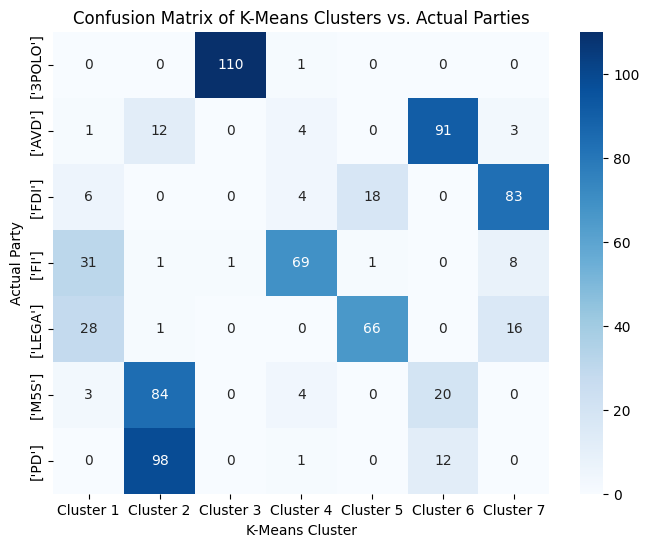

In [ ]:
# Compute confusion matrix
cm = confusion_matrix(party_labels, cluster_labels)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=[f'Cluster {i+1}' for i in range(len(main_parties))],
            yticklabels=main_parties)
plt.xlabel('K-Means Cluster')
plt.ylabel('Actual Party')
plt.title('Confusion Matrix of K-Means Clusters vs. Actual Parties')
plt.show()


In [ ]:
# Step 1: Run K-means with more clusters on the new embeddings
num_clusters = len(main_parties) * 2
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
predicted_labels_more_clusters = kmeans.fit_predict(zs_gen_ads_embeddings)

In [ ]:
# Count occurrences of each party in each cluster
cluster_composition = {cluster_id: Counter(party_labels[predicted_labels_more_clusters == cluster_id])
                       for cluster_id in range(num_clusters)}

# Create absolute counts DataFrame and calculate percentages
cluster_df_absolute = pd.DataFrame.from_dict(cluster_composition, orient='index').fillna(0).astype(int)
cluster_df_absolute.columns = main_parties
cluster_df_percentage = (cluster_df_absolute.div(cluster_df_absolute.sum(axis=1), axis=0) * 100).round(1)

# Cast combined DataFrame to object type to store strings
combined_df = cluster_df_percentage.astype(object)

# Format each cell with percentage first, followed by absolute count, or "0%" if percentage is zero
for row in combined_df.index:
    for col in combined_df.columns:
        percentage = cluster_df_percentage.at[row, col]
        count = cluster_df_absolute.at[row, col]
        combined_df.at[row, col] = f"{percentage}% ({count})" if percentage != 0 else "0%"

# Calculate and add purity column to combined DataFrame
cluster_purity_percentage = cluster_df_percentage.max(axis=1)
cluster_purity_absolute = cluster_df_absolute.sum(axis=1)
combined_df['Purity (Total)'] = [f"{p}% ({a})" if p != 0 else "0%" for p, a in zip(cluster_purity_percentage.round(1), cluster_purity_absolute)]

combined_df = combined_df.sort_index()

# Display the combined DataFrame for clusters
display(combined_df)
print(f"\nAverage Cluster Purity: {cluster_purity_percentage.mean():.2f}%\n")

# Reversed Axis: Analyze distribution of ads per party across clusters
party_cluster_composition = {party_id: Counter(predicted_labels_more_clusters[party_labels == party_id])
                             for party_id in range(len(main_parties))}

# Create absolute counts DataFrame and calculate percentages for reversed axis
party_df_absolute = pd.DataFrame.from_dict(party_cluster_composition, orient='index').fillna(0).astype(int)
party_df_absolute.columns = [f'Cluster_{i}' for i in range(num_clusters)]
party_df_absolute.index = main_parties
party_df_percentage = (party_df_absolute.div(party_df_absolute.sum(axis=1), axis=0) * 100).round(1)

# Cast combined party DataFrame to object type to store strings
combined_party_df = party_df_percentage.astype(object)

# Format each cell with percentage first, followed by absolute count, or "0%" if percentage is zero
for row in combined_party_df.index:
    for col in combined_party_df.columns:
        percentage = party_df_percentage.at[row, col]
        count = party_df_absolute.at[row, col]
        combined_party_df.at[row, col] = f"{percentage}% ({count})" if percentage != 0 else "0%"

# Calculate and add purity column to combined party DataFrame
party_purity_percentage = party_df_percentage.max(axis=1)
party_purity_absolute = party_df_absolute.sum(axis=1)
combined_party_df['Purity (Total)'] = [f"{p}% ({a})" if p != 0 else "0%" for p, a in zip(party_purity_percentage.round(1), party_purity_absolute)]

# Display the combined DataFrame for parties
display(combined_party_df)
print(f"\nAverage Party Purity: {party_purity_percentage.mean():.2f}%")

,['3POLO'],['AVD'],['FDI'],['FI'],['LEGA'],['M5S'],['PD'],Purity (Total)
0,40.0% (6),46.7% (7),13.3% (2),0%,0%,0%,0%,46.7% (15)
1,1.9% (1),0%,0%,98.1% (53),0%,0%,0%,98.1% (54)
2,0%,1.1% (1),0%,0%,98.9% (86),0%,0%,98.9% (87)
3,0%,0%,0%,0%,0%,100.0% (60),0%,100.0% (60)
4,3.3% (2),0%,3.3% (2),93.4% (57),0%,0%,0%,93.4% (61)
5,100.0% (99),0%,0%,0%,0%,0%,0%,100.0% (99)
6,0%,60.7% (34),3.6% (2),0%,32.1% (18),1.8% (1),1.8% (1),60.7% (56)
7,1.9% (1),0%,96.3% (52),1.9% (1),0%,0%,0%,96.3% (54)
8,0%,0%,0%,0%,0%,0%,100.0% (110),100.0% (110)
9,0%,100.0% (66),0%,0%,0%,0%,0%,100.0% (66)



Average Cluster Purity: 86.19%



,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,Cluster_10,Cluster_11,Cluster_12,Cluster_13,Purity (Total)
['3POLO'],99.1% (110),0.9% (1),0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,99.1% (111)
['AVD'],0%,30.6% (34),0%,0%,6.3% (7),0.9% (1),0%,0%,59.5% (66),1.8% (2),0.9% (1),0%,0%,0%,59.5% (111)
['FDI'],0%,16.2% (18),0%,0%,0%,4.5% (5),0%,0%,0%,1.8% (2),77.5% (86),0%,0%,0%,77.5% (111)
['FI'],0%,0.9% (1),0%,0%,0%,0%,0%,0%,0%,0%,0%,45.0% (50),54.1% (60),0%,54.1% (111)
['LEGA'],0%,1.8% (2),0%,1.8% (2),1.8% (2),0%,46.8% (52),0%,0%,0%,0%,0%,0%,47.7% (53),47.7% (111)
['M5S'],0%,0%,89.2% (99),1.8% (2),5.4% (6),1.8% (2),0.9% (1),0.9% (1),0%,0%,0%,0%,0%,0%,89.2% (111)
['PD'],0%,0%,0%,51.4% (57),0%,0%,0.9% (1),47.7% (53),0%,0%,0%,0%,0%,0%,51.4% (111)



Average Party Purity: 68.36%


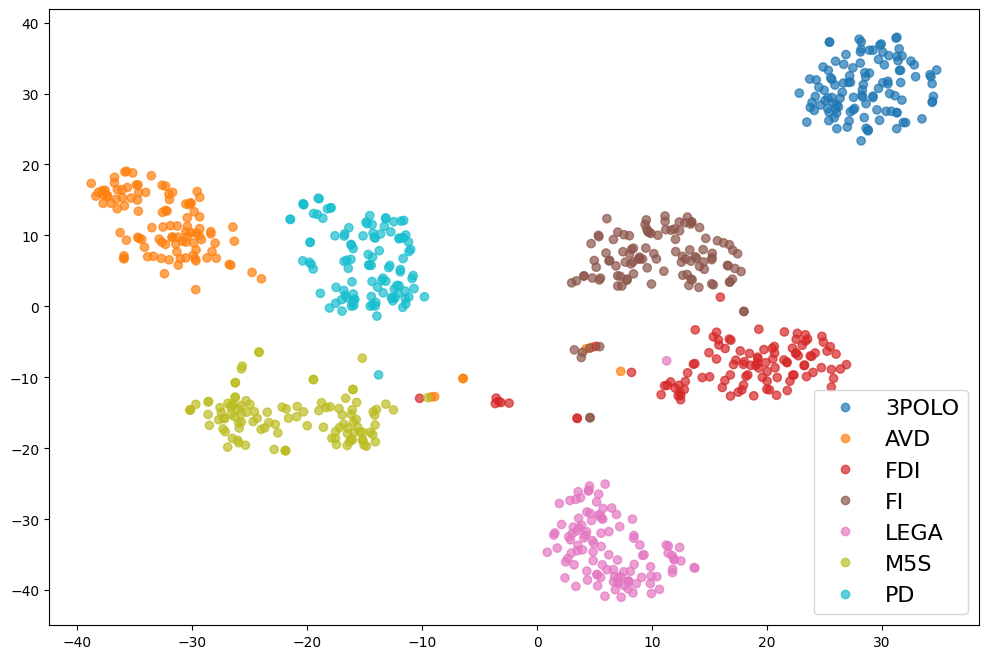

In [118]:
zs_gen_ads_embeddings = normalize(zs_gen_ads_embeddings, norm='l2')

# Apply t-SNE
tsne_embeddings = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(zs_gen_ads_embeddings)

# Plot t-SNE results
plt.figure(figsize=(12, 8))
scatter = plt.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], c=party_labels, cmap='tab10', alpha=0.7)
plt.legend(handles=scatter.legend_elements()[0], labels=main_parties_labels, fontsize=16)
# plt.title('t-SNE Visualization of Ad Embeddings')
plt.show()


# bert_score

## Calculation

In [ ]:
# # Import the CSV file
# zero_shot_gen_text_df = pd.read_csv('data/zero_shot_generated_ads.csv')
# # Convert the 'top_ads' column to lists of strings
# zero_shot_gen_text_df['gen_plain_list'] = zero_shot_gen_text_df['gen_plain_list'].apply(eval)

# zs_ordered_text = [text for sublist in zero_shot_gen_text_df['gen_plain_list'] for text in sublist]


# # Load BERTScore
# bertscore = load("bertscore")

# ordered_text = zs_ordered_text

# # Initialize a matrix to store F1 scores
# f1_matrix = np.zeros((len(ordered_text), len(ordered_text)))
# print(len(ordered_text)*len(ordered_text))

In [ ]:
# # Compute pairwise BERTScore F1 scores
# for i in tqdm(range(len(ordered_text)), desc="Computing BERTScore F1 i"):
#     for j in tqdm(range(i, len(ordered_text)), desc="Computing BERTScore F1 j"):
#         if i == j:
#             f1_matrix[i, j] = 1  # Similarity of an ad with itself
#         else:
#             # Compute BERTScore for each pair
#             results = bertscore.compute(predictions=[ordered_text[i]], references=[ordered_text[j]], lang="it")
#             f1_score = results['f1'][0]  # Extract F1 score
#             f1_matrix[i, j] = f1_score
#             f1_matrix[j, i] = f1_score  # Symmetric matrix


## Real Ads

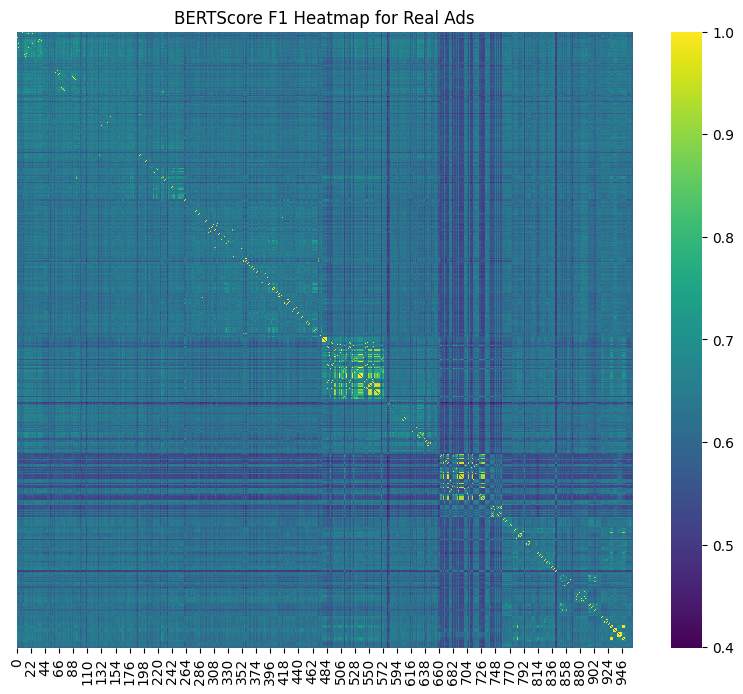

In [ ]:
# Load the bert_f1_matrix from the file
bert_f1_matrix = np.load('data/f1_matrix_real-ads.npy')
np.fill_diagonal(bert_f1_matrix, np.mean(bert_f1_matrix))

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(bert_f1_matrix, cmap="viridis", yticklabels=False, square=True)
plt.title("BERTScore F1 Heatmap for Real Ads")
plt.show()

### intra/inter similarities

In [ ]:
bert_f1_matrix = np.load('data/f1_matrix_real-ads.npy')

cumulative_values = [99, 195, 280, 516, 603, 699, 963]
block_borders = [x for x in cumulative_values]
block_borders.insert(0, 0)  # Insert 0 at the beginning

ads_per_party = main_pages_data['party'].value_counts(sort=False).sort_index().tolist()

# Initialize dictionary to store similarities
party_similarities = {}

for i in range(n_main_parties):
  party_similarities[i] = {
      'intra': [],
      'inter': []
  }
  for j in range(n_main_parties):
    # Extract the block (i, j)
    start_row = block_borders[i]
    end_row = block_borders[i + 1]
    start_col = block_borders[j]
    end_col = block_borders[j + 1]

    block = bert_f1_matrix[start_row:end_row, start_col:end_col]
    # print(f"parties: i{main_parties[i]} - j{main_parties[j]}")
    # print(f"Block {i}, {j}: {block.shape}, {start_row}:{end_row}, {start_col}:{end_col}")

    if i == j:
      # Intra-similarity (within the same block)
      party_similarities[i]['intra'].extend(block[np.triu_indices(ads_per_party[i], k=1)])
    else:
      # Inter-similarity (between different blocks)
      party_similarities[i]['inter'].extend(block.flatten())

# Convert to NumPy arrays for further analysis within each block
for i in range(n_main_parties):
    party_similarities[i]['intra'] = np.array(party_similarities[i]['intra'])
    party_similarities[i]['inter'] = np.array(party_similarities[i]['inter'])
    # print(f"Party {party} - Intra: {len(party_similarities[party]['intra'])}, Inter: {len(party_similarities[party]['inter'])}")

print(f"party_similarities: {party_similarities.keys()}, {party_similarities[0].keys()}")

party_similarities: dict_keys([0, 1, 2, 3, 4, 5, 6]), dict_keys(['intra', 'inter'])


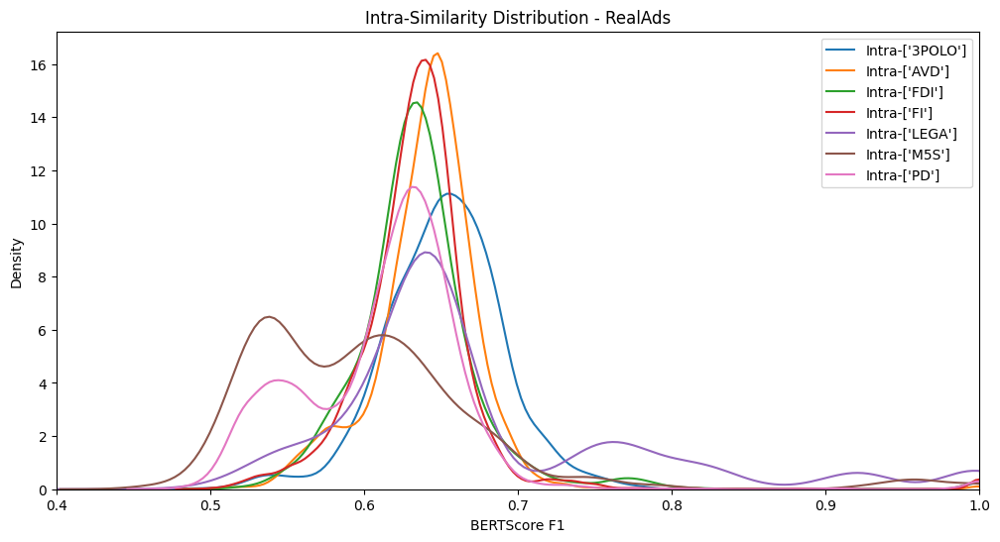

In [ ]:
plt.figure(figsize=(12, 6))
for party_i in range(n_main_parties):
  sns.kdeplot(party_similarities[party_i]['intra'], label=f'Intra-{main_parties[party_i]}')

plt.title('Intra-Similarity Distribution - RealAds')
plt.xlabel('BERTScore F1')
plt.ylabel('Density')
plt.xlim(0.4, 1)
plt.legend()
plt.show()

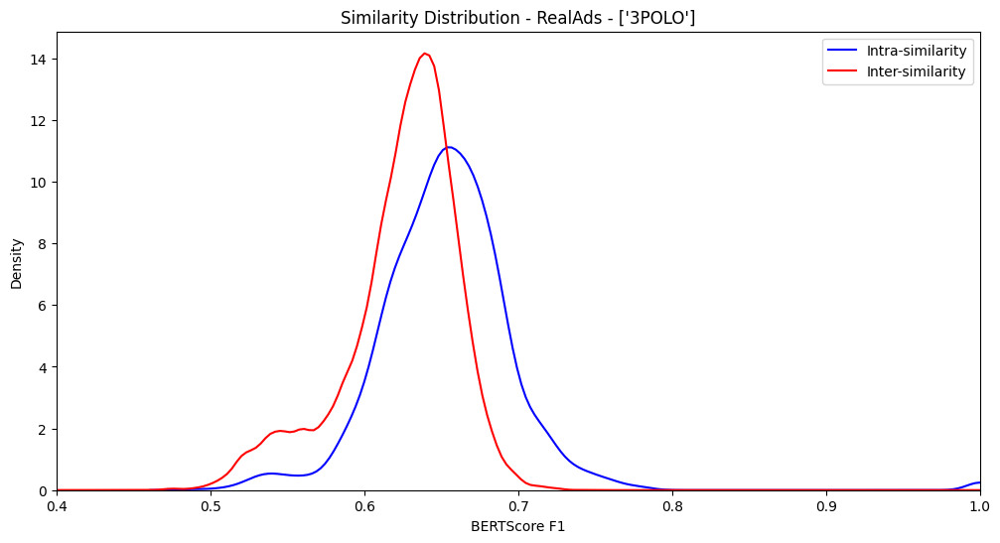

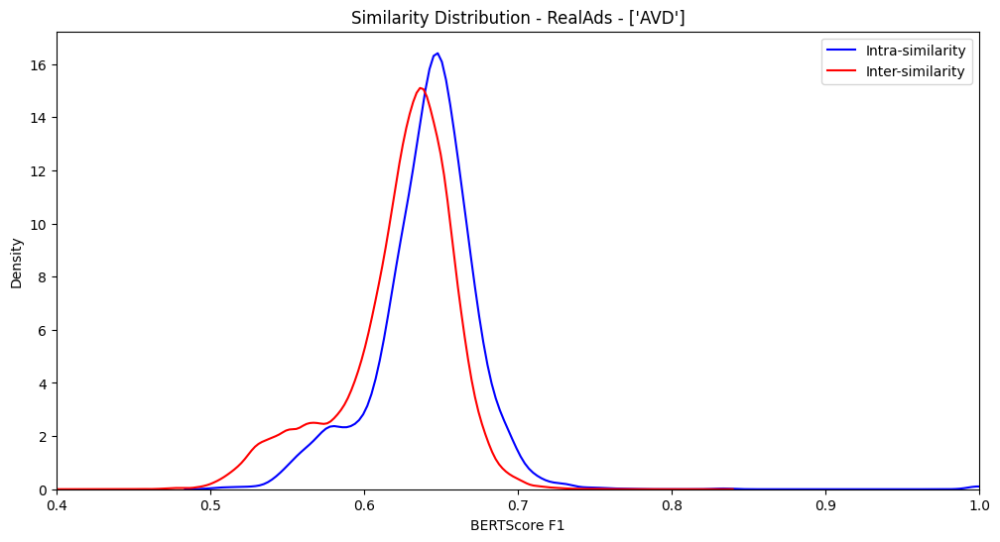

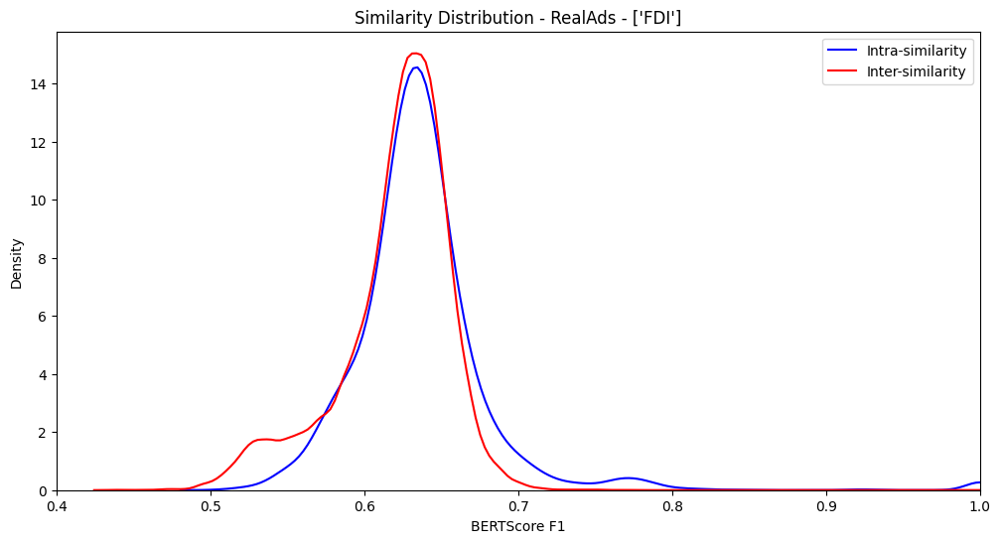

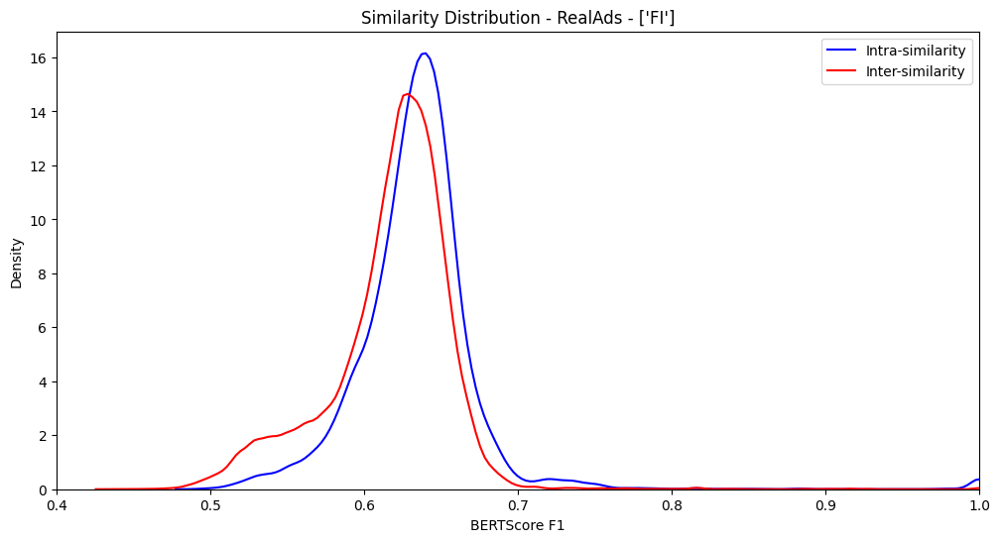

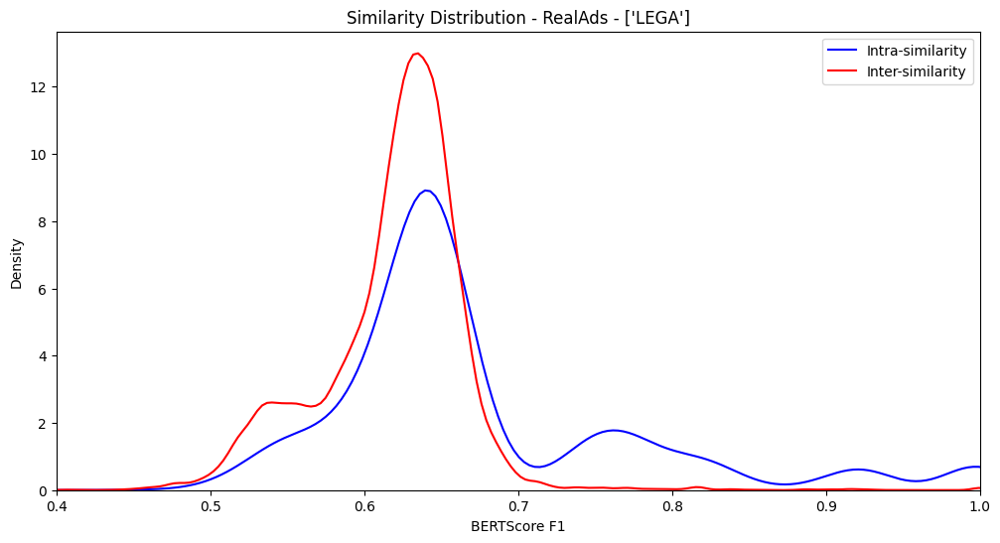

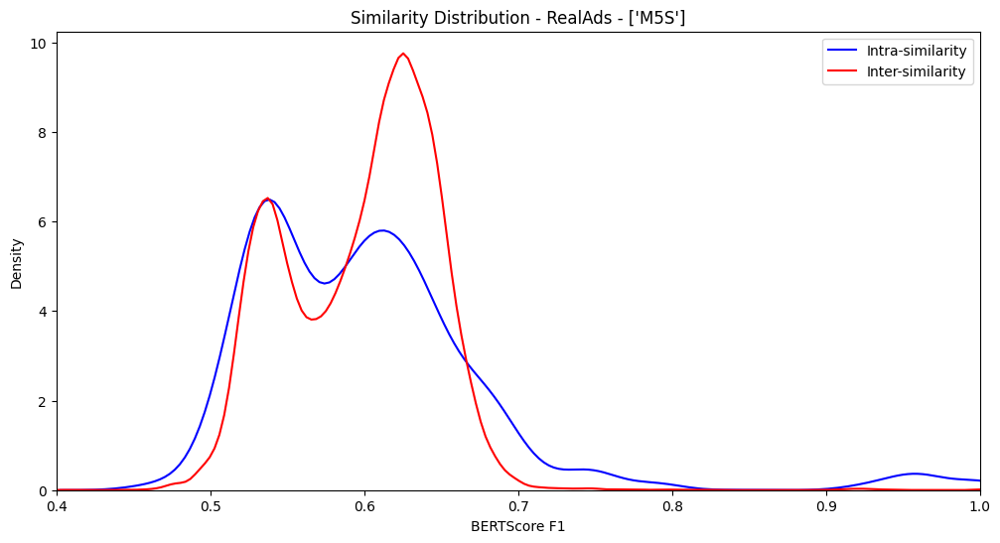

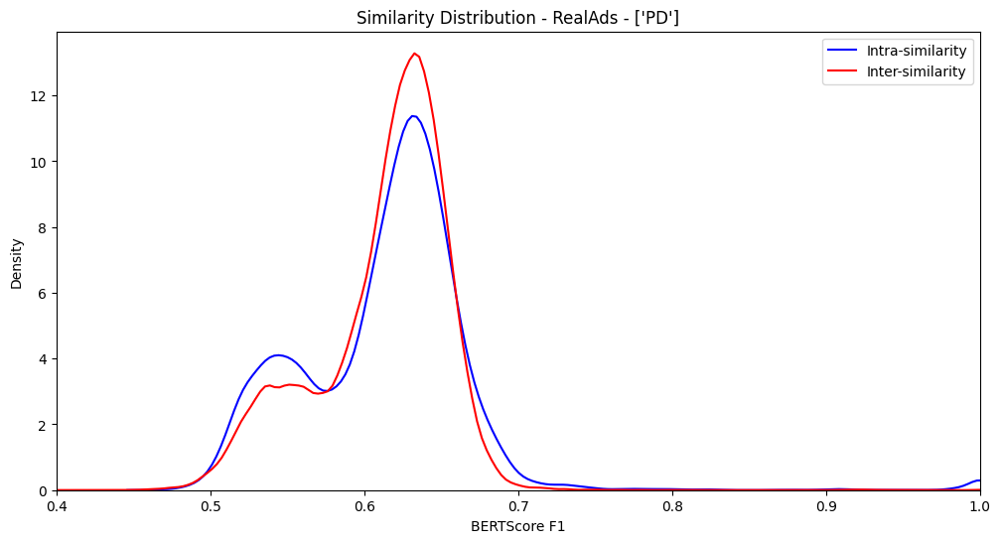

In [ ]:
for party_i in range(n_main_parties):
    plt.figure(figsize=(12, 6))
    sns.kdeplot(party_similarities[party_i]['intra'], label='Intra-similarity', color='blue')
    sns.kdeplot(party_similarities[party_i]['inter'], label='Inter-similarity', color='red')
    plt.title(f'Similarity Distribution - RealAds - {main_parties[party_i]}')
    plt.xlabel('BERTScore F1')
    plt.ylabel('Density')
    plt.xlim(0.4, 1)
    plt.legend()
    plt.show()

## Few-Shots

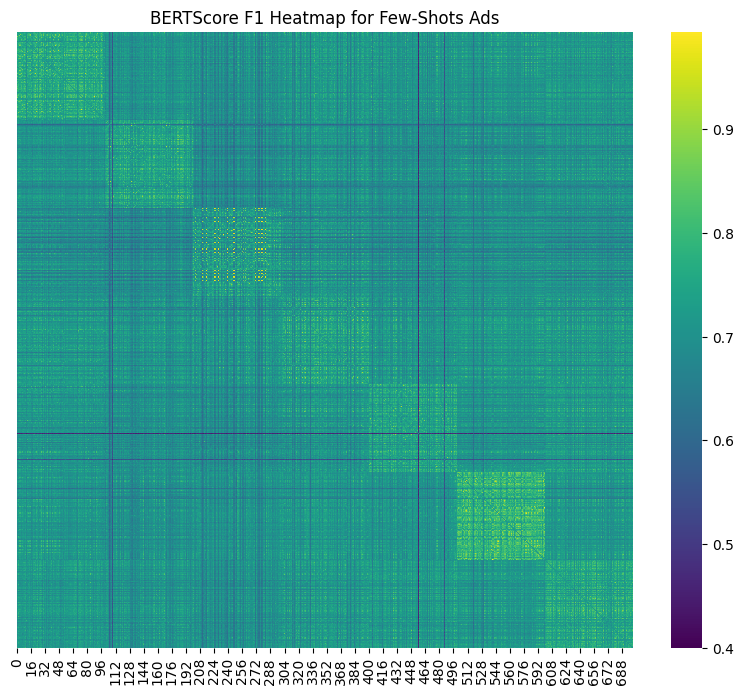

In [ ]:
# Load the bert_f1_matrix from the file
bert_f1_matrix = np.load('data/f1_matrix_few-shots.npy')
np.fill_diagonal(bert_f1_matrix, np.mean(bert_f1_matrix))

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(bert_f1_matrix, cmap="viridis", yticklabels=False, vmin=0.4, square=True)
plt.title("BERTScore F1 Heatmap for Few-Shots Ads")
plt.show()

### intra/inter similarities

In [ ]:
bert_f1_matrix = np.load('data/f1_matrix_few-shots.npy')

ads_per_party = 100
block_borders = [0, 1, 2, 3, 4, 5, 6, 7]
block_borders = [x * ads_per_party for x in block_borders]

# Initialize dictionary to store similarities
party_similarities = {}

for i in range(n_main_parties):
  party_similarities[i] = {
      'intra': [],
      'inter': []
  }
  for j in range(n_main_parties):
    # Extract the block (i, j)
    start_row = block_borders[i]
    end_row = block_borders[i + 1]
    start_col = block_borders[j]
    end_col = block_borders[j + 1]

    block = bert_f1_matrix[start_row:end_row, start_col:end_col]
    # print(f"parties: i{main_parties[i]} - j{main_parties[j]}")
    # print(f"Block {i}, {j}: {block.shape}, {start_row}:{end_row}, {start_col}:{end_col}")

    if i == j:
      # Intra-similarity (within the same block)
      party_similarities[i]['intra'].extend(block[np.triu_indices(ads_per_party, k=1)])
    else:
      # Inter-similarity (between different blocks)
      party_similarities[i]['inter'].extend(block.flatten())

# Convert to NumPy arrays for further analysis within each block
for i in range(n_main_parties):
    party_similarities[i]['intra'] = np.array(party_similarities[i]['intra'])
    party_similarities[i]['inter'] = np.array(party_similarities[i]['inter'])
    # print(f"Party {party} - Intra: {len(party_similarities[party]['intra'])}, Inter: {len(party_similarities[party]['inter'])}")

print(f"party_similarities: {party_similarities.keys()}, {party_similarities[0].keys()}")

party_similarities: dict_keys([0, 1, 2, 3, 4, 5, 6]), dict_keys(['intra', 'inter'])


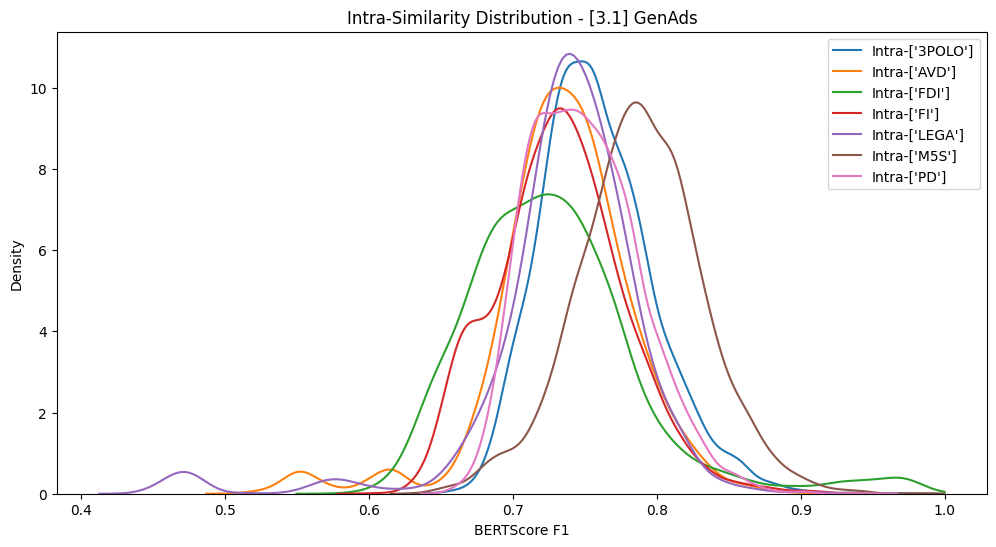

In [ ]:
plt.figure(figsize=(12, 6))
for party_i in range(n_main_parties):
  sns.kdeplot(party_similarities[party_i]['intra'], label=f'Intra-{main_parties[party_i]}', clip=(0.4, 1))

plt.title('Intra-Similarity Distribution - [3.1] GenAds')
plt.xlabel('BERTScore F1')
plt.ylabel('Density')
plt.legend()
plt.show()

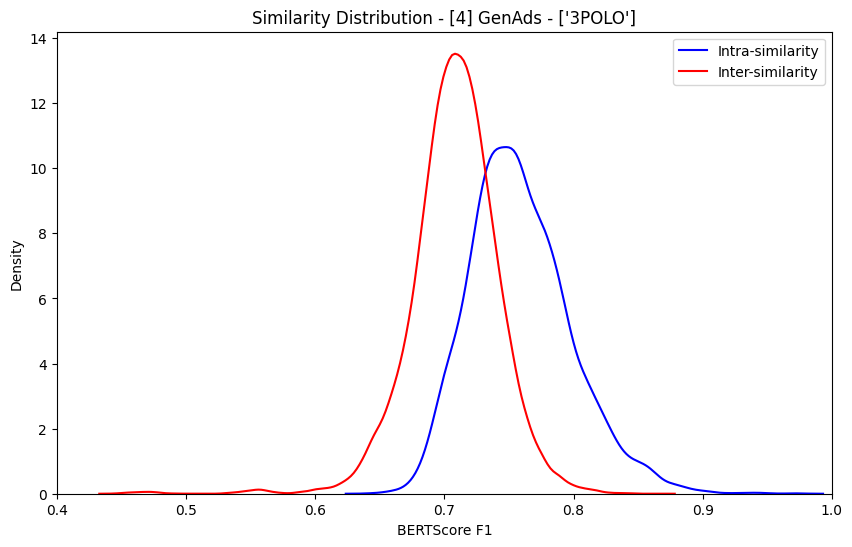

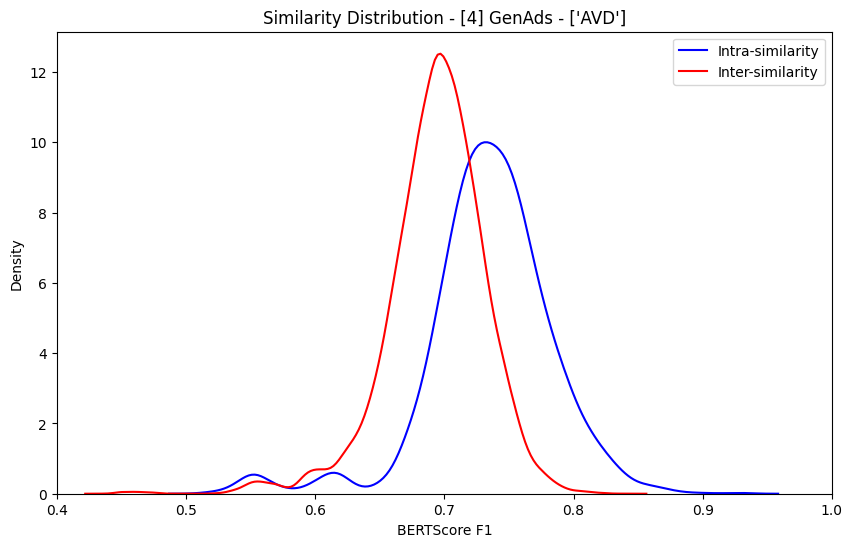

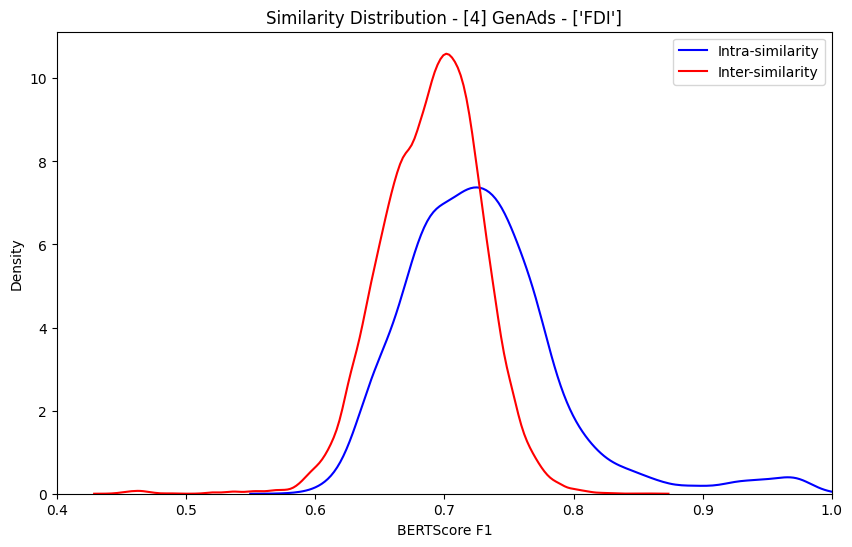

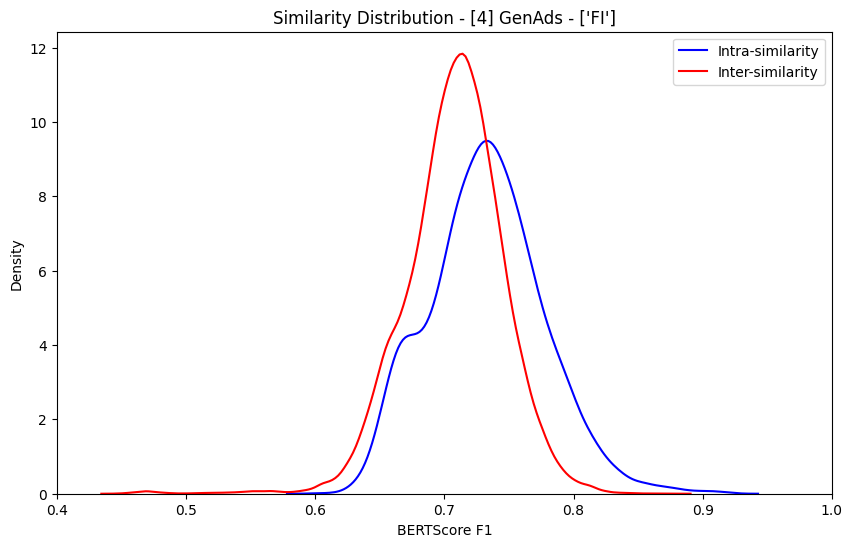

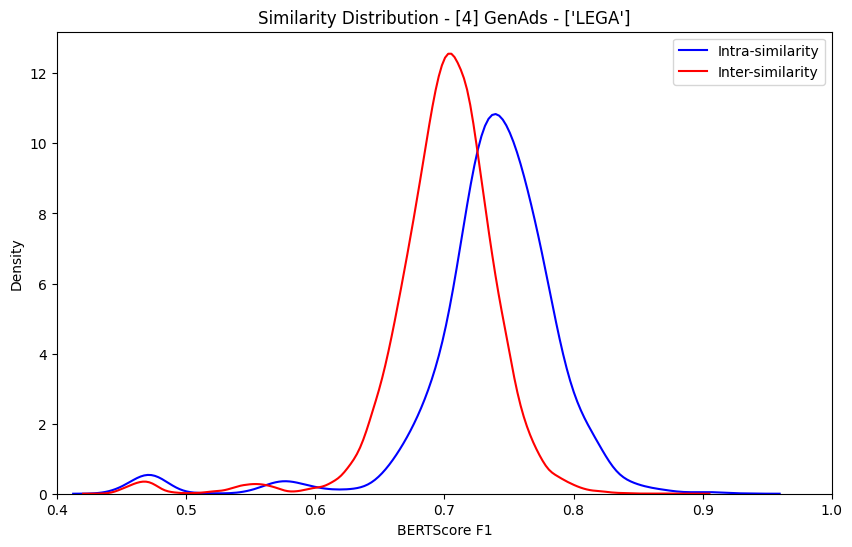

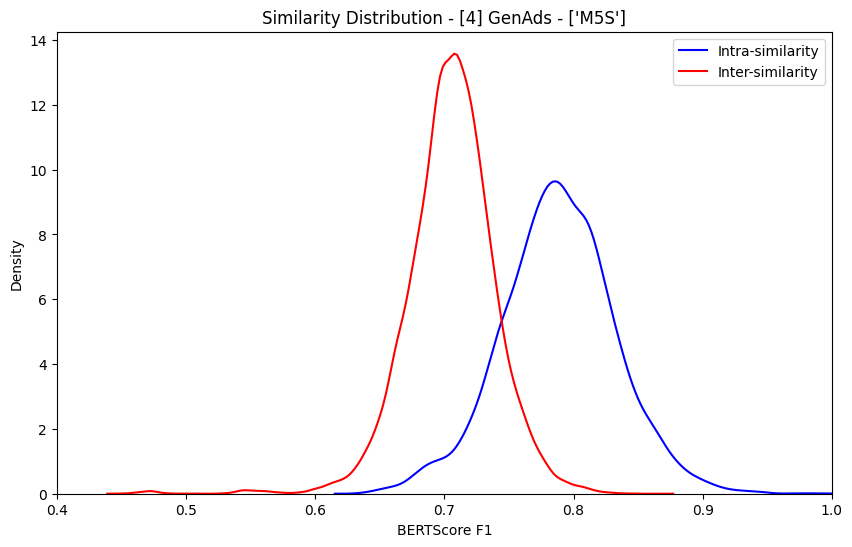

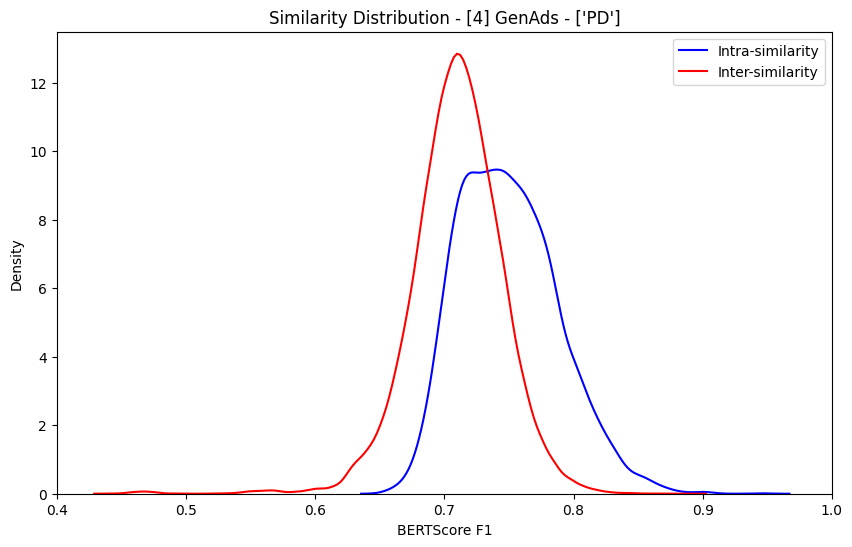

In [ ]:
for party_i in range(n_main_parties):
    plt.figure(figsize=(10, 6))
    sns.kdeplot(party_similarities[party_i]['intra'], label='Intra-similarity', color='blue')
    sns.kdeplot(party_similarities[party_i]['inter'], label='Inter-similarity', color='red')
    plt.title(f'Similarity Distribution - [4] GenAds - {main_parties[party_i]}')
    plt.xlabel('BERTScore F1')
    plt.ylabel('Density')
    plt.xlim(0.4, 1)
    plt.legend()
    plt.show()

## Zero-Shot

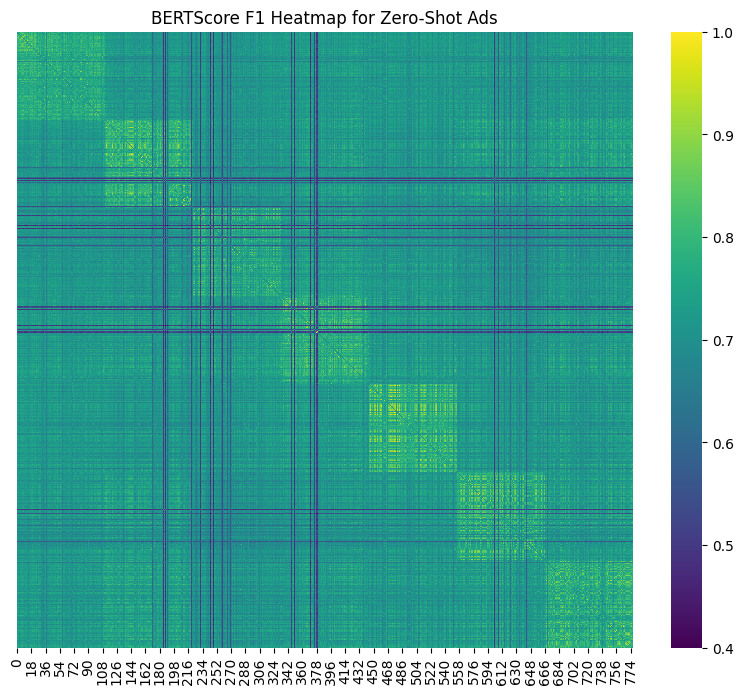

In [ ]:
# Load the bert_f1_matrix from the file
bert_f1_matrix = np.load('data/f1_matrix_zero-shot.npy')
np.fill_diagonal(bert_f1_matrix, np.mean(bert_f1_matrix))

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(bert_f1_matrix, cmap="viridis", yticklabels=False, vmin=0.4, square=True)
plt.title("BERTScore F1 Heatmap for Zero-Shot Ads")
plt.show()

### intra/inter similarities

In [ ]:
bert_f1_matrix = np.load('data/f1_matrix_zero-shot.npy')

ads_per_party = 111
block_borders = [0, 1, 2, 3, 4, 5, 6, 7]
block_borders = [x * ads_per_party for x in block_borders]

# Initialize dictionary to store similarities
party_similarities = {}

for i in range(n_main_parties):
  party_similarities[i] = {
      'intra': [],
      'inter': []
  }
  for j in range(n_main_parties):
    # Extract the block (i, j)
    start_row = block_borders[i]
    end_row = block_borders[i + 1]
    start_col = block_borders[j]
    end_col = block_borders[j + 1]

    block = bert_f1_matrix[start_row:end_row, start_col:end_col]
    # print(f"parties: i{main_parties[i]} - j{main_parties[j]}")
    # print(f"Block {i}, {j}: {block.shape}, {start_row}:{end_row}, {start_col}:{end_col}")

    if i == j:
      # Intra-similarity (within the same block)
      party_similarities[i]['intra'].extend(block[np.triu_indices(ads_per_party, k=1)])
    else:
      # Inter-similarity (between different blocks)
      party_similarities[i]['inter'].extend(block.flatten())

# Convert to NumPy arrays for further analysis within each block
for i in range(n_main_parties):
    party_similarities[i]['intra'] = np.array(party_similarities[i]['intra'])
    party_similarities[i]['inter'] = np.array(party_similarities[i]['inter'])
    # print(f"Party {party} - Intra: {len(party_similarities[party]['intra'])}, Inter: {len(party_similarities[party]['inter'])}")

print(f"party_similarities: {party_similarities.keys()}, {party_similarities[0].keys()}")

party_similarities: dict_keys([0, 1, 2, 3, 4, 5, 6]), dict_keys(['intra', 'inter'])


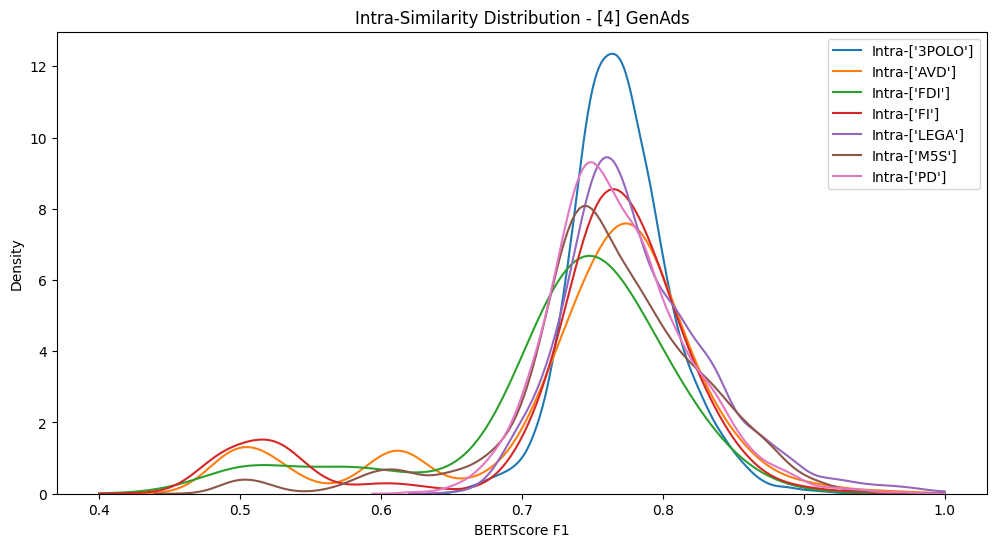

In [ ]:
plt.figure(figsize=(12, 6))
for party_i in range(n_main_parties):
  sns.kdeplot(party_similarities[party_i]['intra'], label=f'Intra-{main_parties[party_i]}', clip=(0.4, 1))

plt.title('Intra-Similarity Distribution - [4] GenAds')
plt.xlabel('BERTScore F1')
plt.ylabel('Density')
plt.legend()
plt.show()

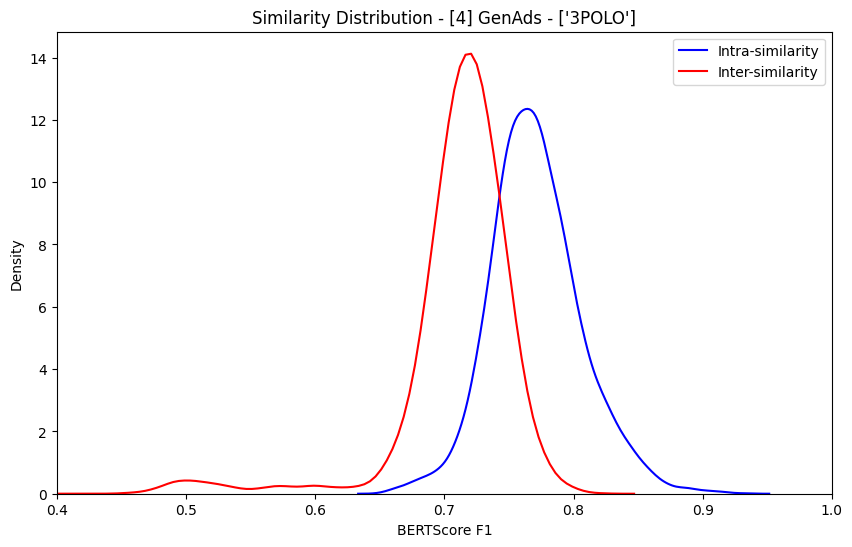

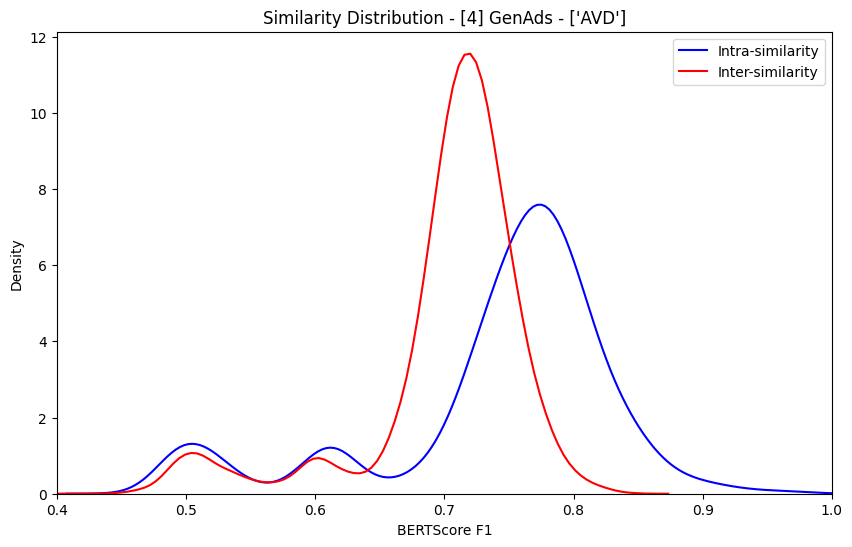

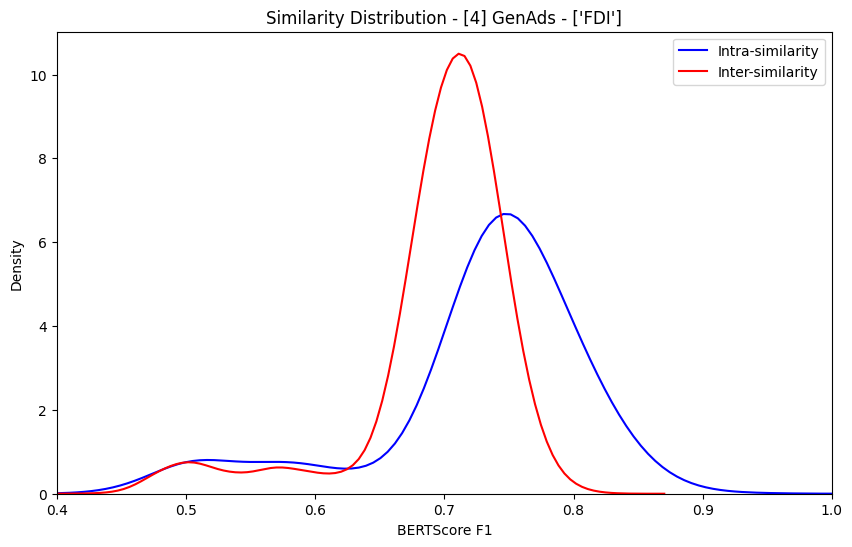

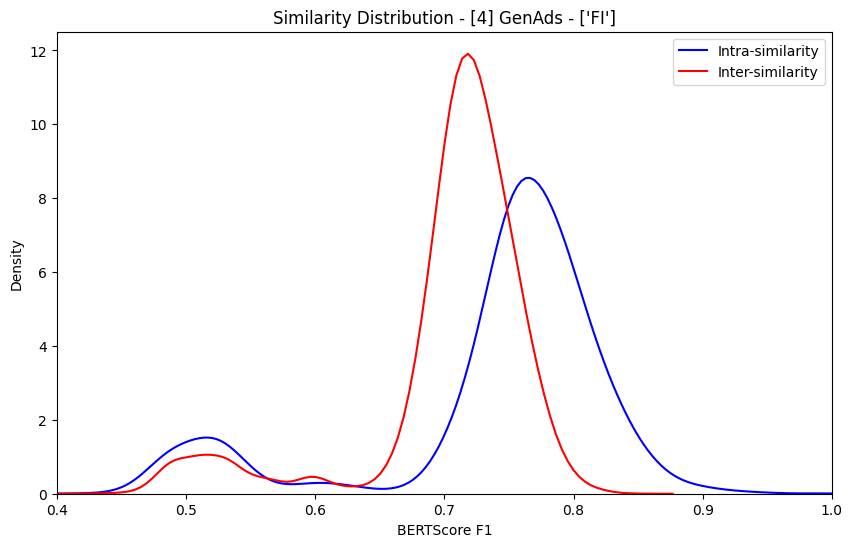

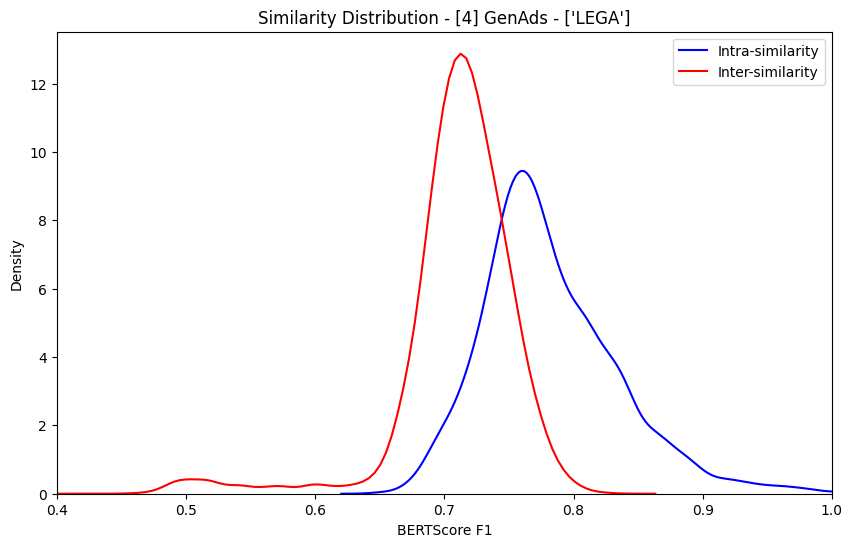

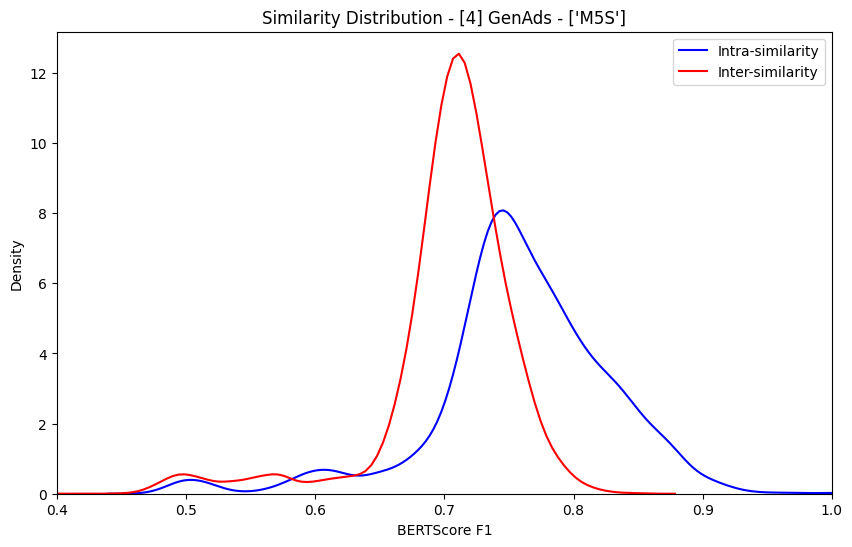

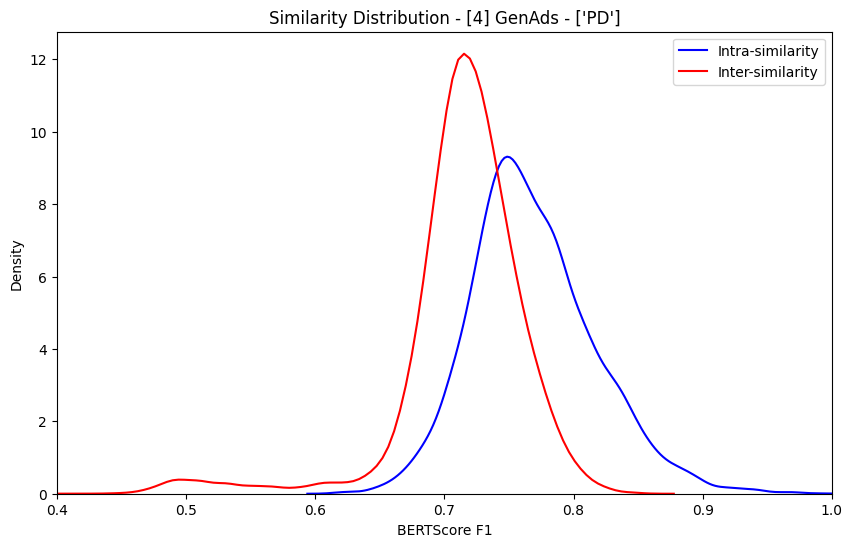

In [ ]:
for party_i in range(n_main_parties):
    plt.figure(figsize=(10, 6))
    sns.kdeplot(party_similarities[party_i]['intra'], label='Intra-similarity', color='blue')
    sns.kdeplot(party_similarities[party_i]['inter'], label='Inter-similarity', color='red')
    plt.title(f'Similarity Distribution - [4] GenAds - {main_parties[party_i]}')
    plt.xlabel('BERTScore F1')
    plt.ylabel('Density')
    plt.xlim(0.4, 1)
    plt.legend()
    plt.show()